In [3]:
# Installation des packages via conda (plus stable avec Anaconda)
import sys
!conda install -y -c conda-forge opencv pandas numpy matplotlib seaborn scikit-learn tqdm plotly scipy
!conda install -y -c anaconda tensorflow
!{sys.executable} -m pip install kagglehub

Jupyter detected...
2 channel Terms of Service accepted
doneieving notices: - 
Channels:
 - conda-forge
 - defaults
Platform: osx-64
doneecting package metadata (repodata.json): \ 
doneing environment: | 


==> WARNING: A newer version of conda exists. <==
    current version: 25.5.1
    latest version: 25.7.0

Please update conda by running

    $ conda update -n base -c defaults conda



## Package Plan ##

  environment location: /opt/anaconda3/envs/covid_ds

  added / updated specs:
    - matplotlib
    - numpy
    - opencv
    - pandas
    - plotly
    - scikit-learn
    - scipy
    - seaborn
    - tqdm


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    aom-3.6.1                  |       he965462_0         2.7 MB  conda-forge
    blas-2.305                 |         openblas          18 KB  conda-forge
    blas-devel-3.11.0          |5_hbf4f893_openblas          18 KB  conda-forge
  

In [5]:
# Imports avec gestion d'erreurs
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
import os
from tqdm import tqdm
import warnings
warnings.filterwarnings('ignore')

# Import OpenCV avec gestion d'erreur
try:
    import cv2
    print("✅ OpenCV importé avec succès")
except ImportError:
    print("❌ OpenCV non disponible. Installation en cours...")
    import sys
    !{sys.executable} -m pip install opencv-python
    import cv2
    print("✅ OpenCV installé et importé")

# Import kagglehub
try:
    import kagglehub
    print("✅ kagglehub importé avec succès")
except ImportError:
    print("❌ kagglehub non disponible. Installation en cours...")
    import sys
    !{sys.executable} -m pip install kagglehub
    import kagglehub
    print("✅ kagglehub installé et importé")

# Configuration
CLASSES = ['COVID', 'Normal', 'Viral Pneumonia']
N_CLASSES = len(CLASSES)
IMAGE_SIZE = (224, 224)
BATCH_SIZE = 32
RANDOM_STATE = 42
TEST_SIZE = 0.2
VAL_SIZE = 0.1

# Seed pour reproductibilité
np.random.seed(RANDOM_STATE)

print("\n✅ Configuration terminée!")
print(f"Python version: {sys.version}")
print(f"NumPy version: {np.__version__}")
print(f"Pandas version: {pd.__version__}")
print(f"OpenCV version: {cv2.__version__}")

❌ OpenCV non disponible. Installation en cours...
  Using cached opencv_python-4.13.0.92-cp37-abi3-macosx_14_0_x86_64.whl.metadata (19 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 32.6/32.6 MB 7.2 MB/s  0:00:04m0:00:0100:01
✅ OpenCV installé et importé
✅ kagglehub importé avec succès

✅ Configuration terminée!
Python version: 3.12.11 | packaged by Anaconda, Inc. | (main, Jun  5 2025, 08:06:15) [Clang 14.0.6 ]
NumPy version: 2.3.3
Pandas version: 2.3.3
OpenCV version: 4.13.0


In [7]:
from sklearn.model_selection import train_test_split

class COVID19DataLoader:
    """Classe pour charger et organiser le dataset COVID-19"""
    
    def __init__(self, data_path=None):
        """Initialisation"""
        self.data_path = Path(data_path) if data_path else None
        self.classes = CLASSES
        self.image_size = IMAGE_SIZE
        self.kaggle_path = None
        
    def download_from_kagglehub(self):
        """Télécharge le dataset depuis Kaggle"""
        print("📥 Téléchargement du dataset depuis Kaggle avec kagglehub...")
        
        try:
            # Download latest version
            path = kagglehub.dataset_download("tawsifurrahman/covid19-radiography-database")
            
            print(f"✅ Téléchargement terminé!")
            print(f"📁 Path to dataset files: {path}")
            
            self.kaggle_path = Path(path)
            self.data_path = self.kaggle_path
            
            return path
            
        except Exception as e:
            print(f"❌ Erreur lors du téléchargement: {e}")
            raise
    
    def explore_dataset_structure(self):
        """Explore la structure du dataset"""
        if self.data_path is None:
            print("⚠️ Dataset non chargé. Utilisez download_from_kagglehub() d'abord.")
            return None
        
        print(f"\n🔍 Exploration de la structure du dataset dans: {self.data_path}")
        
        structure = {}
        
        # Lister tous les dossiers
        for item in self.data_path.rglob('*'):
            if item.is_dir():
                # Compter les fichiers images
                images = list(item.glob('*.png')) + list(item.glob('*.jpg'))
                if images:
                    structure[str(item.relative_to(self.data_path))] = len(images)
        
        print("\n📊 Structure du dataset:")
        for folder, count in sorted(structure.items()):
            print(f"  📁 {folder}: {count} images")
        
        return structure
    
    def find_class_folders(self):
        """Trouve automatiquement les dossiers contenant les classes"""
        class_folders = {}
        
        if self.data_path is None:
            print("⚠️ Dataset non chargé.")
            return class_folders
        
        print("\n🔎 Recherche des dossiers de classes...")
        
        for class_name in self.classes:
            found = False
            
            # Patterns de recherche possibles
            search_patterns = [
                class_name,
                class_name.replace(' ', '_'),
                class_name.replace(' ', '-'),
                class_name.lower(),
                class_name.upper()
            ]
            
            for pattern in search_patterns:
                # Chercher le dossier
                possible_paths = list(self.data_path.rglob(f"*{pattern}*"))
                
                for path in possible_paths:
                    if path.is_dir():
                        # Vérifier s'il contient des images
                        images = list(path.glob('*.png')) + list(path.glob('*.jpg'))
                        
                        # Ou chercher un sous-dossier 'images'
                        if not images and (path / 'images').exists():
                            images = list((path / 'images').glob('*.png')) + \
                                    list((path / 'images').glob('*.jpg'))
                            if images:
                                path = path / 'images'
                        
                        if images:
                            class_folders[class_name] = path
                            print(f"  ✅ {class_name}: {len(images)} images trouvées dans {path.name}")
                            found = True
                            break
                
                if found:
                    break
            
            if not found:
                print(f"  ❌ {class_name}: Non trouvé")
        
        return class_folders
    
    def load_dataset_info(self, auto_find=True, max_images_per_class=None):
        """
        Charge les informations sur le dataset
        
        Args:
            auto_find (bool): Rechercher automatiquement les dossiers
            max_images_per_class (int): Limite d'images par classe (None = toutes)
        """
        print("\n📊 Chargement des informations du dataset...")
        
        # Télécharger si nécessaire
        if self.data_path is None:
            self.download_from_kagglehub()
        
        # Trouver les dossiers de classes
        if auto_find:
            class_folders = self.find_class_folders()
        else:
            class_folders = {cls: self.data_path / cls for cls in self.classes}
        
        data_info = []
        
        for class_name in tqdm(self.classes, desc="Chargement des classes"):
            if class_name not in class_folders:
                print(f"⚠️ Classe {class_name} non trouvée")
                continue
            
            class_path = class_folders[class_name]
            
            # Charger les images
            images = list(class_path.glob('*.png')) + list(class_path.glob('*.jpg'))
            
            # Limiter le nombre d'images si spécifié
            if max_images_per_class:
                images = images[:max_images_per_class]
            
            for img_path in tqdm(images, desc=f"  {class_name}", leave=False):
                try:
                    # Récupérer les informations de l'image
                    img = cv2.imread(str(img_path), cv2.IMREAD_GRAYSCALE)
                    
                    if img is not None:
                        data_info.append({
                            'filename': img_path.name,
                            'class': class_name,
                            'class_encoded': self.classes.index(class_name),
                            'path': str(img_path),
                            'height': img.shape[0],
                            'width': img.shape[1],
                            'aspect_ratio': img.shape[1] / img.shape[0],
                            'size_kb': img_path.stat().st_size / 1024,
                            'mean_intensity': np.mean(img),
                            'std_intensity': np.std(img),
                            'min_intensity': np.min(img),
                            'max_intensity': np.max(img),
                            'median_intensity': np.median(img)
                        })
                except Exception as e:
                    pass
        
        df = pd.DataFrame(data_info)
        
        if len(df) == 0:
            print("❌ Aucune image chargée!")
            return df
        
        print(f"\n✅ {len(df)} images chargées!")
        print(f"\n📊 Distribution par classe:")
        print(df['class'].value_counts())
        
        return df

print("✅ Classe COVID19DataLoader créée!")

✅ Classe COVID19DataLoader créée!


In [8]:
# Créer une instance du loader
loader = COVID19DataLoader()

# Télécharger le dataset
dataset_path = loader.download_from_kagglehub()

📥 Téléchargement du dataset depuis Kaggle avec kagglehub...


100%|█████████████████████████████████████████████████████████████████████████████████████| 778M/778M [01:38<00:00, 8.26MB/s]

Extracting files...


✅ Téléchargement terminé!
📁 Path to dataset files: /Users/pcphonemac/.cache/kagglehub/datasets/tawsifurrahman/covid19-radiography-database/versions/5


In [9]:
# Explorer la structure du dataset
structure = loader.explore_dataset_structure()


🔍 Exploration de la structure du dataset dans: /Users/pcphonemac/.cache/kagglehub/datasets/tawsifurrahman/covid19-radiography-database/versions/5

📊 Structure du dataset:
  📁 COVID-19_Radiography_Dataset/COVID/images: 3616 images
  📁 COVID-19_Radiography_Dataset/COVID/masks: 3616 images
  📁 COVID-19_Radiography_Dataset/Lung_Opacity/images: 6012 images
  📁 COVID-19_Radiography_Dataset/Lung_Opacity/masks: 6012 images
  📁 COVID-19_Radiography_Dataset/Normal/images: 10192 images
  📁 COVID-19_Radiography_Dataset/Normal/masks: 10192 images
  📁 COVID-19_Radiography_Dataset/Viral Pneumonia/images: 1345 images
  📁 COVID-19_Radiography_Dataset/Viral Pneumonia/masks: 1345 images


In [10]:
# Charger les informations du dataset
# Pour un test rapide, on limite à 100 images par classe
df = loader.load_dataset_info(max_images_per_class=100)

# Afficher les premières lignes
print("\n📋 Aperçu des données:")
display(df.head(10))

# Informations sur le DataFrame
print("\n📊 Informations sur le DataFrame:")
print(df.info())


📊 Chargement des informations du dataset...

🔎 Recherche des dossiers de classes...
  ✅ COVID: 3616 images trouvées dans images
  ✅ Normal: 10192 images trouvées dans images
  ✅ Viral Pneumonia: 1345 images trouvées dans images


Chargement des classes: 100%|██████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00,  3.65it/s]


✅ 300 images chargées!

📊 Distribution par classe:
class
COVID              100
Normal             100
Viral Pneumonia    100
Name: count, dtype: int64

📋 Aperçu des données:


,filename,class,class_encoded,path,height,width,aspect_ratio,size_kb,mean_intensity,std_intensity,min_intensity,max_intensity,median_intensity
0,COVID-1.png,COVID,0,/Users/pcphonemac/.cache/kagglehub/datasets/ta...,299,299,1.0,27.547852,145.896847,51.816632,0,255,154.0
1,COVID-1175.png,COVID,0,/Users/pcphonemac/.cache/kagglehub/datasets/ta...,299,299,1.0,37.037109,148.214215,65.081377,0,250,171.0
2,COVID-1613.png,COVID,0,/Users/pcphonemac/.cache/kagglehub/datasets/ta...,299,299,1.0,39.275391,173.977718,54.045705,0,255,181.0
3,COVID-948.png,COVID,0,/Users/pcphonemac/.cache/kagglehub/datasets/ta...,299,299,1.0,25.404297,133.255087,44.188394,0,249,147.0
4,COVID-790.png,COVID,0,/Users/pcphonemac/.cache/kagglehub/datasets/ta...,299,299,1.0,34.417969,138.800013,53.869348,0,255,153.0
5,COVID-3004.png,COVID,0,/Users/pcphonemac/.cache/kagglehub/datasets/ta...,299,299,1.0,37.290039,143.034138,62.204933,0,247,153.0
6,COVID-3010.png,COVID,0,/Users/pcphonemac/.cache/kagglehub/datasets/ta...,299,299,1.0,39.487305,139.305791,54.203604,0,236,146.0
7,COVID-1607.png,COVID,0,/Users/pcphonemac/.cache/kagglehub/datasets/ta...,299,299,1.0,33.555664,145.582354,35.879761,23,202,156.0
8,COVID-784.png,COVID,0,/Users/pcphonemac/.cache/kagglehub/datasets/ta...,299,299,1.0,34.686523,155.086386,52.020994,0,255,172.0
9,COVID-1161.png,COVID,0,/Users/pcphonemac/.cache/kagglehub/datasets/ta...,299,299,1.0,32.221680,136.553439,75.356952,0,254,138.0



📊 Informations sur le DataFrame:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 13 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   filename          300 non-null    object 
 1   class             300 non-null    object 
 2   class_encoded     300 non-null    int64  
 3   path              300 non-null    object 
 4   height            300 non-null    int64  
 5   width             300 non-null    int64  
 6   aspect_ratio      300 non-null    float64
 7   size_kb           300 non-null    float64
 8   mean_intensity    300 non-null    float64
 9   std_intensity     300 non-null    float64
 10  min_intensity     300 non-null    uint8  
 11  max_intensity     300 non-null    uint8  
 12  median_intensity  300 non-null    float64
dtypes: float64(5), int64(3), object(3), uint8(2)
memory usage: 26.5+ KB
None


In [11]:
# Statistiques descriptives
print("📊 STATISTIQUES DESCRIPTIVES:")
print("="*60)
display(df.describe())

print("\n📊 STATISTIQUES PAR CLASSE:")
print("="*60)
for col in ['height', 'width', 'mean_intensity', 'size_kb']:
    print(f"\n{col.upper()}:")
    display(df.groupby('class')[col].describe())

📊 STATISTIQUES DESCRIPTIVES:


,class_encoded,height,width,aspect_ratio,size_kb,mean_intensity,std_intensity,min_intensity,max_intensity,median_intensity
count,300.000000,300.0,300.0,300.0,300.000000,300.000000,300.000000,300.000000,300.000000,300.000000
mean,1.000000,299.0,299.0,1.0,36.833971,130.388166,58.472643,1.580000,241.626667,139.666667
std,0.817861,0.0,0.0,0.0,4.685364,22.005229,12.573802,7.146129,18.447629,26.645993
min,0.000000,299.0,299.0,1.0,23.641602,62.413843,20.232981,0.000000,164.000000,65.000000
25%,0.000000,299.0,299.0,1.0,34.604248,113.761323,50.869918,0.000000,235.500000,122.000000
50%,1.000000,299.0,299.0,1.0,36.584473,130.393843,59.709708,0.000000,250.000000,141.000000
75%,2.000000,299.0,299.0,1.0,38.560303,146.153469,68.070122,0.000000,255.000000,156.250000
max,2.000000,299.0,299.0,1.0,61.569336,182.855438,93.798785,51.000000,255.000000,203.000000



📊 STATISTIQUES PAR CLASSE:

HEIGHT:


,count,mean,std,min,25%,50%,75%,max
class,,,,,,,,
COVID,100.0,299.0,0.0,299.0,299.0,299.0,299.0,299.0
Normal,100.0,299.0,0.0,299.0,299.0,299.0,299.0,299.0
Viral Pneumonia,100.0,299.0,0.0,299.0,299.0,299.0,299.0,299.0



WIDTH:


,count,mean,std,min,25%,50%,75%,max
class,,,,,,,,
COVID,100.0,299.0,0.0,299.0,299.0,299.0,299.0,299.0
Normal,100.0,299.0,0.0,299.0,299.0,299.0,299.0,299.0
Viral Pneumonia,100.0,299.0,0.0,299.0,299.0,299.0,299.0,299.0



MEAN_INTENSITY:


,count,mean,std,min,25%,50%,75%,max
class,,,,,,,,
COVID,100.0,140.046474,22.746254,62.413843,132.553604,142.656648,154.091649,182.855438
Normal,100.0,127.420358,21.404303,84.425342,111.400893,125.721301,140.775235,179.479972
Viral Pneumonia,100.0,123.697665,18.401073,77.191911,112.231507,121.194064,134.556660,166.938457



SIZE_KB:


,count,mean,std,min,25%,50%,75%,max
class,,,,,,,,
COVID,100.0,34.898750,4.016176,23.641602,32.534912,34.952637,37.416992,44.599609
Normal,100.0,36.352891,3.022226,24.625000,34.886963,36.343262,37.853271,46.422852
Viral Pneumonia,100.0,39.250273,5.578862,32.948242,36.195801,38.018555,39.630127,61.569336


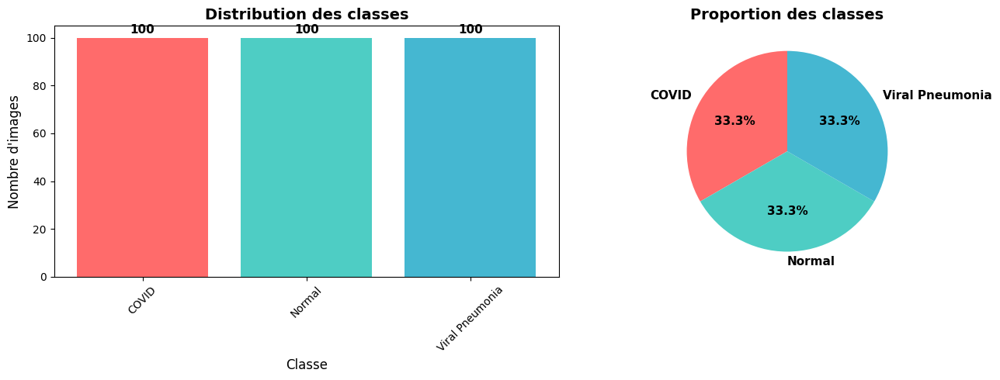


📊 Test du Chi-2 d'équilibre des classes:
   Chi-2 = 0.00, p-value = 1.0000
   ✅ Les classes sont relativement équilibrées


In [12]:
# Distribution des classes
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Graphique en barres
class_counts = df['class'].value_counts()
colors = ['#FF6B6B', '#4ECDC4', '#45B7D1']

axes[0].bar(class_counts.index, class_counts.values, color=colors)
axes[0].set_title('Distribution des classes', fontsize=14, fontweight='bold')
axes[0].set_xlabel('Classe', fontsize=12)
axes[0].set_ylabel('Nombre d\'images', fontsize=12)
axes[0].tick_params(axis='x', rotation=45)

# Ajouter les valeurs sur les barres
for i, v in enumerate(class_counts.values):
    axes[0].text(i, v + 2, str(v), ha='center', fontweight='bold', fontsize=11)

# Graphique en camembert
axes[1].pie(class_counts.values, labels=class_counts.index, autopct='%1.1f%%',
           colors=colors, startangle=90, textprops={'fontsize': 11, 'fontweight': 'bold'})
axes[1].set_title('Proportion des classes', fontsize=14, fontweight='bold')

plt.tight_layout()
plt.show()

# Test statistique d'équilibre
from scipy import stats
chi2, p_value = stats.chisquare(class_counts.values)
print(f"\n📊 Test du Chi-2 d'équilibre des classes:")
print(f"   Chi-2 = {chi2:.2f}, p-value = {p_value:.4f}")
if p_value < 0.05:
    print("   ⚠️ Les classes sont significativement déséquilibrées")
else:
    print("   ✅ Les classes sont relativement équilibrées")

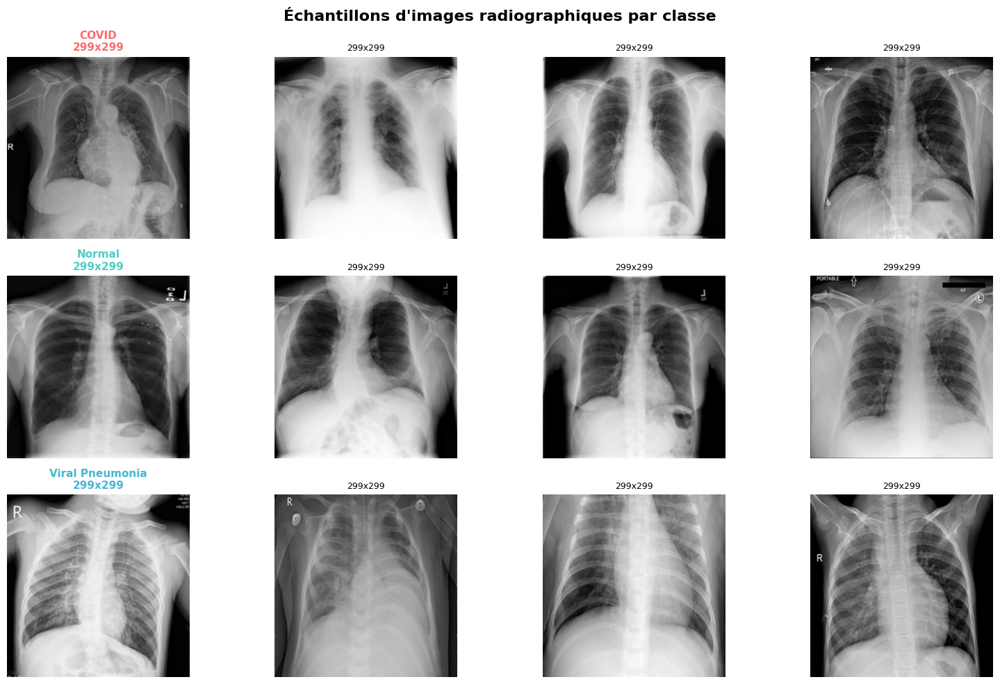

In [13]:
# Afficher des échantillons d'images
n_samples = 4
classes = df['class'].unique()

fig, axes = plt.subplots(len(classes), n_samples, figsize=(16, 10))

for i, class_name in enumerate(classes):
    class_df = df[df['class'] == class_name].sample(min(n_samples, len(df[df['class'] == class_name])), 
                                                     random_state=42)
    
    for j, (_, row) in enumerate(class_df.iterrows()):
        img = cv2.imread(row['path'], cv2.IMREAD_GRAYSCALE)
        
        axes[i, j].imshow(img, cmap='gray')
        axes[i, j].axis('off')
        
        if j == 0:
            axes[i, j].set_title(f'{class_name}\n{img.shape[0]}x{img.shape[1]}', 
                                fontweight='bold', fontsize=11, color=colors[i])
        else:
            axes[i, j].set_title(f'{img.shape[0]}x{img.shape[1]}', fontsize=9)

plt.suptitle('Échantillons d\'images radiographiques par classe', 
             fontsize=16, fontweight='bold', y=0.98)
plt.tight_layout()
plt.show()

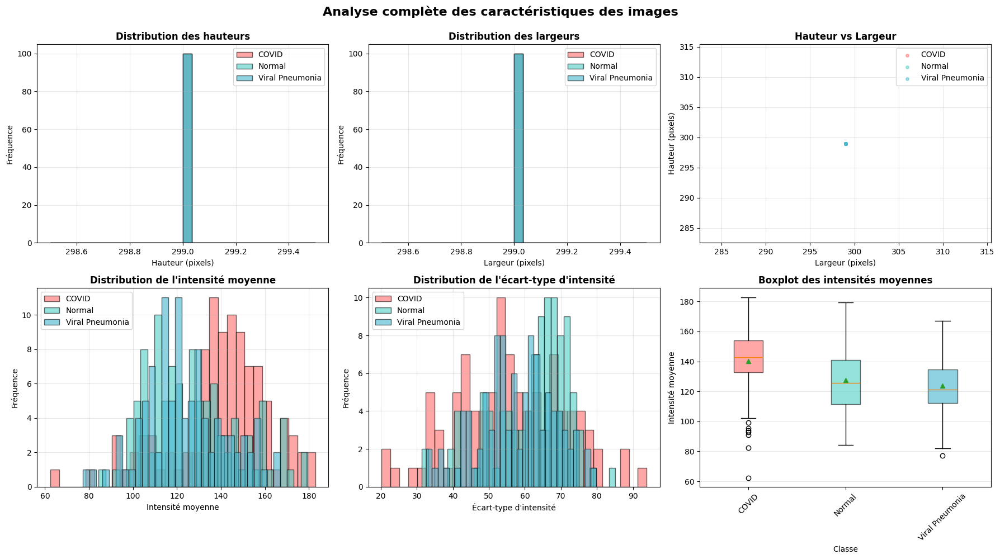


📊 TESTS STATISTIQUES ENTRE LES CLASSES:

1. ANOVA - Intensité moyenne:
   F-statistic = 16.7624, p-value = 1.2663e-07
   ✅ Il existe une différence significative entre les classes

2. Kruskal-Wallis - Écart-type d'intensité:
   H-statistic = 15.1984, p-value = 5.0086e-04
   ✅ Il existe une différence significative entre les classes


In [16]:
# Analyse complète des dimensions et intensités
fig, axes = plt.subplots(2, 3, figsize=(18, 10))

# 1. Distribution des hauteurs
for class_name, color in zip(df['class'].unique(), colors):
    class_data = df[df['class'] == class_name]
    axes[0, 0].hist(class_data['height'], alpha=0.6, label=class_name, 
                   bins=30, color=color, edgecolor='black')
axes[0, 0].set_title('Distribution des hauteurs', fontweight='bold', fontsize=12)
axes[0, 0].set_xlabel('Hauteur (pixels)')
axes[0, 0].set_ylabel('Fréquence')
axes[0, 0].legend()
axes[0, 0].grid(alpha=0.3)

# 2. Distribution des largeurs
for class_name, color in zip(df['class'].unique(), colors):
    class_data = df[df['class'] == class_name]
    axes[0, 1].hist(class_data['width'], alpha=0.6, label=class_name, 
                   bins=30, color=color, edgecolor='black')
axes[0, 1].set_title('Distribution des largeurs', fontweight='bold', fontsize=12)
axes[0, 1].set_xlabel('Largeur (pixels)')
axes[0, 1].set_ylabel('Fréquence')
axes[0, 1].legend()
axes[0, 1].grid(alpha=0.3)

# 3. Scatter hauteur vs largeur
for class_name, color in zip(df['class'].unique(), colors):
    class_data = df[df['class'] == class_name]
    axes[0, 2].scatter(class_data['width'], class_data['height'], 
                      alpha=0.5, label=class_name, color=color, s=15)
axes[0, 2].set_title('Hauteur vs Largeur', fontweight='bold', fontsize=12)
axes[0, 2].set_xlabel('Largeur (pixels)')
axes[0, 2].set_ylabel('Hauteur (pixels)')
axes[0, 2].legend()
axes[0, 2].grid(alpha=0.3)

# 4. Distribution de l'intensité moyenne
for class_name, color in zip(df['class'].unique(), colors):
    class_data = df[df['class'] == class_name]
    axes[1, 0].hist(class_data['mean_intensity'], alpha=0.6, label=class_name, 
                   bins=30, color=color, edgecolor='black')
axes[1, 0].set_title('Distribution de l\'intensité moyenne', fontweight='bold', fontsize=12)
axes[1, 0].set_xlabel('Intensité moyenne')
axes[1, 0].set_ylabel('Fréquence')
axes[1, 0].legend()
axes[1, 0].grid(alpha=0.3)

# 5. Distribution de l'écart-type d'intensité
for class_name, color in zip(df['class'].unique(), colors):
    class_data = df[df['class'] == class_name]
    axes[1, 1].hist(class_data['std_intensity'], alpha=0.6, label=class_name, 
                   bins=30, color=color, edgecolor='black')
axes[1, 1].set_title('Distribution de l\'écart-type d\'intensité', fontweight='bold', fontsize=12)
axes[1, 1].set_xlabel('Écart-type d\'intensité')
axes[1, 1].set_ylabel('Fréquence')
axes[1, 1].legend()
axes[1, 1].grid(alpha=0.3)

# 6. Boxplot des intensités moyennes par classe
data_for_boxplot = [df[df['class'] == class_name]['mean_intensity'].values 
                    for class_name in df['class'].unique()]
bp = axes[1, 2].boxplot(data_for_boxplot, labels=df['class'].unique(), 
                        patch_artist=True, showmeans=True)
for patch, color in zip(bp['boxes'], colors):
    patch.set_facecolor(color)
    patch.set_alpha(0.6)
axes[1, 2].set_title('Boxplot des intensités moyennes', fontweight='bold', fontsize=12)
axes[1, 2].set_xlabel('Classe')
axes[1, 2].set_ylabel('Intensité moyenne')
axes[1, 2].tick_params(axis='x', rotation=45)
axes[1, 2].grid(alpha=0.3, axis='y')

plt.suptitle('Analyse complète des caractéristiques des images', 
             fontsize=16, fontweight='bold', y=0.995)
plt.tight_layout()
plt.show()

# Tests statistiques
print("\n📊 TESTS STATISTIQUES ENTRE LES CLASSES:")
print("="*60)

from scipy.stats import f_oneway, kruskal

# Test ANOVA pour l'intensité moyenne
groups = [df[df['class'] == class_name]['mean_intensity'].values 
          for class_name in df['class'].unique()]
f_stat, p_value = f_oneway(*groups)
print(f"\n1. ANOVA - Intensité moyenne:")
print(f"   F-statistic = {f_stat:.4f}, p-value = {p_value:.4e}")
if p_value < 0.05:
    print("   ✅ Il existe une différence significative entre les classes")
else:
    print("   ⚠️ Pas de différence significative entre les classes")

# Test de Kruskal-Wallis pour l'écart-type
groups_std = [df[df['class'] == class_name]['std_intensity'].values 
              for class_name in df['class'].unique()]
h_stat, p_value_kw = kruskal(*groups_std)
print(f"\n2. Kruskal-Wallis - Écart-type d'intensité:")
print(f"   H-statistic = {h_stat:.4f}, p-value = {p_value_kw:.4e}")
if p_value_kw < 0.05:
    print("   ✅ Il existe une différence significative entre les classes")
else:
    print("   ⚠️ Pas de différence significative entre les classes")

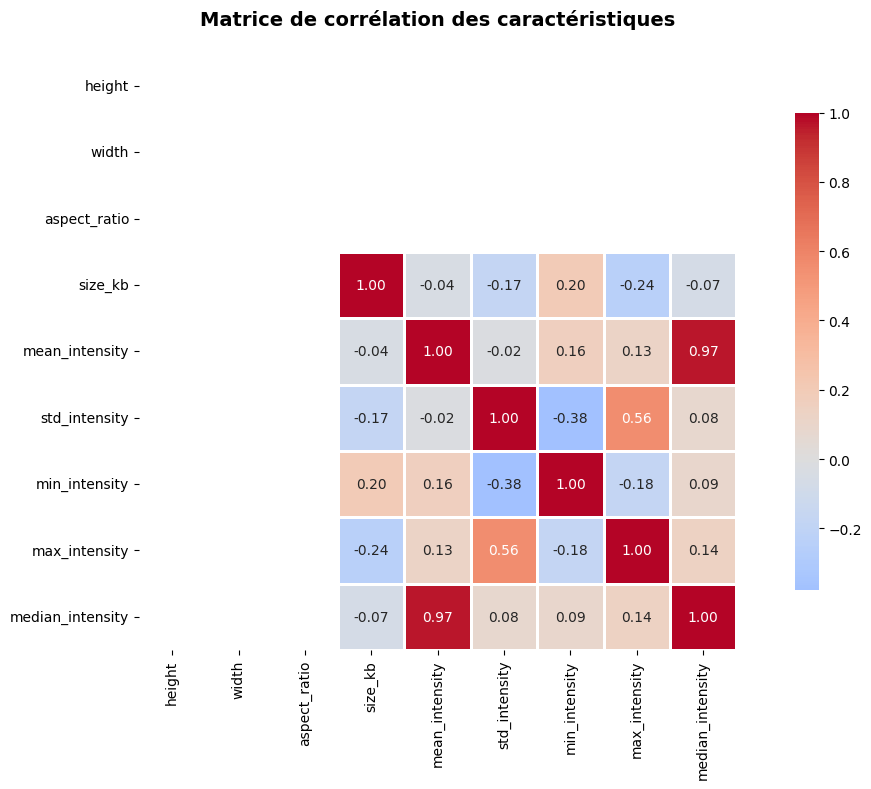


🔍 CORRÉLATIONS FORTES (|r| > 0.7):
  • mean_intensity ↔ median_intensity: 0.965


In [17]:
# Matrice de corrélation des caractéristiques numériques
plt.figure(figsize=(12, 8))

# Sélectionner les colonnes numériques
numeric_cols = ['height', 'width', 'aspect_ratio', 'size_kb', 
                'mean_intensity', 'std_intensity', 'min_intensity', 
                'max_intensity', 'median_intensity']

# Calculer la matrice de corrélation
correlation_matrix = df[numeric_cols].corr()

# Créer le heatmap
sns.heatmap(correlation_matrix, annot=True, fmt='.2f', cmap='coolwarm', 
            center=0, square=True, linewidths=1, cbar_kws={"shrink": 0.8})

plt.title('Matrice de corrélation des caractéristiques', 
          fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

# Identifier les corrélations fortes
print("\n🔍 CORRÉLATIONS FORTES (|r| > 0.7):")
print("="*60)
for i in range(len(correlation_matrix.columns)):
    for j in range(i+1, len(correlation_matrix.columns)):
        corr_value = correlation_matrix.iloc[i, j]
        if abs(corr_value) > 0.7:
            print(f"  • {correlation_matrix.columns[i]} ↔ {correlation_matrix.columns[j]}: {corr_value:.3f}")

In [18]:
# Sauvegarder le DataFrame
df.to_csv('covid19_dataset_info.csv', index=False)
print("✅ DataFrame sauvegardé dans 'covid19_dataset_info.csv'")

# Créer un rapport résumé
print("\n" + "="*70)
print("📊 RAPPORT RÉSUMÉ - EXPLORATION DES DONNÉES")
print("="*70)

print(f"\n1️⃣ VOLUMÉTRIE:")
print(f"   • Nombre total d'images: {len(df)}")
print(f"   • Nombre de classes: {len(df['class'].unique())}")
print(f"   • Classes: {', '.join(df['class'].unique())}")

print(f"\n2️⃣ DISTRIBUTION PAR CLASSE:")
for class_name, count in df['class'].value_counts().items():
    percentage = count/len(df)*100
    print(f"   • {class_name}: {count} images ({percentage:.1f}%)")

print(f"\n3️⃣ DIMENSIONS DES IMAGES:")
print(f"   • Hauteur moyenne: {df['height'].mean():.0f} ± {df['height'].std():.0f} pixels")
print(f"   • Largeur moyenne: {df['width'].mean():.0f} ± {df['width'].std():.0f} pixels")
print(f"   • Taille moyenne: {df['size_kb'].mean():.1f} ± {df['size_kb'].std():.1f} KB")

print(f"\n4️⃣ INTENSITÉS:")
print(f"   • Intensité moyenne: {df['mean_intensity'].mean():.1f} ± {df['mean_intensity'].std():.1f}")
print(f"   • Écart-type moyen: {df['std_intensity'].mean():.1f} ± {df['std_intensity'].std():.1f}")

print(f"\n5️⃣ RECOMMANDATIONS POUR LE PREPROCESSING:")
# Vérifier si les images ont des tailles différentes
unique_sizes = df.groupby(['height', 'width']).size()
if len(unique_sizes) > 1:
    print(f"   ⚠️ Les images ont des tailles variées ({len(unique_sizes)} tailles différentes)")
    print(f"   → Redimensionnement nécessaire à {IMAGE_SIZE}")
else:
    print(f"   ✅ Toutes les images ont la même taille")

# Vérifier l'équilibre des classes
class_counts = df['class'].value_counts()
max_count = class_counts.max()
min_count = class_counts.min()
imbalance_ratio = max_count / min_count
if imbalance_ratio > 1.5:
    print(f"   ⚠️ Déséquilibre des classes détecté (ratio: {imbalance_ratio:.2f})")
    print(f"   → Considérer l'augmentation de données ou le rééchantillonnage")
else:
    print(f"   ✅ Classes relativement équilibrées")

print(f"   → Normalisation des intensités recommandée")
print(f"   → Augmentation de données recommandée pour améliorer la généralisation")

print("\n" + "="*70)

✅ DataFrame sauvegardé dans 'covid19_dataset_info.csv'

📊 RAPPORT RÉSUMÉ - EXPLORATION DES DONNÉES

1️⃣ VOLUMÉTRIE:
   • Nombre total d'images: 300
   • Nombre de classes: 3
   • Classes: COVID, Normal, Viral Pneumonia

2️⃣ DISTRIBUTION PAR CLASSE:
   • COVID: 100 images (33.3%)
   • Normal: 100 images (33.3%)
   • Viral Pneumonia: 100 images (33.3%)

3️⃣ DIMENSIONS DES IMAGES:
   • Hauteur moyenne: 299 ± 0 pixels
   • Largeur moyenne: 299 ± 0 pixels
   • Taille moyenne: 36.8 ± 4.7 KB

4️⃣ INTENSITÉS:
   • Intensité moyenne: 130.4 ± 22.0
   • Écart-type moyen: 58.5 ± 12.6

5️⃣ RECOMMANDATIONS POUR LE PREPROCESSING:
   ✅ Toutes les images ont la même taille
   ✅ Classes relativement équilibrées
   → Normalisation des intensités recommandée
   → Augmentation de données recommandée pour améliorer la généralisation



In [21]:
# Test de l'installation
import tensorflow as tf
print(f"✅ TensorFlow version: {tf.__version__}")
print(f"✅ Keras version: {tf.keras.__version__}")

# Vérifier si GPU disponible
print(f"\n🖥️ GPU disponible: {len(tf.config.list_physical_devices('GPU')) > 0}")
print(f"📊 CPU disponible: {len(tf.config.list_physical_devices('CPU')) > 0}")

✅ TensorFlow version: 2.18.1
✅ Keras version: 3.6.0

🖥️ GPU disponible: False
📊 CPU disponible: True


In [2]:
import sys
import subprocess

# Désinstaller toutes les versions de TensorFlow et Keras
!{sys.executable} -m pip uninstall tensorflow tensorflow-cpu tensorflow-gpu keras -y

print("✅ Nettoyage terminé!")

Found existing installation: tensorflow 2.18.1
Uninstalling tensorflow-2.18.1:
  Successfully uninstalled tensorflow-2.18.1
Found existing installation: keras 3.6.0
Uninstalling keras-3.6.0:
  Successfully uninstalled keras-3.6.0
✅ Nettoyage terminé!


In [4]:
import sys

# Désinstaller d'abord
!{sys.executable} -m pip uninstall tensorflow tensorflow-cpu tensorflow-gpu keras -y

# Installer la version disponible (2.16.2)
!{sys.executable} -m pip install tensorflow==2.16.2

print("✅ Installation terminée!")
print("⚠️ REDÉMARRE LE KERNEL MAINTENANT : Kernel > Restart Kernel")

  Using cached tensorflow-2.16.2-cp312-cp312-macosx_10_15_x86_64.whl.metadata (4.1 kB)
  Using cached libclang-18.1.1-py2.py3-none-macosx_10_9_x86_64.whl.metadata (5.2 kB)
  Using cached ml_dtypes-0.3.2-cp312-cp312-macosx_10_9_universal2.whl.metadata (20 kB)
  Using cached protobuf-4.25.8-cp37-abi3-macosx_10_9_universal2.whl.metadata (541 bytes)
  Using cached tensorboard-2.16.2-py3-none-any.whl.metadata (1.6 kB)
  Using cached keras-3.13.2-py3-none-any.whl.metadata (6.3 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 259.7/259.7 MB 7.9 MB/s  0:00:32m0:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.3/20.3 MB 7.1 MB/s  0:00:02 eta 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 2.3 MB/s  0:00:02 eta 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 2.2 MB/s  0:00:00 eta 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 26.5/26.5 MB 2.6 MB/s  0:00:10m0:00:0100:01
  Attempting uninstall: protobuf━━━━━━━━━━━━━━━━ 0/7 [libclang]
    Found existing in

In [1]:
# Test des imports
import sys
print(f"🐍 Python: {sys.version}")

import tensorflow as tf
print(f"✅ TensorFlow: {tf.__version__}")

# Utiliser keras depuis tensorflow
from tensorflow.keras import layers, models
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint

print("✅ Tous les imports fonctionnent!")

🐍 Python: 3.12.11 | packaged by Anaconda, Inc. | (main, Jun  5 2025, 08:06:15) [Clang 14.0.6 ]


2026-03-13 10:41:22.180777: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
/opt/anaconda3/envs/covid_ds/lib/python3.12/site-packages/requests/__init__.py:86: RequestsDependencyWarning: Unable to find acceptable character detection dependency (chardet or charset_normalizer).
  warnings.warn(


✅ TensorFlow: 2.16.2
✅ Tous les imports fonctionnent!


In [2]:
# ========================================
# CONFIGURATION COMPLÈTE DU PROJET
# ========================================

# Imports de base
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
from pathlib import Path
import os
from tqdm import tqdm
import warnings
warnings.filterwarnings('ignore')

# Imports TensorFlow/Keras
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras.applications import VGG16, ResNet50

# Imports sklearn
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from scipy.stats import f_oneway, kruskal

# Configuration globale
CLASSES = ['COVID', 'Normal', 'Viral Pneumonia']
N_CLASSES = len(CLASSES)
IMAGE_SIZE = (224, 224)
BATCH_SIZE = 32
RANDOM_STATE = 42
TEST_SIZE = 0.2
VAL_SIZE = 0.1

np.random.seed(RANDOM_STATE)
tf.random.set_seed(RANDOM_STATE)

# Style des graphiques
plt.style.use('default')
sns.set_palette("husl")
colors = ['#FF6B6B', '#4ECDC4', '#45B7D1']

print("="*70)
print("🎯 PROJET : CLASSIFICATION COVID-19 PAR DEEP LEARNING")
print("="*70)
print(f"✅ TensorFlow version: {tf.__version__}")
print(f"✅ Keras version: {keras.__version__}")
print(f"✅ NumPy version: {np.__version__}")
print(f"✅ Pandas version: {pd.__version__}")
print(f"✅ OpenCV version: {cv2.__version__}")
print(f"\n📊 Configuration:")
print(f"   • Classes: {CLASSES}")
print(f"   • Nombre de classes: {N_CLASSES}")
print(f"   • Taille des images: {IMAGE_SIZE}")
print(f"   • Batch size: {BATCH_SIZE}")
print(f"   • Test size: {TEST_SIZE*100}%")
print(f"   • Validation size: {VAL_SIZE*100}%")
print(f"   • Random state: {RANDOM_STATE}")
print("="*70)

🎯 PROJET : CLASSIFICATION COVID-19 PAR DEEP LEARNING
✅ TensorFlow version: 2.16.2
✅ Keras version: 3.13.2
✅ NumPy version: 1.26.4
✅ Pandas version: 2.3.3
✅ OpenCV version: 4.13.0

📊 Configuration:
   • Classes: ['COVID', 'Normal', 'Viral Pneumonia']
   • Nombre de classes: 3
   • Taille des images: (224, 224)
   • Batch size: 32
   • Test size: 20.0%
   • Validation size: 10.0%
   • Random state: 42


In [3]:
# Charger le DataFrame sauvegardé
try:
    df = pd.read_csv('covid19_dataset_info.csv')
    print(f"✅ DataFrame chargé: {len(df)} images")
    print(f"\n📊 Distribution des classes:")
    print(df['class'].value_counts())
    print(f"\n📏 Colonnes disponibles:")
    print(df.columns.tolist())
except FileNotFoundError:
    print("❌ Fichier 'covid19_dataset_info.csv' non trouvé!")
    print("⚠️ Tu dois d'abord exécuter l'exploration des données (Étapes 1-12)")

✅ DataFrame chargé: 300 images

📊 Distribution des classes:
class
COVID              100
Normal             100
Viral Pneumonia    100
Name: count, dtype: int64

📏 Colonnes disponibles:
['filename', 'class', 'class_encoded', 'path', 'height', 'width', 'aspect_ratio', 'size_kb', 'mean_intensity', 'std_intensity', 'min_intensity', 'max_intensity', 'median_intensity']


In [4]:
class COVID19Preprocessor:
    """Classe pour le preprocessing des données"""
    
    def __init__(self, df, image_size=IMAGE_SIZE, test_size=TEST_SIZE, val_size=VAL_SIZE):
        self.df = df
        self.image_size = image_size
        self.test_size = test_size
        self.val_size = val_size
        self.train_df = None
        self.val_df = None
        self.test_df = None
        
    def create_splits(self):
        """Crée les splits train/val/test stratifiés"""
        print("\n✂️ Création des splits train/val/test...")
        
        # Split train+val et test
        train_val_df, test_df = train_test_split(
            self.df, 
            test_size=self.test_size, 
            stratify=self.df['class'],
            random_state=RANDOM_STATE
        )
        
        # Split train et validation
        train_df, val_df = train_test_split(
            train_val_df,
            test_size=self.val_size/(1-self.test_size),
            stratify=train_val_df['class'],
            random_state=RANDOM_STATE
        )
        
        self.train_df = train_df.reset_index(drop=True)
        self.val_df = val_df.reset_index(drop=True)
        self.test_df = test_df.reset_index(drop=True)
        
        print(f"\n📊 Statistiques des splits:")
        print(f"  🔵 Train: {len(self.train_df)} images ({len(self.train_df)/len(self.df)*100:.1f}%)")
        print(f"  🟢 Validation: {len(self.val_df)} images ({len(self.val_df)/len(self.df)*100:.1f}%)")
        print(f"  🟡 Test: {len(self.test_df)} images ({len(self.test_df)/len(self.df)*100:.1f}%)")
        
        print(f"\n📊 Distribution par classe (Train):")
        for class_name in CLASSES:
            count = len(self.train_df[self.train_df['class'] == class_name])
            print(f"   • {class_name}: {count}")
        
        return self.train_df, self.val_df, self.test_df
    
    def get_data_generators(self, batch_size=BATCH_SIZE, augmentation=True):
        """Crée les générateurs de données avec augmentation"""
        print("\n🔄 Création des générateurs de données...")
        
        if augmentation:
            print("  ✅ Augmentation de données activée")
            train_datagen = ImageDataGenerator(
                rescale=1./255,
                rotation_range=15,
                width_shift_range=0.1,
                height_shift_range=0.1,
                shear_range=0.1,
                zoom_range=0.1,
                horizontal_flip=True,
                brightness_range=[0.8, 1.2],
                fill_mode='nearest'
            )
        else:
            print("  ⚠️ Augmentation de données désactivée")
            train_datagen = ImageDataGenerator(rescale=1./255)
        
        val_test_datagen = ImageDataGenerator(rescale=1./255)
        
        # Générateurs
        train_generator = train_datagen.flow_from_dataframe(
            self.train_df,
            x_col='path',
            y_col='class',
            target_size=self.image_size,
            batch_size=batch_size,
            class_mode='categorical',
            color_mode='grayscale',
            shuffle=True,
            seed=RANDOM_STATE
        )
        
        val_generator = val_test_datagen.flow_from_dataframe(
            self.val_df,
            x_col='path',
            y_col='class',
            target_size=self.image_size,
            batch_size=batch_size,
            class_mode='categorical',
            color_mode='grayscale',
            shuffle=False
        )
        
        test_generator = val_test_datagen.flow_from_dataframe(
            self.test_df,
            x_col='path',
            y_col='class',
            target_size=self.image_size,
            batch_size=batch_size,
            class_mode='categorical',
            color_mode='grayscale',
            shuffle=False
        )
        
        print("✅ Générateurs créés!")
        print(f"  📊 Classes: {train_generator.class_indices}")
        
        return train_generator, val_generator, test_generator
    
    def visualize_augmentation(self, n_samples=5):
        """Visualise l'effet de l'augmentation de données"""
        print("\n🎨 Visualisation de l'augmentation de données...")
        
        datagen = ImageDataGenerator(
            rescale=1./255,
            rotation_range=15,
            width_shift_range=0.1,
            height_shift_range=0.1,
            shear_range=0.1,
            zoom_range=0.1,
            horizontal_flip=True,
            brightness_range=[0.8, 1.2],
            fill_mode='nearest'
        )
        
        sample_row = self.train_df.sample(1, random_state=42).iloc[0]
        img = cv2.imread(sample_row['path'], cv2.IMREAD_GRAYSCALE)
        img_resized = cv2.resize(img, self.image_size)
        img_array = np.expand_dims(img_resized, axis=-1)
        img_array = np.expand_dims(img_array, axis=0)
        
        fig, axes = plt.subplots(2, n_samples, figsize=(15, 6))
        
        for i in range(n_samples):
            axes[0, i].imshow(img_resized, cmap='gray')
            axes[0, i].axis('off')
            if i == n_samples//2:
                axes[0, i].set_title('Images Originales', fontweight='bold')
        
        i = 0
        for batch in datagen.flow(img_array, batch_size=1):
            axes[1, i].imshow(batch[0, :, :, 0], cmap='gray')
            axes[1, i].axis('off')
            if i == n_samples//2:
                axes[1, i].set_title('Images Augmentées', fontweight='bold')
            i += 1
            if i >= n_samples:
                break
        
        plt.suptitle(f'Effet de l\'augmentation de données - Classe: {sample_row["class"]}',
                    fontsize=14, fontweight='bold')
        plt.tight_layout()
        plt.show()

print("✅ Classe COVID19Preprocessor créée!")

✅ Classe COVID19Preprocessor créée!



✂️ Création des splits train/val/test...

📊 Statistiques des splits:
  🔵 Train: 210 images (70.0%)
  🟢 Validation: 30 images (10.0%)
  🟡 Test: 60 images (20.0%)

📊 Distribution par classe (Train):
   • COVID: 70
   • Normal: 70
   • Viral Pneumonia: 70

🔄 Création des générateurs de données...
  ✅ Augmentation de données activée
Found 210 validated image filenames belonging to 3 classes.
Found 30 validated image filenames belonging to 3 classes.
Found 60 validated image filenames belonging to 3 classes.
✅ Générateurs créés!
  📊 Classes: {'COVID': 0, 'Normal': 1, 'Viral Pneumonia': 2}

🎨 Visualisation de l'augmentation de données...


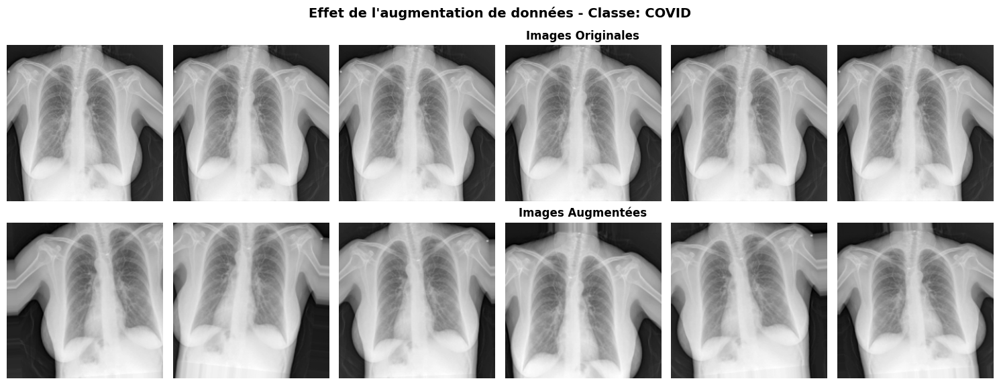

In [5]:
# Créer le preprocessor
preprocessor = COVID19Preprocessor(df)

# Créer les splits
train_df, val_df, test_df = preprocessor.create_splits()

# Créer les générateurs
train_gen, val_gen, test_gen = preprocessor.get_data_generators(augmentation=True)

# Visualiser l'augmentation
preprocessor.visualize_augmentation(n_samples=6)

In [6]:
import time

class COVID19Models:
    """Classe pour créer et entraîner les modèles de Deep Learning"""
    
    def __init__(self, input_shape=(224, 224, 1), n_classes=N_CLASSES):
        """
        Initialisation
        
        Args:
            input_shape: Forme des images d'entrée (hauteur, largeur, canaux)
            n_classes: Nombre de classes à prédire
        """
        self.input_shape = input_shape
        self.n_classes = n_classes
        self.models = {}
        self.histories = {}
        
    def create_simple_cnn(self, name='SimpleCNN'):
        """
        Crée un CNN simple avec 4 blocs convolutionnels
        
        Architecture:
        - 4 blocs Conv2D + BatchNorm + MaxPooling + Dropout
        - 2 couches Dense pour la classification
        """
        print(f"\n🔨 Construction du modèle: {name}")
        
        model = models.Sequential([
            # Bloc 1 : 32 filtres
            layers.Conv2D(32, (3, 3), activation='relu', padding='same', 
                         input_shape=self.input_shape, name='conv1'),
            layers.BatchNormalization(name='bn1'),
            layers.MaxPooling2D((2, 2), name='pool1'),
            layers.Dropout(0.25, name='drop1'),
            
            # Bloc 2 : 64 filtres
            layers.Conv2D(64, (3, 3), activation='relu', padding='same', name='conv2'),
            layers.BatchNormalization(name='bn2'),
            layers.MaxPooling2D((2, 2), name='pool2'),
            layers.Dropout(0.25, name='drop2'),
            
            # Bloc 3 : 128 filtres
            layers.Conv2D(128, (3, 3), activation='relu', padding='same', name='conv3'),
            layers.BatchNormalization(name='bn3'),
            layers.MaxPooling2D((2, 2), name='pool3'),
            layers.Dropout(0.25, name='drop3'),
            
            # Bloc 4 : 256 filtres
            layers.Conv2D(256, (3, 3), activation='relu', padding='same', name='conv4'),
            layers.BatchNormalization(name='bn4'),
            layers.MaxPooling2D((2, 2), name='pool4'),
            layers.Dropout(0.25, name='drop4'),
            
            # Classification
            layers.Flatten(name='flatten'),
            layers.Dense(512, activation='relu', name='fc1'),
            layers.BatchNormalization(name='bn5'),
            layers.Dropout(0.5, name='drop5'),
            layers.Dense(256, activation='relu', name='fc2'),
            layers.BatchNormalization(name='bn6'),
            layers.Dropout(0.5, name='drop6'),
            layers.Dense(self.n_classes, activation='softmax', name='output')
        ], name=name)
        
        self.models[name] = model
        print(f"✅ Modèle {name} créé!")
        print(f"   📊 Paramètres: {model.count_params():,}")
        
        return model
    
    def create_vgg16_transfer(self, name='VGG16_Transfer', trainable_layers=5):
        """
        Crée un modèle basé sur VGG16 avec Transfer Learning
        
        Args:
            name: Nom du modèle
            trainable_layers: Nombre de couches VGG16 à entraîner
        """
        print(f"\n🔨 Construction du modèle: {name}")
        print(f"   🔓 Couches VGG16 entraînables: {trainable_layers}")
        
        # Charger VGG16 pré-entraîné sur ImageNet
        base_model = VGG16(
            weights='imagenet',
            include_top=False,
            input_shape=(224, 224, 3)
        )
        
        # Geler toutes les couches par défaut
        base_model.trainable = False
        
        # Dégeler les dernières couches si demandé
        if trainable_layers > 0:
            for layer in base_model.layers[-trainable_layers:]:
                layer.trainable = True
        
        # Adapter pour images en niveaux de gris (1 canal -> 3 canaux)
        inputs = layers.Input(shape=self.input_shape, name='input')
        x = layers.Conv2D(3, (1, 1), padding='same', name='gray_to_rgb')(inputs)
        
        # Passer par VGG16
        x = base_model(x, training=False)
        
        # Tête de classification personnalisée
        x = layers.GlobalAveragePooling2D(name='global_pool')(x)
        x = layers.Dense(512, activation='relu', name='fc1')(x)
        x = layers.BatchNormalization(name='bn1')(x)
        x = layers.Dropout(0.5, name='drop1')(x)
        x = layers.Dense(256, activation='relu', name='fc2')(x)
        x = layers.BatchNormalization(name='bn2')(x)
        x = layers.Dropout(0.5, name='drop2')(x)
        outputs = layers.Dense(self.n_classes, activation='softmax', name='output')(x)
        
        model = models.Model(inputs, outputs, name=name)
        
        self.models[name] = model
        print(f"✅ Modèle {name} créé!")
        print(f"   📊 Paramètres totaux: {model.count_params():,}")
        print(f"   🔓 Paramètres entraînables: {sum([tf.size(w).numpy() for w in model.trainable_weights]):,}")
        
        return model
    
    def compile_model(self, model, learning_rate=0.001):
        """
        Compile un modèle avec optimizer et métriques
        
        Args:
            model: Modèle à compiler
            learning_rate: Taux d'apprentissage
        """
        print(f"\n⚙️ Compilation du modèle {model.name}...")
        print(f"   📈 Learning rate: {learning_rate}")
        
        model.compile(
            optimizer=keras.optimizers.Adam(learning_rate=learning_rate),
            loss='categorical_crossentropy',
            metrics=[
                'accuracy',
                keras.metrics.Precision(name='precision'),
                keras.metrics.Recall(name='recall'),
                keras.metrics.AUC(name='auc')
            ]
        )
        
        print("✅ Modèle compilé!")
        return model
    
    def train_model(self, model, train_gen, val_gen, epochs=50, patience=10):
        """
        Entraîne un modèle avec callbacks
        
        Args:
            model: Modèle à entraîner
            train_gen: Générateur d'entraînement
            val_gen: Générateur de validation
            epochs: Nombre d'époques maximum
            patience: Patience pour early stopping
            
        Returns:
            History object
        """
        print(f"\n{'='*70}")
        print(f"🚀 ENTRAÎNEMENT DU MODÈLE: {model.name}")
        print(f"{'='*70}")
        print(f"   📊 Époques max: {epochs}")
        print(f"   ⏸️ Patience: {patience}")
        print(f"   📦 Batch size: {train_gen.batch_size}")
        print(f"   🔵 Train samples: {train_gen.n}")
        print(f"   🟢 Val samples: {val_gen.n}")
        print(f"{'='*70}\n")
        
        # Callbacks
        callbacks_list = [
            EarlyStopping(
                monitor='val_loss',
                patience=patience,
                restore_best_weights=True,
                verbose=1,
                mode='min'
            ),
            ReduceLROnPlateau(
                monitor='val_loss',
                factor=0.5,
                patience=5,
                min_lr=1e-7,
                verbose=1,
                mode='min'
            ),
            ModelCheckpoint(
                f'best_{model.name}.h5',
                monitor='val_accuracy',
                save_best_only=True,
                verbose=1,
                mode='max'
            )
        ]
        
        # Entraînement
        start_time = time.time()
        
        history = model.fit(
            train_gen,
            validation_data=val_gen,
            epochs=epochs,
            callbacks=callbacks_list,
            verbose=1
        )
        
        training_time = time.time() - start_time
        
        print(f"\n{'='*70}")
        print(f"✅ ENTRAÎNEMENT TERMINÉ!")
        print(f"{'='*70}")
        print(f"   ⏱️ Temps total: {training_time/60:.2f} minutes")
        print(f"   📊 Époques exécutées: {len(history.history['loss'])}")
        print(f"{'='*70}\n")
        
        # Sauvegarder l'historique
        self.histories[model.name] = history
        
        return history
    
    def plot_training_history(self, history, model_name):
        """Visualise l'historique d'entraînement"""
        
        fig, axes = plt.subplots(2, 2, figsize=(16, 10))
        
        epochs_range = range(1, len(history.history['accuracy']) + 1)
        
        # Accuracy
        axes[0, 0].plot(epochs_range, history.history['accuracy'], 
                       label='Train', linewidth=2, marker='o', markersize=4)
        axes[0, 0].plot(epochs_range, history.history['val_accuracy'], 
                       label='Validation', linewidth=2, marker='s', markersize=4)
        axes[0, 0].set_title(f'{model_name} - Accuracy', fontweight='bold', fontsize=13)
        axes[0, 0].set_xlabel('Epoch', fontsize=11)
        axes[0, 0].set_ylabel('Accuracy', fontsize=11)
        axes[0, 0].legend(fontsize=10)
        axes[0, 0].grid(alpha=0.3)
        
        # Loss
        axes[0, 1].plot(epochs_range, history.history['loss'], 
                       label='Train', linewidth=2, marker='o', markersize=4)
        axes[0, 1].plot(epochs_range, history.history['val_loss'], 
                       label='Validation', linewidth=2, marker='s', markersize=4)
        axes[0, 1].set_title(f'{model_name} - Loss', fontweight='bold', fontsize=13)
        axes[0, 1].set_xlabel('Epoch', fontsize=11)
        axes[0, 1].set_ylabel('Loss', fontsize=11)
        axes[0, 1].legend(fontsize=10)
        axes[0, 1].grid(alpha=0.3)
        
        # Precision
        axes[1, 0].plot(epochs_range, history.history['precision'], 
                       label='Train', linewidth=2, marker='o', markersize=4)
        axes[1, 0].plot(epochs_range, history.history['val_precision'], 
                       label='Validation', linewidth=2, marker='s', markersize=4)
        axes[1, 0].set_title(f'{model_name} - Precision', fontweight='bold', fontsize=13)
        axes[1, 0].set_xlabel('Epoch', fontsize=11)
        axes[1, 0].set_ylabel('Precision', fontsize=11)
        axes[1, 0].legend(fontsize=10)
        axes[1, 0].grid(alpha=0.3)
        
        # Recall
        axes[1, 1].plot(epochs_range, history.history['recall'], 
                       label='Train', linewidth=2, marker='o', markersize=4)
        axes[1, 1].plot(epochs_range, history.history['val_recall'], 
                       label='Validation', linewidth=2, marker='s', markersize=4)
        axes[1, 1].set_title(f'{model_name} - Recall', fontweight='bold', fontsize=13)
        axes[1, 1].set_xlabel('Epoch', fontsize=11)
        axes[1, 1].set_ylabel('Recall', fontsize=11)
        axes[1, 1].legend(fontsize=10)
        axes[1, 1].grid(alpha=0.3)
        
        plt.suptitle(f'Historique d\'entraînement - {model_name}', 
                    fontsize=16, fontweight='bold', y=1.00)
        plt.tight_layout()
        plt.show()
        
        # Afficher les meilleurs résultats
        best_epoch = np.argmax(history.history['val_accuracy'])
        
        print(f"\n{'='*70}")
        print(f"📊 MEILLEURS RÉSULTATS - {model_name} (Epoch {best_epoch + 1})")
        print(f"{'='*70}")
        print(f"   🔵 Train Accuracy:      {history.history['accuracy'][best_epoch]:.4f}")
        print(f"   🟢 Val Accuracy:        {history.history['val_accuracy'][best_epoch]:.4f}")
        print(f"   🔵 Train Loss:          {history.history['loss'][best_epoch]:.4f}")
        print(f"   🟢 Val Loss:            {history.history['val_loss'][best_epoch]:.4f}")
        print(f"   🟢 Val Precision:       {history.history['val_precision'][best_epoch]:.4f}")
        print(f"   🟢 Val Recall:          {history.history['val_recall'][best_epoch]:.4f}")
        print(f"   🟢 Val AUC:             {history.history['val_auc'][best_epoch]:.4f}")
        print(f"{'='*70}\n")

print("✅ Classe COVID19Models créée!")

✅ Classe COVID19Models créée!


In [7]:
# Créer une instance de la classe Models
model_builder = COVID19Models(input_shape=(224, 224, 1), n_classes=N_CLASSES)

# Créer le modèle SimpleCNN
simple_cnn = model_builder.create_simple_cnn()

# Afficher l'architecture complète
print("\n📋 ARCHITECTURE DU MODÈLE:")
print("="*70)
simple_cnn.summary()
print("="*70)

# Compiler le


🔨 Construction du modèle: SimpleCNN
✅ Modèle SimpleCNN créé!
   📊 Paramètres: 26,215,555

📋 ARCHITECTURE DU MODÈLE:


Model: "SimpleCNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1 (Conv2D)                  │ (None, 224, 224, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn1 (BatchNormalization)        │ (None, 224, 224, 32)   │           128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool1 (MaxPooling2D)            │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ drop1 (Dropout)                 │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2 (Conv2D)                  │ (None, 112, 112, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn2 (BatchNormalization)        │ (None, 112, 112, 64)   │           256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool2 (MaxPooling2D)            │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ drop2 (Dropout)                 │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3 (Conv2D)                  │ (None, 56, 56, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn3 (BatchNormalization)        │ (None, 56, 56, 128)    │           512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool3 (MaxPooling2D)            │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ drop3 (Dropout)                 │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv4 (Conv2D)                  │ (None, 28, 28, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn4 (BatchNormalization)        │ (None, 28, 28, 256)    │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool4 (MaxPooling2D)            │ (None, 14, 14, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ drop4 (Dropout)                 │ (None, 14, 14, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 50176)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc1 (Dense)                     │ (None, 512)            │    25,690,624 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn5 (BatchNormalization)        │ (None, 512)            │         2,048 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ drop5 (Dropout)                 │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc2 (Dense)                     │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn6 (BatchNormalization)        │ (None, 256)            │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ drop6 (Dropout)                 │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output (Dense)                  │ (None, 3)              │           771 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 26,215,555 (100.00 MB)

 Trainable params: 26,213,059 (99.99 MB)

 Non-trainable params: 2,496 (9.75 KB)

In [8]:
# Compiler le modèle
simple_cnn = model_builder.compile_model(simple_cnn, learning_rate=0.001)

print("\n✅ Modèle SimpleCNN prêt pour l'entraînement!")


⚙️ Compilation du modèle SimpleCNN...
   📈 Learning rate: 0.001
✅ Modèle compilé!

✅ Modèle SimpleCNN prêt pour l'entraînement!



🚀 ENTRAÎNEMENT DU MODÈLE: SimpleCNN
   📊 Époques max: 50
   ⏸️ Patience: 10
   📦 Batch size: 32
   🔵 Train samples: 210
   🟢 Val samples: 30

Epoch 1/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.4760 - auc: 0.6424 - loss: 1.7639 - precision: 0.4711 - recall: 0.4366 
Epoch 1: val_accuracy improved from None to 0.33333, saving model to best_SimpleCNN.h5



Epoch 1: finished saving model to best_SimpleCNN.h5
7/7 ━━━━━━━━━━━━━━━━━━━━ 24s 3s/step - accuracy: 0.5190 - auc: 0.6914 - loss: 1.5670 - precision: 0.5258 - recall: 0.4857 - val_accuracy: 0.3333 - val_auc: 0.4581 - val_loss: 1.7590 - val_precision: 0.3333 - val_recall: 0.3333 - learning_rate: 0.0010
Epoch 2/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.5511 - auc: 0.7624 - loss: 1.1217 - precision: 0.5734 - recall: 0.5417 
Epoch 2: val_accuracy did not improve from 0.33333
7/7 ━━━━━━━━━━━━━━━━━━━━ 19s 3s/step - accuracy: 0.5524 - auc: 0.7509 - loss: 1.2207 - precision: 0.5678 - recall: 0.5381 - val_accuracy: 0.3333 - val_auc: 0.5056 - val_loss: 4.2564 - val_precision: 0.3333 - val_recall: 0.3333 - learning_rate: 0.0010
Epoch 3/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.6886 - auc: 0.8324 - loss: 1.0177 - precision: 0.6954 - recall: 0.6750 
Epoch 3: val_accuracy did not improve from 0.33333
7/7 ━━━━━━━━━━━━━━━━━━━━ 18s 3s/step - accuracy: 0.6714 - auc: 0.8091 - loss:

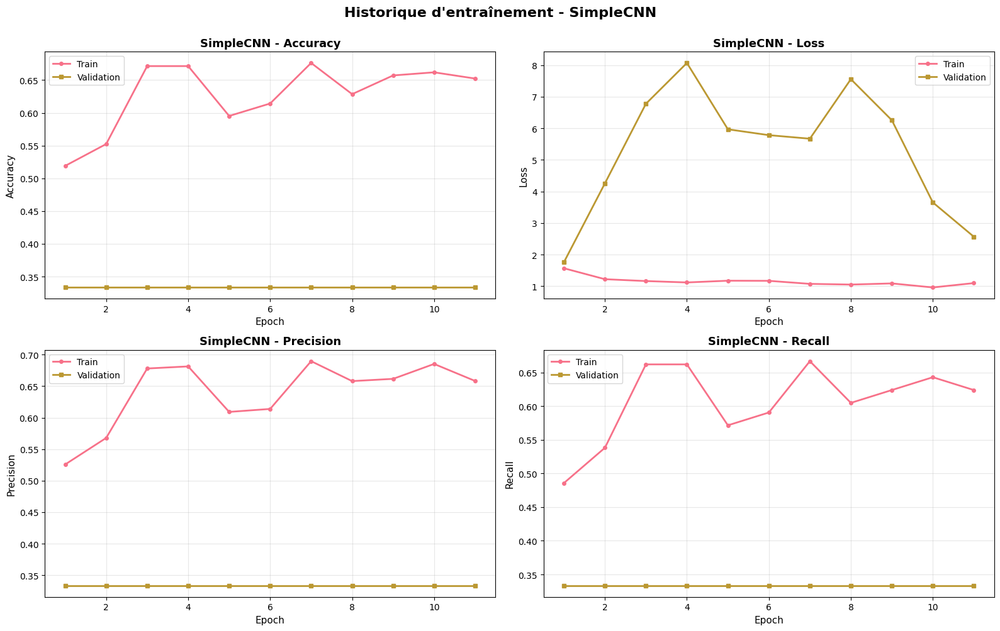


📊 MEILLEURS RÉSULTATS - SimpleCNN (Epoch 1)
   🔵 Train Accuracy:      0.5190
   🟢 Val Accuracy:        0.3333
   🔵 Train Loss:          1.5670
   🟢 Val Loss:            1.7590
   🟢 Val Precision:       0.3333
   🟢 Val Recall:          0.3333
   🟢 Val AUC:             0.4581



In [9]:
# Entraîner le modèle
history_simple = model_builder.train_model(
    model=simple_cnn,
    train_gen=train_gen,
    val_gen=val_gen,
    epochs=50,
    patience=10
)

# Visualiser l'historique d'entraînement
model_builder.plot_training_history(history_simple, 'SimpleCNN')

In [14]:
class ModelEvaluator:
    """Classe pour évaluer les modèles"""
    
    def __init__(self, model, test_gen, class_names=CLASSES):
        self.model = model
        self.test_gen = test_gen
        self.class_names = class_names
        self.y_true = None
        self.y_pred = None
        self.y_pred_proba = None
        
    def evaluate(self):
        """Évalue le modèle sur le test set"""
        print(f"\n{'='*70}")
        print(f"📊 ÉVALUATION DU MODÈLE: {self.model.name}")
        print(f"{'='*70}")
        print(f"   🟡 Test samples: {self.test_gen.n}")
        print(f"{'='*70}\n")
        
        # Prédictions
        print("🔄 Génération des prédictions...")
        self.test_gen.reset()
        self.y_pred_proba = self.model.predict(self.test_gen, verbose=1)
        self.y_pred = np.argmax(self.y_pred_proba, axis=1)
        
        # Vraies étiquettes
        self.y_true = self.test_gen.classes
        
        # Métriques globales
        test_loss, test_acc, test_prec, test_rec, test_auc = self.model.evaluate(
            self.test_gen, verbose=0
        )
        
        print(f"\n{'='*70}")
        print(f"📈 RÉSULTATS SUR LE TEST SET")
        print(f"{'='*70}")
        print(f"   🎯 Accuracy:    {test_acc:.4f} ({test_acc*100:.2f}%)")
        print(f"   📉 Loss:        {test_loss:.4f}")
        print(f"   🎯 Precision:   {test_prec:.4f}")
        print(f"   🎯 Recall:      {test_rec:.4f}")
        print(f"   📊 AUC:         {test_auc:.4f}")
        print(f"{'='*70}\n")
        
        return {
            'accuracy': test_acc,
            'loss': test_loss,
            'precision': test_prec,
            'recall': test_rec,
            'auc': test_auc
        }
    
    def plot_confusion_matrix(self, normalize=False):
        """Affiche la matrice de confusion"""
        
        cm = confusion_matrix(self.y_true, self.y_pred)
        
        if normalize:
            cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
            fmt = '.2%'
            title = 'Matrice de Confusion Normalisée'
        else:
            fmt = 'd'
            title = 'Matrice de Confusion'
        
        plt.figure(figsize=(10, 8))
        sns.heatmap(cm, annot=True, fmt=fmt, cmap='Blues', 
                   xticklabels=self.class_names, 
                   yticklabels=self.class_names,
                   cbar_kws={'label': 'Nombre' if not normalize else 'Proportion'},
                   linewidths=1, linecolor='gray')
        
        plt.title(f'{title} - {self.model.name}', fontweight='bold', fontsize=14, pad=20)
        plt.ylabel('Vraie classe', fontsize=12, fontweight='bold')
        plt.xlabel('Classe prédite', fontsize=12, fontweight='bold')
        plt.xticks(rotation=45, ha='right')
        plt.yticks(rotation=0)
        plt.tight_layout()
        plt.show()
        
        return cm
    
    def plot_classification_report(self):
        """Affiche le rapport de classification détaillé"""
        
        # Générer le rapport
        report = classification_report(
            self.y_true, 
            self.y_pred, 
            target_names=self.class_names,
            output_dict=True
        )
        
        # Créer un DataFrame
        df_report = pd.DataFrame(report).transpose()
        
        # Visualisation
        fig, ax = plt.subplots(figsize=(12, 6))
        
        x = np.arange(len(self.class_names))
        width = 0.25
        
        precision_vals = [report[c]['precision'] for c in self.class_names]
        recall_vals = [report[c]['recall'] for c in self.class_names]
        f1_vals = [report[c]['f1-score'] for c in self.class_names]
        
        ax.bar(x - width, precision_vals, width, label='Precision', color='#FF6B6B', alpha=0.8)
        ax.bar(x, recall_vals, width, label='Recall', color='#4ECDC4', alpha=0.8)
        ax.bar(x + width, f1_vals, width, label='F1-Score', color='#45B7D1', alpha=0.8)
        
        ax.set_xlabel('Classes', fontsize=12, fontweight='bold')
        ax.set_ylabel('Score', fontsize=12, fontweight='bold')
        ax.set_title(f'Métriques par classe - {self.model.name}', 
                    fontsize=14, fontweight='bold', pad=20)
        ax.set_xticks(x)
        ax.set_xticklabels(self.class_names, rotation=45, ha='right')
        ax.legend(fontsize=11)
        ax.grid(axis='y', alpha=0.3)
        ax.set_ylim([0, 1.05])
        
        # Ajouter les valeurs sur les barres
        for i in range(len(self.class_names)):
            ax.text(i - width, precision_vals[i] + 0.02, 
                   f"{precision_vals[i]:.3f}", ha='center', va='bottom', fontsize=9)
            ax.text(i, recall_vals[i] + 0.02, 
                   f"{recall_vals[i]:.3f}", ha='center', va='bottom', fontsize=9)
            ax.text(i + width, f1_vals[i] + 0.02, 
                   f"{f1_vals[i]:.3f}", ha='center', va='bottom', fontsize=9)
        
        plt.tight_layout()
        plt.show()
        
        # Afficher le rapport textuel
        print(f"\n{'='*70}")
        print(f"📋 RAPPORT DE CLASSIFICATION DÉTAILLÉ - {self.model.name}")
        print(f"{'='*70}\n")
        print(classification_report(self.y_true, self.y_pred, 
                                   target_names=self.class_names, digits=4))
        print(f"{'='*70}\n")
        
        return df_report
    
    def plot_roc_curves(self):
        """Affiche les courbes ROC pour chaque classe"""
        
        from sklearn.preprocessing import label_binarize
        
        # Binariser les étiquettes
        y_true_bin = label_binarize(self.y_true, classes=range(len(self.class_names)))
        
        # Calculer les courbes ROC
        fpr = dict()
        tpr = dict()
        roc_auc = dict()
        
        for i in range(len(self.class_names)):
            fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], self.y_pred_proba[:, i])
            roc_auc[i] = auc(fpr[i], tpr[i])
        
        # Micro-average
        fpr["micro"], tpr["micro"], _ = roc_curve(y_true_bin.ravel(), 
                                                   self.y_pred_proba.ravel())
        roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
        
        # Visualisation
        plt.figure(figsize=(12, 8))
        
        colors_roc = ['#FF6B6B', '#4ECDC4', '#45B7D1']
        
        # Courbes par classe
        for i, (classe, color) in enumerate(zip(self.class_names, colors_roc)):
            plt.plot(fpr[i], tpr[i], color=color, lw=2.5,
                    label=f'{classe} (AUC = {roc_auc[i]:.3f})')
        
        # Courbe micro-average
        plt.plot(fpr["micro"], tpr["micro"], color='navy', lw=2.5, 
                linestyle='--', label=f'Micro-average (AUC = {roc_auc["micro"]:.3f})')
        
        # Ligne de référence
        plt.plot([0, 1], [0, 1], 'k--', lw=1.5, alpha=0.5, label='Aléatoire (AUC = 0.500)')
        
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.05])
        plt.xlabel('Taux de Faux Positifs (FPR)', fontsize=12, fontweight='bold')
        plt.ylabel('Taux de Vrais Positifs (TPR)', fontsize=12, fontweight='bold')
        plt.title(f'Courbes ROC - {self.model.name}', fontsize=14, fontweight='bold', pad=20)
        plt.legend(loc="lower right", fontsize=11)
        plt.grid(alpha=0.3)
        plt.tight_layout()
        plt.show()
        
        # Afficher les AUC
        print(f"\n{'='*70}")
        print(f"📊 AUC PAR CLASSE - {self.model.name}")
        print(f"{'='*70}")
        for i, classe in enumerate(self.class_names):
            print(f"   • {classe:20s}: {roc_auc[i]:.4f}")
        print(f"   • {'Micro-average':20s}: {roc_auc['micro']:.4f}")
        print(f"{'='*70}\n")
        
        return roc_auc
    
    def full_evaluation(self):
        """Effectue une évaluation complète du modèle"""
        
        print(f"\n{'#'*70}")
        print(f"# ÉVALUATION COMPLÈTE DU MODÈLE: {self.model.name}")
        print(f"{'#'*70}\n")
        
        # 1. Évaluation globale
        print("\n" + "="*70)
        print("ÉTAPE 1/4 : Évaluation des métriques globales")
        print("="*70)
        metrics = self.evaluate()
        
        # 2. Matrice de confusion
        print("\n" + "="*70)
        print("ÉTAPE 2/4 : Matrices de confusion")
        print("="*70)
        cm = self.plot_confusion_matrix(normalize=False)
        self.plot_confusion_matrix(normalize=True)
        
        # 3. Rapport de classification
        print("\n" + "="*70)
        print("ÉTAPE 3/4 : Rapport de classification")
        print("="*70)
        df_report = self.plot_classification_report()
        
        # 4. Courbes ROC
        print("\n" + "="*70)
        print("ÉTAPE 4/4 : Courbes ROC")
        print("="*70)
        roc_auc = self.plot_roc_curves()
        
        print(f"\n{'#'*70}")
        print(f"# ✅ ÉVALUATION COMPLÈTE TERMINÉE!")
        print(f"{'#'*70}\n")
        
        return metrics, cm, df_report, roc_auc

print("✅ Classe ModelEvaluator créée et complète!")

✅ Classe ModelEvaluator créée et complète!



######################################################################
# ÉVALUATION COMPLÈTE DU MODÈLE: SimpleCNN
######################################################################


ÉTAPE 1/4 : Évaluation des métriques globales

📊 ÉVALUATION DU MODÈLE: SimpleCNN
   🟡 Test samples: 60

🔄 Génération des prédictions...
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 350ms/step

📈 RÉSULTATS SUR LE TEST SET
   🎯 Accuracy:    0.3333 (33.33%)
   📉 Loss:        1.7655
   🎯 Precision:   0.3333
   🎯 Recall:      0.3333
   📊 AUC:         0.4442


ÉTAPE 2/4 : Matrices de confusion


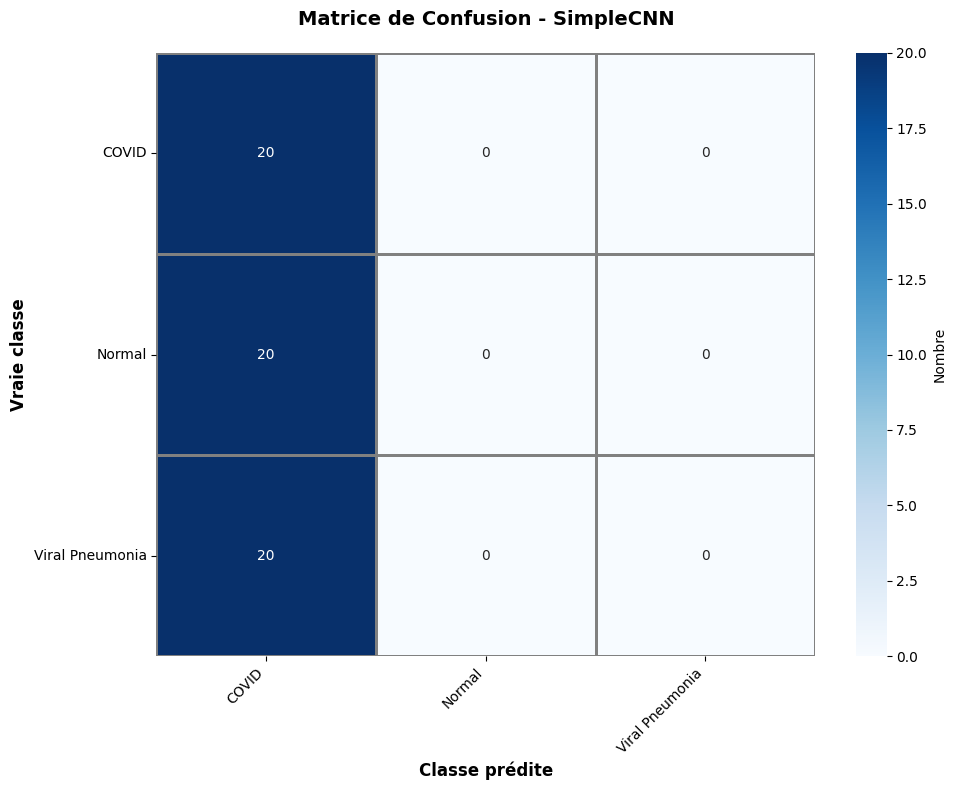

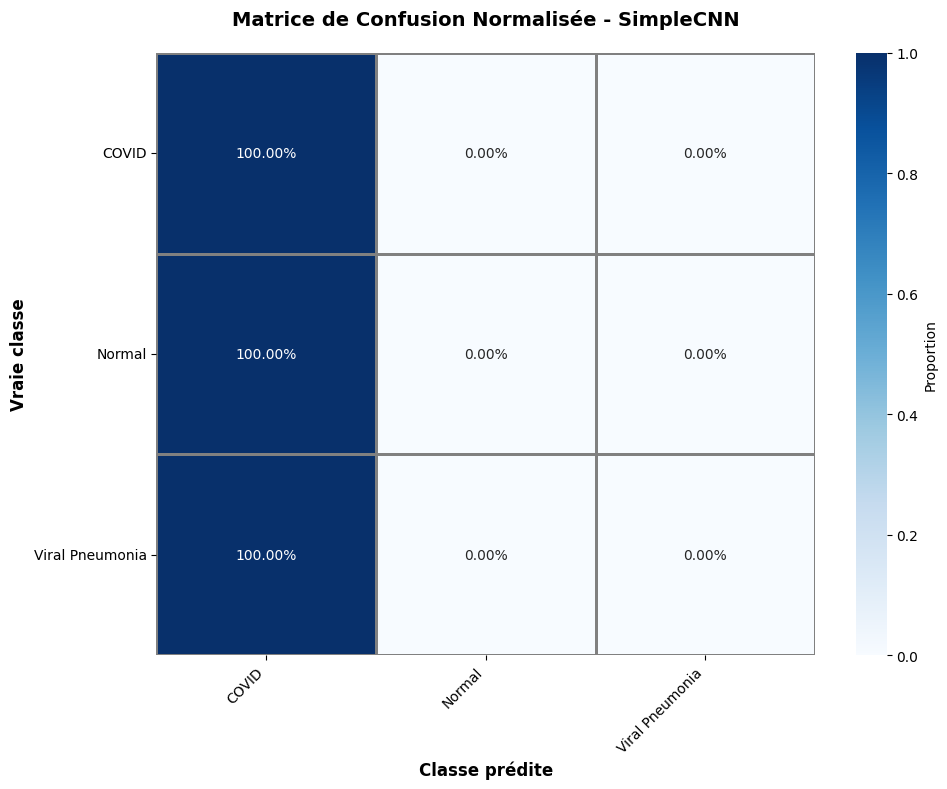


ÉTAPE 3/4 : Rapport de classification


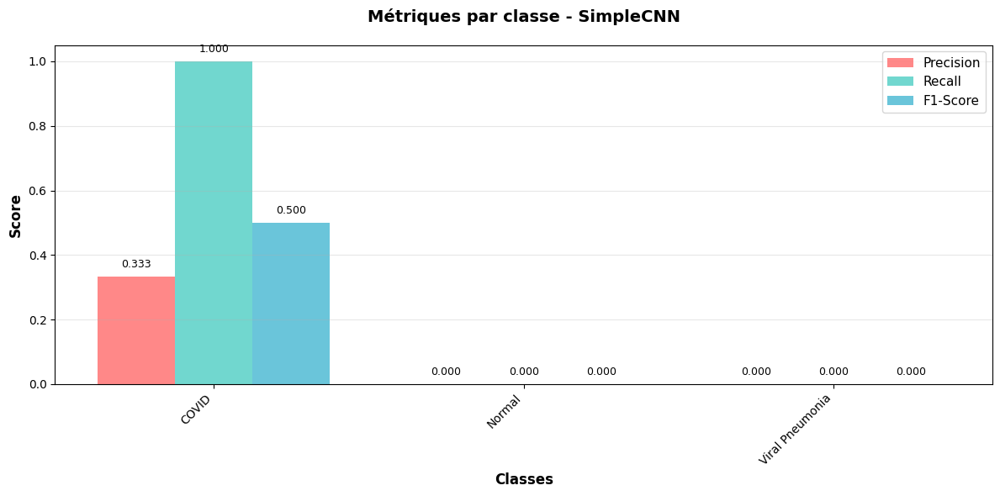


📋 RAPPORT DE CLASSIFICATION DÉTAILLÉ - SimpleCNN

                 precision    recall  f1-score   support

          COVID     0.3333    1.0000    0.5000        20
         Normal     0.0000    0.0000    0.0000        20
Viral Pneumonia     0.0000    0.0000    0.0000        20

       accuracy                         0.3333        60
      macro avg     0.1111    0.3333    0.1667        60
   weighted avg     0.1111    0.3333    0.1667        60



ÉTAPE 4/4 : Courbes ROC


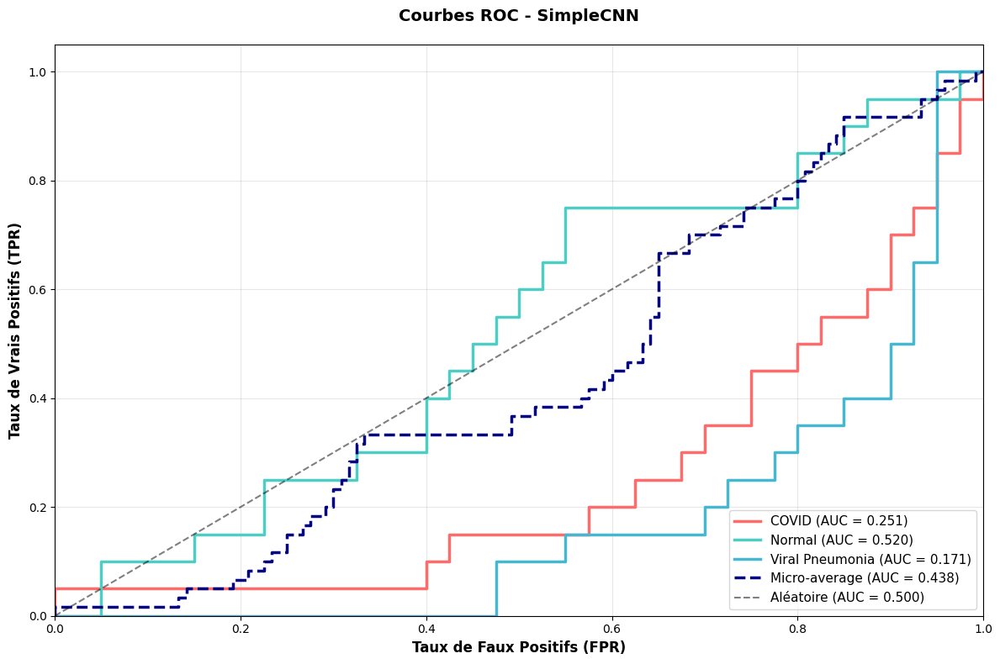


📊 AUC PAR CLASSE - SimpleCNN
   • COVID               : 0.2512
   • Normal              : 0.5200
   • Viral Pneumonia     : 0.1713
   • Micro-average       : 0.4381


######################################################################
# ✅ ÉVALUATION COMPLÈTE TERMINÉE!
######################################################################



In [15]:
# Créer l'évaluateur pour SimpleCNN
evaluator_simple = ModelEvaluator(simple_cnn, test_gen, class_names=CLASSES)

# Lancer l'évaluation complète
metrics, cm, report, roc = evaluator_simple.full_evaluation()

In [17]:
def plot_prediction_samples(self, n_samples=12, correct=True):
    """Affiche des échantillons de prédictions"""
    
    if correct:
        indices = np.where(self.y_pred == self.y_true)[0]
        title_prefix = "PRÉDICTIONS CORRECTES"
        color = 'green'
    else:
        indices = np.where(self.y_pred != self.y_true)[0]
        title_prefix = "PRÉDICTIONS INCORRECTES"
        color = 'red'
    
    if len(indices) == 0:
        print(f"⚠️ Aucune prédiction {'correcte' if correct else 'incorrecte'} trouvée!")
        return
    
    # Sélectionner aléatoirement n_samples
    n_to_show = min(n_samples, len(indices))
    selected_indices = np.random.choice(indices, n_to_show, replace=False)
    
    # Récupérer les images depuis le test_gen
    self.test_gen.reset()
    all_images = []
    all_labels = []
    
    for batch_x, batch_y in self.test_gen:
        all_images.extend(batch_x)
        all_labels.extend(batch_y)
        if len(all_images) >= self.test_gen.n:
            break
    
    # Limiter au nombre exact d'images
    all_images = all_images[:self.test_gen.n]
    
    # Sélectionner les images correspondantes
    selected_images = [all_images[idx] for idx in selected_indices]
    
    # Visualisation
    n_cols = 4
    n_rows = (n_to_show + n_cols - 1) // n_cols
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(16, 4*n_rows))
    
    if n_rows == 1 and n_cols == 1:
        axes = np.array([axes])
    elif n_rows == 1 or n_cols == 1:
        axes = axes.flatten()
    else:
        axes = axes.flatten()
    
    for i, (img, idx) in enumerate(zip(selected_images, selected_indices)):
        axes[i].imshow(img.squeeze(), cmap='gray')
        axes[i].axis('off')
        
        true_label = self.class_names[self.y_true[idx]]
        pred_label = self.class_names[self.y_pred[idx]]
        confidence = self.y_pred_proba[idx][self.y_pred[idx]] * 100
        
        title = f"Vrai: {true_label}\nPrédit: {pred_label}\nConfiance: {confidence:.1f}%"
        axes[i].set_title(title, fontsize=10, color=color, fontweight='bold')
    
    # Masquer les axes non utilisés
    for i in range(n_to_show, len(axes)):
        axes[i].axis('off')
    
    plt.suptitle(f'{title_prefix} - {self.model.name}', 
                fontsize=14, fontweight='bold', y=0.995)
    plt.tight_layout()
    plt.show()
    
    print(f"✅ {n_to_show} exemples affichés sur {len(indices)} disponibles")

# Ajouter la méthode à la classe
ModelEvaluator.plot_prediction_samples = plot_prediction_samples

print("✅ Méthode plot_prediction_samples ajoutée à ModelEvaluator!")

✅ Méthode plot_prediction_samples ajoutée à ModelEvaluator!



🟢 Exemples de prédictions CORRECTES:


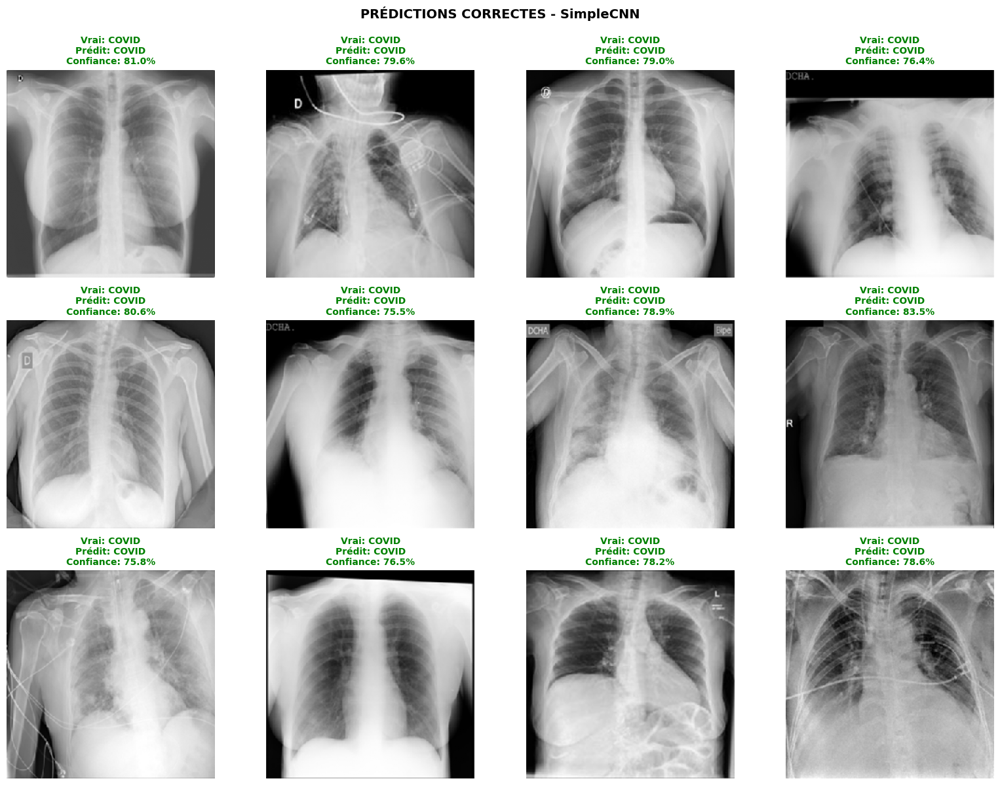

✅ 12 exemples affichés sur 20 disponibles

🔴 Exemples de prédictions INCORRECTES:


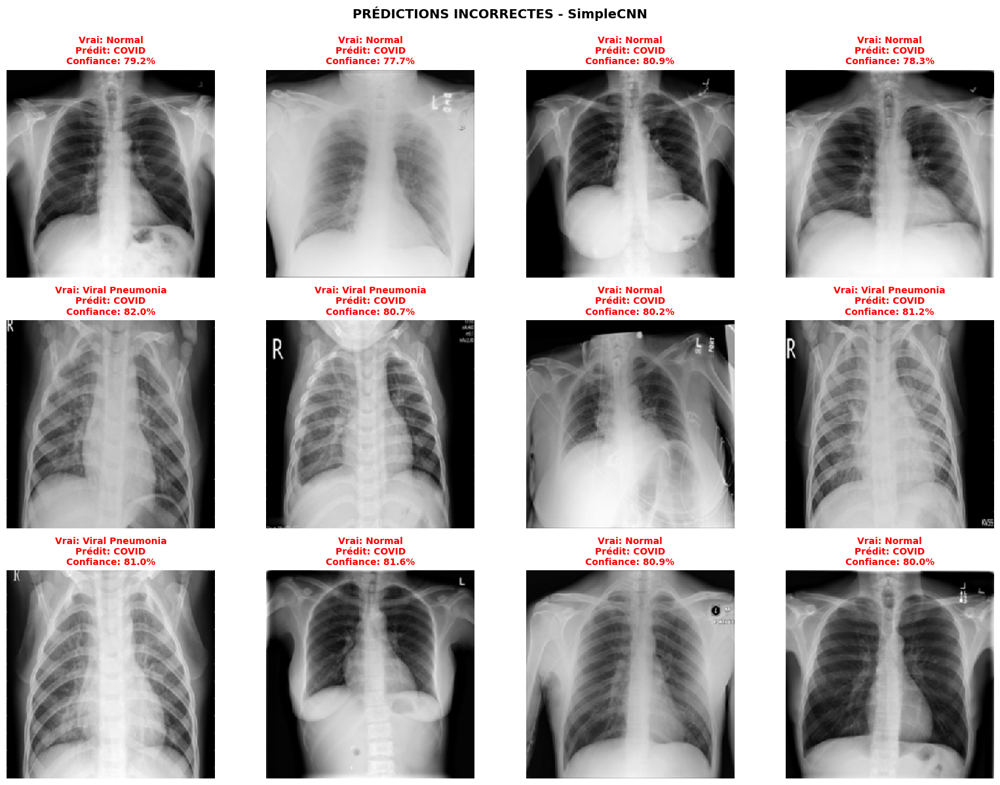

✅ 12 exemples affichés sur 40 disponibles


In [18]:
# Voir des prédictions correctes
print("\n🟢 Exemples de prédictions CORRECTES:")
evaluator_simple.plot_prediction_samples(n_samples=12, correct=True)

# Voir des prédictions incorrectes
print("\n🔴 Exemples de prédictions INCORRECTES:")
evaluator_simple.plot_prediction_samples(n_samples=12, correct=False)


🔍 ANALYSE DES ERREURS - SimpleCNN

📊 Statistiques globales:
   • Total d'images testées: 60
   • Prédictions correctes: 20
   • Prédictions incorrectes: 40
   • Accuracy: 0.3333 (33.33%)

📋 Erreurs par classe:
──────────────────────────────────────────────────────────────────────

   COVID:
      Total: 0
      Correct: 20 (inf%)
      Erreurs: -20 (0.0%)

   Normal:
      Total: 0
      Correct: 0 (nan%)
      Erreurs: 0 (0.0%)

   Viral Pneumonia:
      Total: 0
      Correct: 0 (nan%)
      Erreurs: 0 (0.0%)




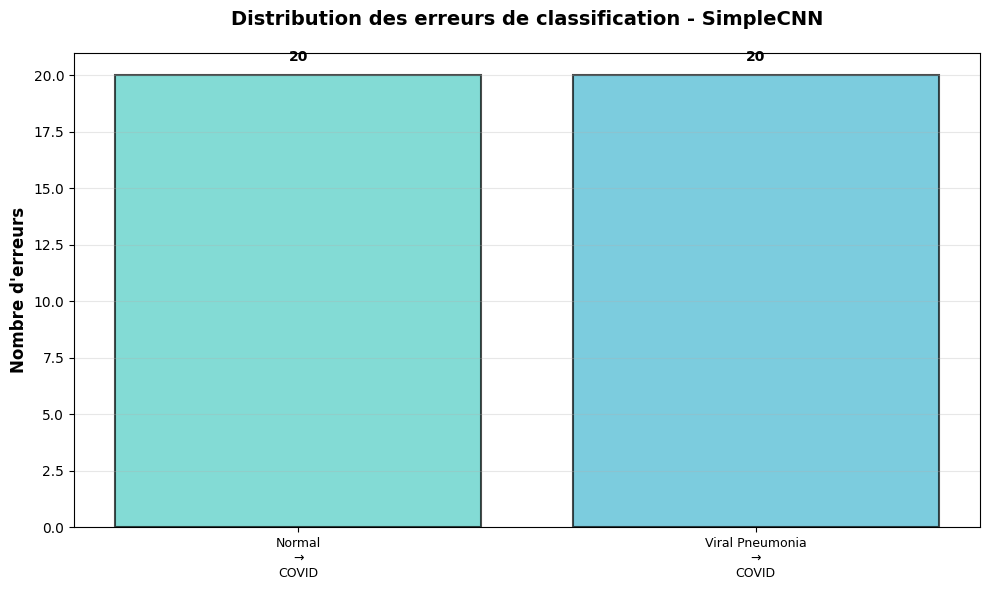

In [19]:
#  ANALYSE DES ERREURS Pour mieux comprendre les erreurs du modèle :
def analyze_errors(evaluator):
    """Analyse détaillée des erreurs de classification"""
    
    # Confusion matrix
    cm = confusion_matrix(evaluator.y_true, evaluator.y_pred)
    
    print(f"\n{'='*70}")
    print(f"🔍 ANALYSE DES ERREURS - {evaluator.model.name}")
    print(f"{'='*70}\n")
    
    # Statistiques globales
    total_errors = len(evaluator.y_true) - np.sum(evaluator.y_pred == evaluator.y_true)
    accuracy = np.sum(evaluator.y_pred == evaluator.y_true) / len(evaluator.y_true)
    
    print(f"📊 Statistiques globales:")
    print(f"   • Total d'images testées: {len(evaluator.y_true)}")
    print(f"   • Prédictions correctes: {len(evaluator.y_true) - total_errors}")
    print(f"   • Prédictions incorrectes: {total_errors}")
    print(f"   • Accuracy: {accuracy:.4f} ({accuracy*100:.2f}%)\n")
    
    # Analyse par classe
    print(f"📋 Erreurs par classe:")
    print(f"{'─'*70}")
    
    for i, class_name in enumerate(evaluator.class_names):
        # Nombre total d'exemples de cette classe
        total_class = np.sum(evaluator.y_true == i)
        
        # Bien classifiés
        correct = cm[i, i]
        
        # Mal classifiés
        errors = total_class - correct
        
        # Taux d'erreur
        error_rate = errors / total_class if total_class > 0 else 0
        
        print(f"\n   {class_name}:")
        print(f"      Total: {total_class}")
        print(f"      Correct: {correct} ({correct/total_class*100:.1f}%)")
        print(f"      Erreurs: {errors} ({error_rate*100:.1f}%)")
        
        # Détail des confusions
        if errors > 0:
            print(f"      Confondu avec:")
            for j, other_class in enumerate(evaluator.class_names):
                if i != j and cm[i, j] > 0:
                    print(f"         • {other_class}: {cm[i, j]} fois ({cm[i, j]/total_class*100:.1f}%)")
    
    print(f"\n{'='*70}\n")
    
    # Visualisation des confusions
    fig, ax = plt.subplots(figsize=(10, 6))
    
    # Matrice des erreurs uniquement (sans la diagonale)
    error_matrix = cm.copy()
    np.fill_diagonal(error_matrix, 0)
    
    x_pos = []
    heights = []
    colors_bar = []
    labels = []
    
    color_map = {'COVID': '#FF6B6B', 'Normal': '#4ECDC4', 'Viral Pneumonia': '#45B7D1'}
    
    pos = 0
    for i, true_class in enumerate(evaluator.class_names):
        for j, pred_class in enumerate(evaluator.class_names):
            if i != j and error_matrix[i, j] > 0:
                x_pos.append(pos)
                heights.append(error_matrix[i, j])
                colors_bar.append(color_map[true_class])
                labels.append(f"{true_class}\n→\n{pred_class}")
                pos += 1
    
    if len(x_pos) > 0:
        ax.bar(x_pos, heights, color=colors_bar, alpha=0.7, edgecolor='black', linewidth=1.5)
        ax.set_xticks(x_pos)
        ax.set_xticklabels(labels, fontsize=9)
        ax.set_ylabel('Nombre d\'erreurs', fontsize=12, fontweight='bold')
        ax.set_title(f'Distribution des erreurs de classification - {evaluator.model.name}', 
                    fontsize=14, fontweight='bold', pad=20)
        ax.grid(axis='y', alpha=0.3)
        
        # Ajouter les valeurs sur les barres
        for i, (x, h) in enumerate(zip(x_pos, heights)):
            ax.text(x, h + 0.5, str(int(h)), ha='center', va='bottom', fontweight='bold')
        
        plt.tight_layout()
        plt.show()
    else:
        print("✅ Aucune erreur détectée!")

# Utiliser la fonction
analyze_errors(evaluator_simple)

In [24]:
# Convertir en array NumPy
evaluator_simple.y_true = np.array(evaluator_simple.y_true)
evaluator_simple.y_pred = np.array(evaluator_simple.y_pred)

# Vérifier à nouveau
print("🔍 Distribution des classes dans le test set (CORRIGÉE):")
print(f"   • Total d'échantillons: {len(evaluator_simple.y_true)}")
print(f"   • Type de y_true: {type(evaluator_simple.y_true)}")
print(f"\n   Distribution:")

for i, class_name in enumerate(CLASSES):
    count = np.sum(evaluator_simple.y_true == i)
    percentage = count / len(evaluator_simple.y_true) * 100
    print(f"      • {class_name}: {count} échantillons ({percentage:.1f}%)")

print(f"\n   Classes uniques trouvées: {np.unique(evaluator_simple.y_true)}")
print(f"   Valeurs min/max: {evaluator_simple.y_true.min()} / {evaluator_simple.y_true.max()}")

🔍 Distribution des classes dans le test set (CORRIGÉE):
   • Total d'échantillons: 60
   • Type de y_true: <class 'numpy.ndarray'>

   Distribution:
      • COVID: 20 échantillons (33.3%)
      • Normal: 20 échantillons (33.3%)
      • Viral Pneumonia: 20 échantillons (33.3%)

   Classes uniques trouvées: [0 1 2]
   Valeurs min/max: 0 / 2


In [25]:
detailed_class_stats(evaluator_simple)


📊 STATISTIQUES DÉTAILLÉES PAR CLASSE - SimpleCNN

🏷️  COVID:
   • Nombre d'exemples: 20
   • Bien classifiés: 20 (100.00%)
   • Confiance moyenne: 0.7874 (78.74%)
   • Confiance min: 0.7473
   • Confiance max: 0.8351
   • Écart-type confiance: 0.0214

🏷️  Normal:
   • Nombre d'exemples: 20
   • Bien classifiés: 0 (0.00%)
   • Confiance moyenne: 0.7948 (79.48%)
   • Confiance min: 0.7536
   • Confiance max: 0.8241
   • Écart-type confiance: 0.0188

🏷️  Viral Pneumonia:
   • Nombre d'exemples: 20
   • Bien classifiés: 0 (0.00%)
   • Confiance moyenne: 0.8120 (81.20%)
   • Confiance min: 0.7900
   • Confiance max: 0.8246
   • Écart-type confiance: 0.0088




In [28]:
# Définir les constantes globales
INPUT_SHAPE = (224, 224, 1)  # Images en niveaux de gris 224x224
NUM_CLASSES = 3  # COVID, Normal, Viral Pneumonia

print(f"✅ Constantes définies:")
print(f"   • INPUT_SHAPE: {INPUT_SHAPE}")
print(f"   • NUM_CLASSES: {NUM_CLASSES}")

✅ Constantes définies:
   • INPUT_SHAPE: (224, 224, 1)
   • NUM_CLASSES: 3


In [29]:
# # Construction du modèle ResNet 
class ResNetCOVID:
    """Architecture ResNet personnalisée pour la détection COVID"""
    
    @staticmethod
    def residual_block(x, filters, kernel_size=3, stride=1, conv_shortcut=False, name=None):
        """
        Bloc résiduel avec connexion skip
        
        Args:
            x: Tensor d'entrée
            filters: Nombre de filtres
            kernel_size: Taille du kernel
            stride: Stride de la convolution
            conv_shortcut: Utiliser une convolution pour le shortcut
            name: Nom du bloc
        """
        if conv_shortcut:
            shortcut = layers.Conv2D(filters, 1, strides=stride, 
                                     padding='same', name=name + '_shortcut_conv')(x)
            shortcut = layers.BatchNormalization(name=name + '_shortcut_bn')(shortcut)
        else:
            shortcut = x
        
        # Première convolution
        x = layers.Conv2D(filters, kernel_size, strides=stride, 
                         padding='same', name=name + '_conv1')(x)
        x = layers.BatchNormalization(name=name + '_bn1')(x)
        x = layers.Activation('relu', name=name + '_relu1')(x)
        
        # Deuxième convolution
        x = layers.Conv2D(filters, kernel_size, padding='same', 
                         name=name + '_conv2')(x)
        x = layers.BatchNormalization(name=name + '_bn2')(x)
        
        # Addition avec le shortcut
        x = layers.Add(name=name + '_add')([shortcut, x])
        x = layers.Activation('relu', name=name + '_relu2')(x)
        
        return x
    
    @staticmethod
    def build_model(input_shape=(224, 224, 1), num_classes=3):
        """
        Construit le modèle ResNet personnalisé
        
        Args:
            input_shape: Forme de l'entrée
            num_classes: Nombre de classes
        """
        inputs = layers.Input(shape=input_shape, name='input')
        
        # Stem (entrée initiale)
        x = layers.Conv2D(64, 7, strides=2, padding='same', name='stem_conv')(inputs)
        x = layers.BatchNormalization(name='stem_bn')(x)
        x = layers.Activation('relu', name='stem_relu')(x)
        x = layers.MaxPooling2D(3, strides=2, padding='same', name='stem_pool')(x)
        
        # Bloc 1 (64 filtres)
        x = ResNetCOVID.residual_block(x, 64, conv_shortcut=True, name='block1_unit1')
        x = ResNetCOVID.residual_block(x, 64, name='block1_unit2')
        
        # Bloc 2 (128 filtres)
        x = ResNetCOVID.residual_block(x, 128, stride=2, conv_shortcut=True, name='block2_unit1')
        x = ResNetCOVID.residual_block(x, 128, name='block2_unit2')
        
        # Bloc 3 (256 filtres)
        x = ResNetCOVID.residual_block(x, 256, stride=2, conv_shortcut=True, name='block3_unit1')
        x = ResNetCOVID.residual_block(x, 256, name='block3_unit2')
        
        # Bloc 4 (512 filtres)
        x = ResNetCOVID.residual_block(x, 512, stride=2, conv_shortcut=True, name='block4_unit1')
        x = ResNetCOVID.residual_block(x, 512, name='block4_unit2')
        
        # Global Average Pooling
        x = layers.GlobalAveragePooling2D(name='global_avg_pool')(x)
        
        # Dropout
        x = layers.Dropout(0.5, name='dropout')(x)
        
        # Couche de sortie
        outputs = layers.Dense(num_classes, activation='softmax', name='predictions')(x)
        
        # Créer le modèle
        model = models.Model(inputs=inputs, outputs=outputs, name='ResNetCOVID')
        
        return model

print("✅ Classe ResNetCOVID créée!")

✅ Classe ResNetCOVID créée!


In [30]:
# Créer et compiler le modèle ResNet

# Créer le modèle ResNet
print("\n🏗️ Construction du modèle ResNet...")
resnet_model = ResNetCOVID.build_model(input_shape=INPUT_SHAPE, num_classes=NUM_CLASSES)

# Afficher le résumé
print("\n📋 Architecture du modèle ResNet:")
resnet_model.summary()

# Compiler le modèle
resnet_model = model_builder.compile_model(resnet_model, learning_rate=0.0001)

print("\n✅ Modèle ResNet prêt pour l'entraînement!")


🏗️ Construction du modèle ResNet...

📋 Architecture du modèle ResNet:


Model: "ResNetCOVID"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input (InputLayer)  │ (None, 224, 224,  │          0 │ -                 │
│                     │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, 112, 112,  │      3,200 │ input[0][0]       │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, 112, 112,  │        256 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_relu           │ (None, 112, 112,  │          0 │ stem_bn[0][0]     │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_pool           │ (None, 56, 56,    │          0 │ stem_relu[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_unit1_conv1  │ (None, 56, 56,    │     36,928 │ stem_pool[0][0]   │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_unit1_bn1    │ (None, 56, 56,    │        256 │ block1_unit1_con… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_unit1_relu1  │ (None, 56, 56,    │          0 │ block1_unit1_bn1… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_unit1_short… │ (None, 56, 56,    │      4,160 │ stem_pool[0][0]   │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_unit1_conv2  │ (None, 56, 56,    │     36,928 │ block1_unit1_rel… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_unit1_short… │ (None, 56, 56,    │        256 │ block1_unit1_sho… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_unit1_bn2    │ (None, 56, 56,    │        256 │ block1_unit1_con… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_unit1_add    │ (None, 56, 56,    │          0 │ block1_unit1_sho… │
│ (Add)               │ 64)               │            │ block1_unit1_bn2… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_unit1_relu2  │ (None, 56, 56,    │          0 │ block1_unit1_add… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_unit2_conv1  │ (None, 56, 56,    │     36,928 │ block1_unit1_rel… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_unit2_bn1    │ (None, 56, 56,    │        256 │ block1_unit2_con… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_unit2_relu1  │ (None, 56, 56,    │          0 │ block1_unit2_bn1

 Total params: 11,190,595 (42.69 MB)

 Trainable params: 11,180,867 (42.65 MB)

 Non-trainable params: 9,728 (38.00 KB)


⚙️ Compilation du modèle ResNetCOVID...
   📈 Learning rate: 0.0001
✅ Modèle compilé!

✅ Modèle ResNet prêt pour l'entraînement!


In [31]:
# Compter les paramètres
total_params = resnet_model.count_params()
trainable_params = sum([np.prod(v.shape) for v in resnet_model.trainable_weights])
non_trainable_params = total_params - trainable_params

print(f"\n{'='*70}")
print(f"📊 STATISTIQUES DU MODÈLE RESNET")
print(f"{'='*70}")
print(f"   • Total de paramètres: {total_params:,}")
print(f"   • Paramètres entraînables: {trainable_params:,}")
print(f"   • Paramètres non-entraînables: {non_trainable_params:,}")
print(f"   • Nombre de couches: {len(resnet_model.layers)}")
print(f"{'='*70}\n")

# Comparaison avec SimpleCNN
simple_params = simple_cnn.count_params()
print(f"📊 COMPARAISON:")
print(f"   • SimpleCNN: {simple_params:,} paramètres")
print(f"   • ResNetCOVID: {total_params:,} paramètres")
print(f"   • Différence: {total_params - simple_params:,} paramètres ({(total_params/simple_params):.2f}x plus grand)")


📊 STATISTIQUES DU MODÈLE RESNET
   • Total de paramètres: 11,190,595
   • Paramètres entraînables: 11,180,867
   • Paramètres non-entraînables: 9,728
   • Nombre de couches: 72

📊 COMPARAISON:
   • SimpleCNN: 26,215,555 paramètres
   • ResNetCOVID: 11,190,595 paramètres
   • Différence: -15,024,960 paramètres (0.43x plus grand)



🚀 Début de l'entraînement du modèle ResNet...


🚀 ENTRAÎNEMENT DU MODÈLE: ResNetCOVID
   📊 Époques max: 50
   ⏸️ Patience: 15
   📦 Batch size: 32
   🔵 Train samples: 210
   🟢 Val samples: 30

Epoch 1/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.4383 - auc: 0.6103 - loss: 1.4022 - precision: 0.4536 - recall: 0.3808   
Epoch 1: val_accuracy improved from None to 0.33333, saving model to best_ResNetCOVID.h5



Epoch 1: finished saving model to best_ResNetCOVID.h5
7/7 ━━━━━━━━━━━━━━━━━━━━ 29s 3s/step - accuracy: 0.4762 - auc: 0.6350 - loss: 1.4156 - precision: 0.4892 - recall: 0.4333 - val_accuracy: 0.3333 - val_auc: 0.5306 - val_loss: 1.1036 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - learning_rate: 1.0000e-04
Epoch 2/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.6031 - auc: 0.7707 - loss: 1.1532 - precision: 0.6232 - recall: 0.5769 
Epoch 2: val_accuracy did not improve from 0.33333
7/7 ━━━━━━━━━━━━━━━━━━━━ 17s 2s/step - accuracy: 0.6048 - auc: 0.7758 - loss: 1.0717 - precision: 0.6205 - recall: 0.5762 - val_accuracy: 0.3333 - val_auc: 0.4806 - val_loss: 1.1355 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - learning_rate: 1.0000e-04
Epoch 3/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.6676 - auc: 0.8407 - loss: 0.8214 - precision: 0.6970 - recall: 0.6644 
Epoch 3: val_accuracy did not improve from 0.33333
7/7 ━━━━━━━━━━━━━━━━━━━━ 17s 3s/step - accuracy: 0.

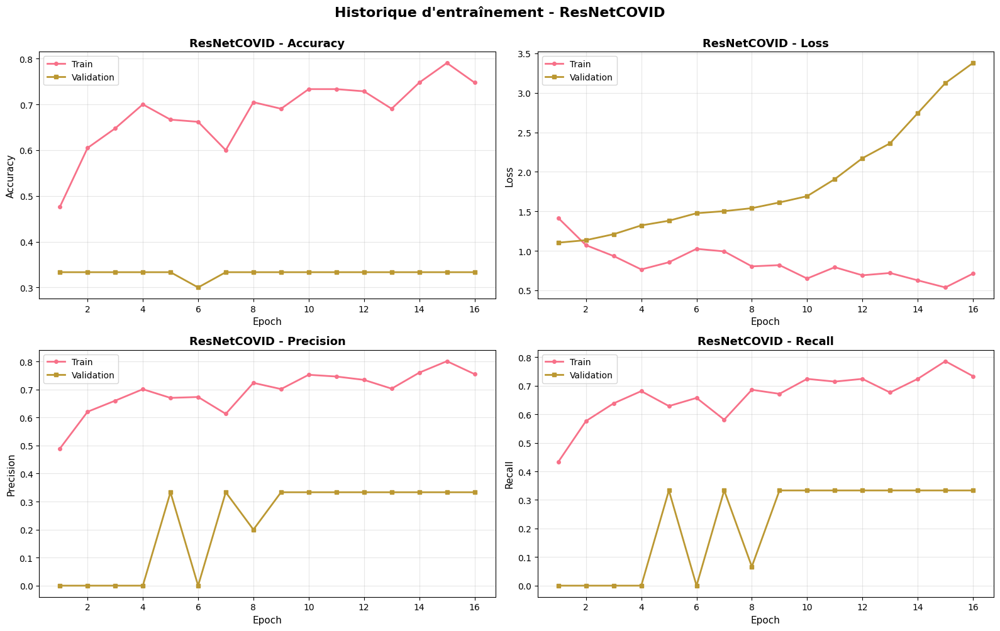


📊 MEILLEURS RÉSULTATS - ResNetCOVID (Epoch 1)
   🔵 Train Accuracy:      0.4762
   🟢 Val Accuracy:        0.3333
   🔵 Train Loss:          1.4156
   🟢 Val Loss:            1.1036
   🟢 Val Precision:       0.0000
   🟢 Val Recall:          0.0000
   🟢 Val AUC:             0.5306



In [32]:
# Entraîner le modèle ResNet
print("\n🚀 Début de l'entraînement du modèle ResNet...\n")

history_resnet = model_builder.train_model(
    model=resnet_model,
    train_gen=train_gen,
    val_gen=val_gen,
    epochs=50,
    patience=15
)

# Visualiser l'historique d'entraînement
model_builder.plot_training_history(history_resnet, 'ResNetCOVID')

🔄 Création de l'évaluateur pour ResNet...

🚀 Lancement de l'évaluation complète...


######################################################################
# ÉVALUATION COMPLÈTE DU MODÈLE: ResNetCOVID
######################################################################


ÉTAPE 1/4 : Évaluation des métriques globales

📊 ÉVALUATION DU MODÈLE: ResNetCOVID
   🟡 Test samples: 60

🔄 Génération des prédictions...
2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 851ms/step

📈 RÉSULTATS SUR LE TEST SET
   🎯 Accuracy:    0.3333 (33.33%)
   📉 Loss:        1.1036
   🎯 Precision:   0.0000
   🎯 Recall:      0.0000
   📊 AUC:         0.5278


ÉTAPE 2/4 : Matrices de confusion


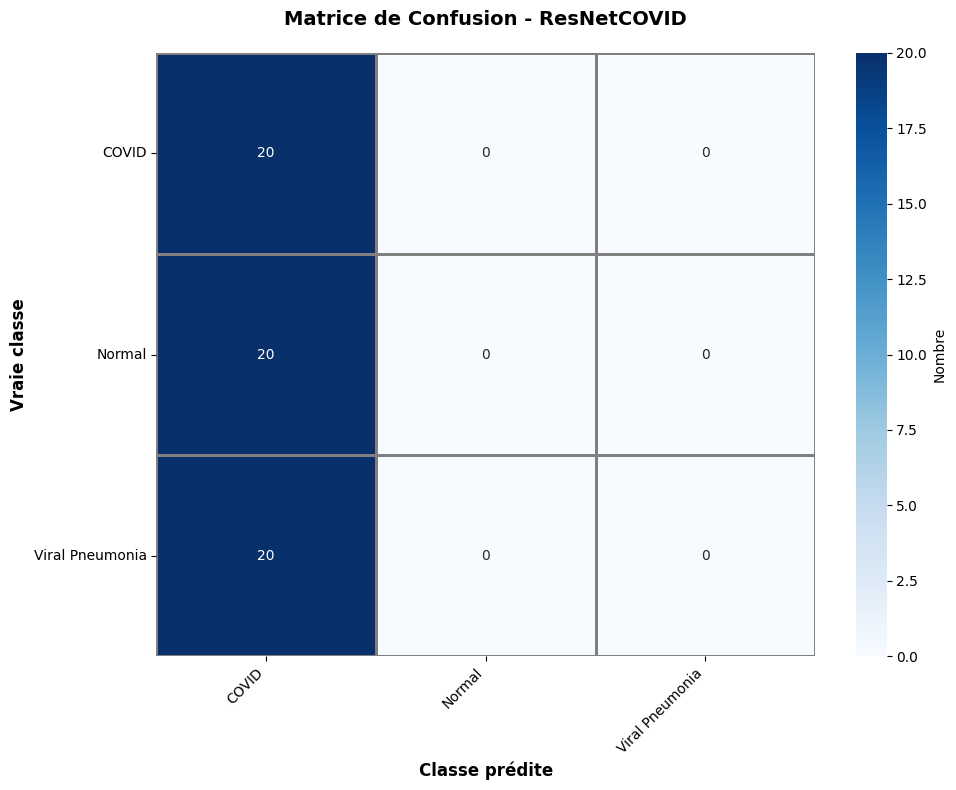

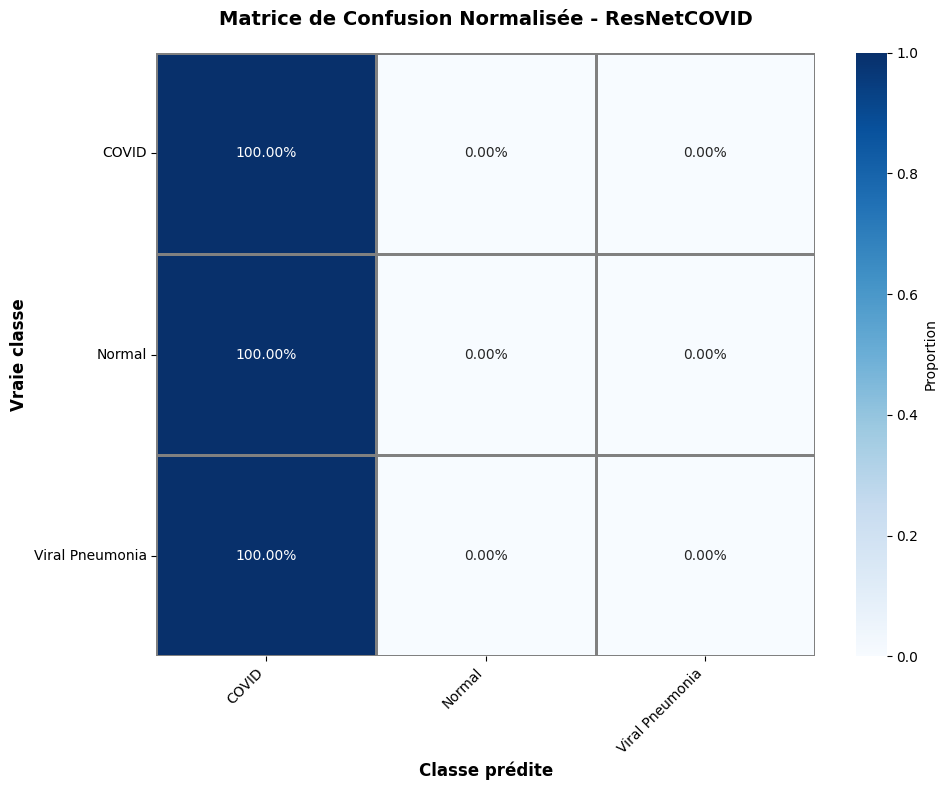


ÉTAPE 3/4 : Rapport de classification


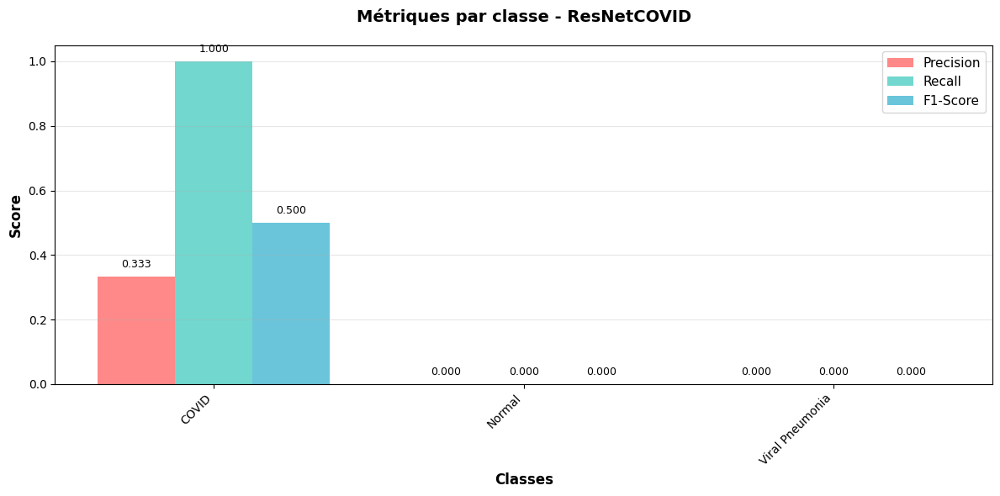


📋 RAPPORT DE CLASSIFICATION DÉTAILLÉ - ResNetCOVID

                 precision    recall  f1-score   support

          COVID     0.3333    1.0000    0.5000        20
         Normal     0.0000    0.0000    0.0000        20
Viral Pneumonia     0.0000    0.0000    0.0000        20

       accuracy                         0.3333        60
      macro avg     0.1111    0.3333    0.1667        60
   weighted avg     0.1111    0.3333    0.1667        60



ÉTAPE 4/4 : Courbes ROC


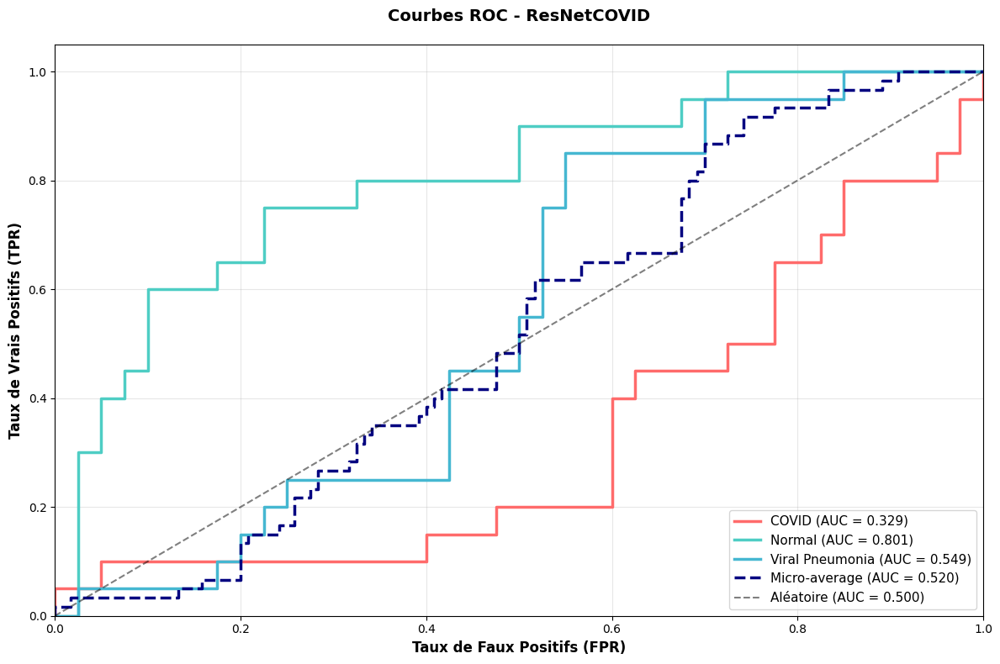


📊 AUC PAR CLASSE - ResNetCOVID
   • COVID               : 0.3288
   • Normal              : 0.8013
   • Viral Pneumonia     : 0.5488
   • Micro-average       : 0.5199


######################################################################
# ✅ ÉVALUATION COMPLÈTE TERMINÉE!
######################################################################



In [33]:
# Créer l'évaluateur pour ResNet
print("🔄 Création de l'évaluateur pour ResNet...")
evaluator_resnet = ModelEvaluator(resnet_model, test_gen, class_names=CLASSES)

# Évaluation complète
print("\n🚀 Lancement de l'évaluation complète...\n")
metrics_resnet, cm_resnet, report_resnet, roc_resnet = evaluator_resnet.full_evaluation()


📊 STATISTIQUES DÉTAILLÉES PAR CLASSE


📊 STATISTIQUES DÉTAILLÉES PAR CLASSE - ResNetCOVID



🔍 ANALYSE DES ERREURS


🔍 ANALYSE DES ERREURS - ResNetCOVID

📊 Statistiques globales:
   • Total d'images testées: 60
   • Prédictions correctes: 20
   • Prédictions incorrectes: 40
   • Accuracy: 0.3333 (33.33%)

📋 Erreurs par classe:
──────────────────────────────────────────────────────────────────────

   COVID:
      Total: 0
      Correct: 20 (inf%)
      Erreurs: -20 (0.0%)

   Normal:
      Total: 0
      Correct: 0 (nan%)
      Erreurs: 0 (0.0%)

   Viral Pneumonia:
      Total: 0
      Correct: 0 (nan%)
      Erreurs: 0 (0.0%)




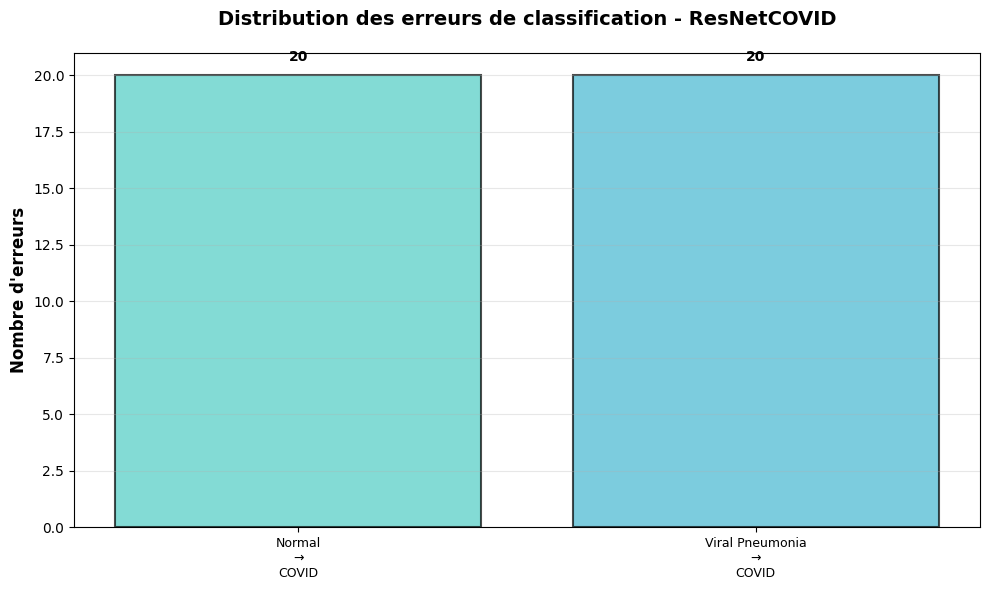

In [34]:
# Statistiques par classe
print("\n" + "="*70)
print("📊 STATISTIQUES DÉTAILLÉES PAR CLASSE")
print("="*70 + "\n")
detailed_class_stats(evaluator_resnet)

# Analyse des erreurs
print("\n" + "="*70)
print("🔍 ANALYSE DES ERREURS")
print("="*70 + "\n")
analyze_errors(evaluator_resnet)


🟢 Exemples de prédictions CORRECTES (ResNet):


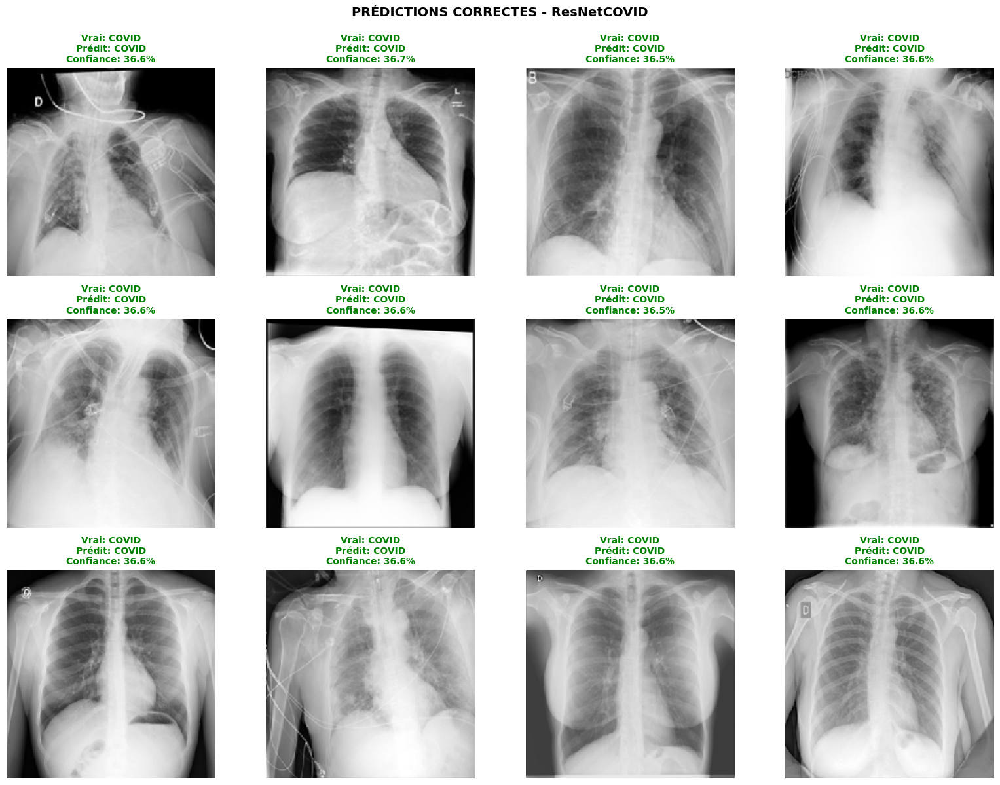

✅ 12 exemples affichés sur 20 disponibles


🔴 Exemples de prédictions INCORRECTES (ResNet):


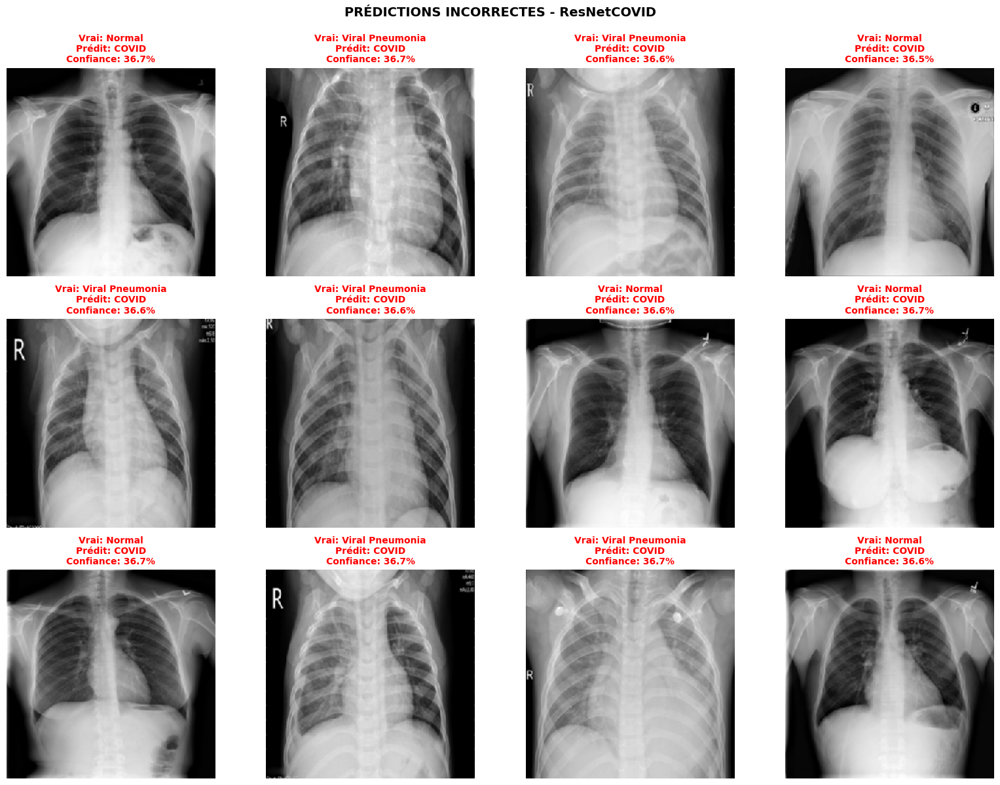

✅ 12 exemples affichés sur 40 disponibles


In [35]:
# Prédictions correctes
print("\n🟢 Exemples de prédictions CORRECTES (ResNet):")
evaluator_resnet.plot_prediction_samples(n_samples=12, correct=True)

print("\n" + "="*70 + "\n")

# Prédictions incorrectes
print("🔴 Exemples de prédictions INCORRECTES (ResNet):")
evaluator_resnet.plot_prediction_samples(n_samples=12, correct=False)


🆚 COMPARAISON: SimpleCNN vs ResNetCOVID

Métrique             SimpleCNN            ResNetCOVID          Différence     
───────────────────────────────────────────────────────────────────────────
Accuracy             0.3333               0.3333               ⚪ +0.0000
Precision            0.1111               0.1111               ⚪ +0.0000
Recall               0.3333               0.3333               ⚪ +0.0000
F1                   0.1667               0.1667               ⚪ +0.0000
───────────────────────────────────────────────────────────────────────────



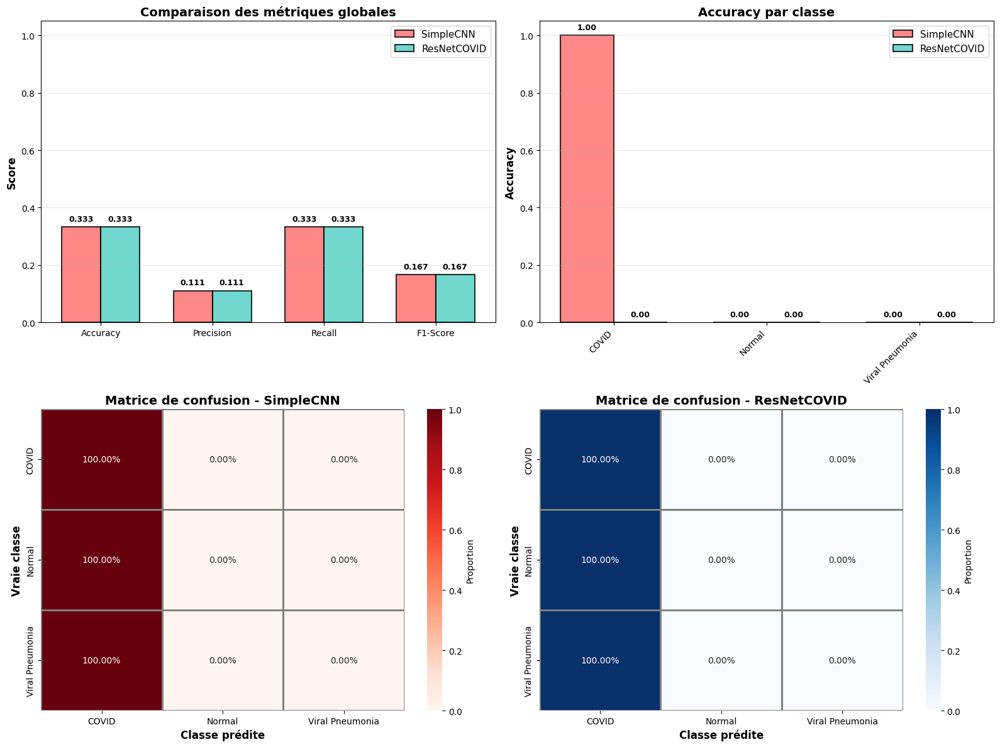


📊 RÉSUMÉ DE LA COMPARAISON

🏆 Meilleur modèle (Accuracy): SimpleCNN
📈 Amélioration: 0.00%

📋 Performance par classe:
   COVID:
      • SimpleCNN: 100.00%
      • ResNetCOVID: 0.00%
      • Différence: 🔴 -100.00%

   Normal:
      • SimpleCNN: 0.00%
      • ResNetCOVID: 0.00%
      • Différence: ⚪ +0.00%

   Viral Pneumonia:
      • SimpleCNN: 0.00%
      • ResNetCOVID: 0.00%
      • Différence: ⚪ +0.00%




In [36]:
def compare_models(evaluator1, evaluator2, model1_name="Modèle 1", model2_name="Modèle 2"):
    """Compare deux modèles en détail"""
    
    print(f"\n{'='*70}")
    print(f"🆚 COMPARAISON: {model1_name} vs {model2_name}")
    print(f"{'='*70}\n")
    
    # Métriques globales
    from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
    
    metrics1 = {
        'accuracy': accuracy_score(evaluator1.y_true, evaluator1.y_pred),
        'precision': precision_score(evaluator1.y_true, evaluator1.y_pred, average='weighted'),
        'recall': recall_score(evaluator1.y_true, evaluator1.y_pred, average='weighted'),
        'f1': f1_score(evaluator1.y_true, evaluator1.y_pred, average='weighted')
    }
    
    metrics2 = {
        'accuracy': accuracy_score(evaluator2.y_true, evaluator2.y_pred),
        'precision': precision_score(evaluator2.y_true, evaluator2.y_pred, average='weighted'),
        'recall': recall_score(evaluator2.y_true, evaluator2.y_pred, average='weighted'),
        'f1': f1_score(evaluator2.y_true, evaluator2.y_pred, average='weighted')
    }
    
    # Tableau comparatif
    print(f"{'Métrique':<20} {model1_name:<20} {model2_name:<20} {'Différence':<15}")
    print(f"{'─'*75}")
    
    for metric in ['accuracy', 'precision', 'recall', 'f1']:
        val1 = metrics1[metric]
        val2 = metrics2[metric]
        diff = val2 - val1
        sign = "🟢" if diff > 0 else "🔴" if diff < 0 else "⚪"
        
        print(f"{metric.capitalize():<20} {val1:<20.4f} {val2:<20.4f} {sign} {diff:+.4f}")
    
    print(f"{'─'*75}\n")
    
    # Visualisation
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    
    # Graphique 1: Comparaison des métriques globales
    metrics_names = ['Accuracy', 'Precision', 'Recall', 'F1-Score']
    model1_values = [metrics1['accuracy'], metrics1['precision'], metrics1['recall'], metrics1['f1']]
    model2_values = [metrics2['accuracy'], metrics2['precision'], metrics2['recall'], metrics2['f1']]
    
    x = np.arange(len(metrics_names))
    width = 0.35
    
    axes[0, 0].bar(x - width/2, model1_values, width, label=model1_name, 
                   color='#FF6B6B', alpha=0.8, edgecolor='black', linewidth=1.5)
    axes[0, 0].bar(x + width/2, model2_values, width, label=model2_name, 
                   color='#4ECDC4', alpha=0.8, edgecolor='black', linewidth=1.5)
    
    axes[0, 0].set_ylabel('Score', fontsize=12, fontweight='bold')
    axes[0, 0].set_title('Comparaison des métriques globales', fontsize=14, fontweight='bold')
    axes[0, 0].set_xticks(x)
    axes[0, 0].set_xticklabels(metrics_names)
    axes[0, 0].legend(fontsize=11)
    axes[0, 0].set_ylim([0, 1.05])
    axes[0, 0].grid(axis='y', alpha=0.3)
    
    # Ajouter les valeurs
    for i, (v1, v2) in enumerate(zip(model1_values, model2_values)):
        axes[0, 0].text(i - width/2, v1 + 0.02, f'{v1:.3f}', ha='center', fontsize=9, fontweight='bold')
        axes[0, 0].text(i + width/2, v2 + 0.02, f'{v2:.3f}', ha='center', fontsize=9, fontweight='bold')
    
    # Graphique 2: Accuracy par classe
    accuracies1 = []
    accuracies2 = []
    
    for i, class_name in enumerate(evaluator1.class_names):
        class_indices1 = np.where(evaluator1.y_true == i)[0]
        class_indices2 = np.where(evaluator2.y_true == i)[0]
        
        if len(class_indices1) > 0:
            acc1 = np.sum(evaluator1.y_pred[class_indices1] == i) / len(class_indices1)
        else:
            acc1 = 0
            
        if len(class_indices2) > 0:
            acc2 = np.sum(evaluator2.y_pred[class_indices2] == i) / len(class_indices2)
        else:
            acc2 = 0
        
        accuracies1.append(acc1)
        accuracies2.append(acc2)
    
    x = np.arange(len(evaluator1.class_names))
    
    axes[0, 1].bar(x - width/2, accuracies1, width, label=model1_name, 
                   color='#FF6B6B', alpha=0.8, edgecolor='black', linewidth=1.5)
    axes[0, 1].bar(x + width/2, accuracies2, width, label=model2_name, 
                   color='#4ECDC4', alpha=0.8, edgecolor='black', linewidth=1.5)
    
    axes[0, 1].set_ylabel('Accuracy', fontsize=12, fontweight='bold')
    axes[0, 1].set_title('Accuracy par classe', fontsize=14, fontweight='bold')
    axes[0, 1].set_xticks(x)
    axes[0, 1].set_xticklabels(evaluator1.class_names, rotation=45, ha='right')
    axes[0, 1].legend(fontsize=11)
    axes[0, 1].set_ylim([0, 1.05])
    axes[0, 1].grid(axis='y', alpha=0.3)
    
    # Ajouter les valeurs
    for i, (a1, a2) in enumerate(zip(accuracies1, accuracies2)):
        axes[0, 1].text(i - width/2, a1 + 0.02, f'{a1:.2f}', ha='center', fontsize=9, fontweight='bold')
        axes[0, 1].text(i + width/2, a2 + 0.02, f'{a2:.2f}', ha='center', fontsize=9, fontweight='bold')
    
    # Graphique 3: Matrice de confusion modèle 1
    cm1 = confusion_matrix(evaluator1.y_true, evaluator1.y_pred)
    cm1_norm = cm1.astype('float') / cm1.sum(axis=1)[:, np.newaxis]
    
    sns.heatmap(cm1_norm, annot=True, fmt='.2%', cmap='Reds', 
                xticklabels=evaluator1.class_names, 
                yticklabels=evaluator1.class_names,
                cbar_kws={'label': 'Proportion'},
                linewidths=1, linecolor='gray', ax=axes[1, 0])
    
    axes[1, 0].set_title(f'Matrice de confusion - {model1_name}', fontsize=14, fontweight='bold')
    axes[1, 0].set_ylabel('Vraie classe', fontsize=12, fontweight='bold')
    axes[1, 0].set_xlabel('Classe prédite', fontsize=12, fontweight='bold')
    
    # Graphique 4: Matrice de confusion modèle 2
    cm2 = confusion_matrix(evaluator2.y_true, evaluator2.y_pred)
    cm2_norm = cm2.astype('float') / cm2.sum(axis=1)[:, np.newaxis]
    
    sns.heatmap(cm2_norm, annot=True, fmt='.2%', cmap='Blues', 
                xticklabels=evaluator2.class_names, 
                yticklabels=evaluator2.class_names,
                cbar_kws={'label': 'Proportion'},
                linewidths=1, linecolor='gray', ax=axes[1, 1])
    
    axes[1, 1].set_title(f'Matrice de confusion - {model2_name}', fontsize=14, fontweight='bold')
    axes[1, 1].set_ylabel('Vraie classe', fontsize=12, fontweight='bold')
    axes[1, 1].set_xlabel('Classe prédite', fontsize=12, fontweight='bold')
    
    plt.tight_layout()
    plt.show()
    
    # Résumé de la comparaison
    print(f"\n{'='*70}")
    print(f"📊 RÉSUMÉ DE LA COMPARAISON")
    print(f"{'='*70}\n")
    
    winner = model2_name if metrics2['accuracy'] > metrics1['accuracy'] else model1_name
    improvement = abs(metrics2['accuracy'] - metrics1['accuracy']) * 100
    
    print(f"🏆 Meilleur modèle (Accuracy): {winner}")
    print(f"📈 Amélioration: {improvement:.2f}%")
    
    # Comparaison par classe
    print(f"\n📋 Performance par classe:")
    for i, class_name in enumerate(evaluator1.class_names):
        acc1 = accuracies1[i]
        acc2 = accuracies2[i]
        diff = (acc2 - acc1) * 100
        sign = "🟢" if diff > 0 else "🔴" if diff < 0 else "⚪"
        
        print(f"   {class_name}:")
        print(f"      • {model1_name}: {acc1*100:.2f}%")
        print(f"      • {model2_name}: {acc2*100:.2f}%")
        print(f"      • Différence: {sign} {diff:+.2f}%\n")
    
    print(f"{'='*70}\n")
    
    return metrics1, metrics2

# Lancer la comparaison
metrics_simple, metrics_resnet = compare_models(
    evaluator_simple, 
    evaluator_resnet, 
    model1_name="SimpleCNN", 
    model2_name="ResNetCOVID"
)


📊 TABLEAU RÉCAPITULATIF FINAL

     Modèle  Accuracy  Precision   Recall  F1-Score  Paramètres
  SimpleCNN  0.333333   0.111111 0.333333  0.166667    26215555
ResNetCOVID  0.333333   0.111111 0.333333  0.166667    11190595




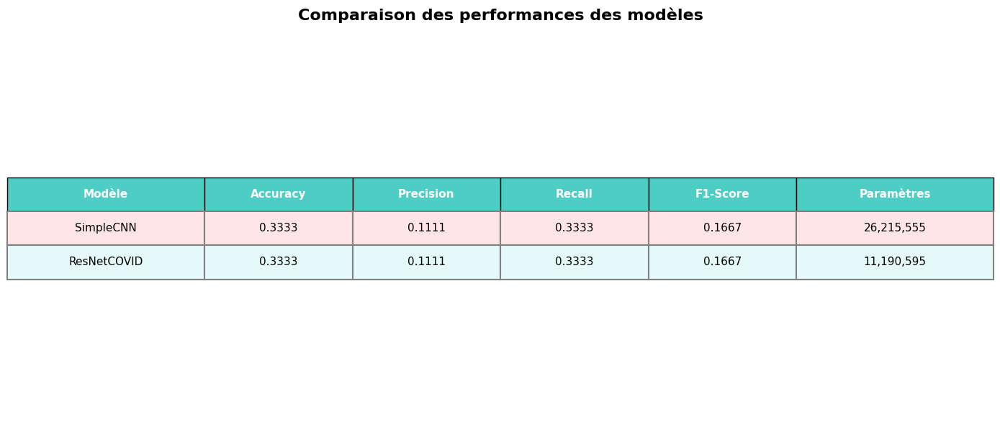

In [38]:
# Créer un DataFrame récapitulatif
comparison_df = pd.DataFrame({
    'Modèle': ['SimpleCNN', 'ResNetCOVID'],
    'Accuracy': [metrics_simple['accuracy'], metrics_resnet['accuracy']],
    'Precision': [metrics_simple['precision'], metrics_resnet['precision']],
    'Recall': [metrics_simple['recall'], metrics_resnet['recall']],
    'F1-Score': [metrics_simple['f1'], metrics_resnet['f1']],
    'Paramètres': [simple_cnn.count_params(), resnet_model.count_params()]
})

print("\n" + "="*70)
print("📊 TABLEAU RÉCAPITULATIF FINAL")
print("="*70 + "\n")
print(comparison_df.to_string(index=False))
print("\n" + "="*70 + "\n")

# Visualisation du tableau
fig, ax = plt.subplots(figsize=(14, 6))
ax.axis('tight')
ax.axis('off')

table_data = []
table_data.append(['Modèle', 'Accuracy', 'Precision', 'Recall', 'F1-Score', 'Paramètres'])

for _, row in comparison_df.iterrows():
    table_data.append([
        row['Modèle'],
        f"{row['Accuracy']:.4f}",
        f"{row['Precision']:.4f}",
        f"{row['Recall']:.4f}",
        f"{row['F1-Score']:.4f}",
        f"{row['Paramètres']:,}"
    ])

table = ax.table(cellText=table_data, cellLoc='center', loc='center',
                colWidths=[0.2, 0.15, 0.15, 0.15, 0.15, 0.2])

table.auto_set_font_size(False)
table.set_fontsize(11)
table.scale(1, 2.5)

# Style de l'en-tête
for i in range(6):
    cell = table[(0, i)]
    cell.set_facecolor('#4ECDC4')
    cell.set_text_props(weight='bold', color='white')

# Style des lignes
colors = ['#FFE5E5', '#E5F9F9']
for i in range(1, len(table_data)):
    for j in range(6):
        cell = table[(i, j)]
        cell.set_facecolor(colors[i-1])
        cell.set_edgecolor('gray')
        cell.set_linewidth(1.5)

ax.set_title('Comparaison des performances des modèles', 
            fontsize=16, fontweight='bold', pad=20)

plt.tight_layout()
plt.show()

In [39]:
# Créer un dossier pour les modèles
import os

models_dir = 'saved_models'
os.makedirs(models_dir, exist_ok=True)

# Sauvegarder SimpleCNN
simple_cnn_path = os.path.join(models_dir, 'simple_cnn_covid.h5')
simple_cnn.save(simple_cnn_path)
print(f"✅ SimpleCNN sauvegardé: {simple_cnn_path}")

# Sauvegarder ResNet
resnet_path = os.path.join(models_dir, 'resnet_covid.h5')
resnet_model.save(resnet_path)
print(f"✅ ResNetCOVID sauvegardé: {resnet_path}")

# Sauvegarder les historiques d'entraînement
import pickle

history_dir = 'training_histories'
os.makedirs(history_dir, exist_ok=True)

# Sauvegarder l'historique SimpleCNN
with open(os.path.join(history_dir, 'history_simple_cnn.pkl'), 'wb') as f:
    pickle.dump(history_simple.history, f)
print(f"✅ Historique SimpleCNN sauvegardé")

# Sauvegarder l'historique ResNet
with open(os.path.join(history_dir, 'history_resnet.pkl'), 'wb') as f:
    pickle.dump(history_resnet.history, f)
print(f"✅ Historique ResNet sauvegardé")

print(f"\n{'='*70}")
print("💾 TOUS LES MODÈLES ONT ÉTÉ SAUVEGARDÉS")
print(f"{'='*70}\n")

✅ SimpleCNN sauvegardé: saved_models/simple_cnn_covid.h5
✅ ResNetCOVID sauvegardé: saved_models/resnet_covid.h5
✅ Historique SimpleCNN sauvegardé
✅ Historique ResNet sauvegardé

💾 TOUS LES MODÈLES ONT ÉTÉ SAUVEGARDÉS



In [40]:
def predict_covid_image(model, image_path, class_names=CLASSES):
    """
    Prédit la classe d'une nouvelle image radiographique
    
    Args:
        model: Modèle entraîné
        image_path: Chemin vers l'image
        class_names: Noms des classes
    """
    # Charger et prétraiter l'image
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    
    if img is None:
        print(f"❌ Impossible de charger l'image: {image_path}")
        return None
    
    # Redimensionner
    img_resized = cv2.resize(img, (224, 224))
    
    # Normaliser
    img_normalized = img_resized / 255.0
    
    # Ajouter les dimensions
    img_input = np.expand_dims(img_normalized, axis=-1)
    img_input = np.expand_dims(img_input, axis=0)
    
    # Prédiction
    predictions = model.predict(img_input, verbose=0)
    predicted_class_idx = np.argmax(predictions[0])
    predicted_class = class_names[predicted_class_idx]
    confidence = predictions[0][predicted_class_idx] * 100
    
    # Visualisation
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    
    # Image originale
    axes[0].imshow(img, cmap='gray')
    axes[0].set_title('Image originale', fontsize=14, fontweight='bold')
    axes[0].axis('off')
    
    # Graphique des probabilités
    colors = ['#FF6B6B', '#4ECDC4', '#45B7D1']
    bars = axes[1].barh(class_names, predictions[0] * 100, color=colors, alpha=0.8, edgecolor='black', linewidth=1.5)
    
    axes[1].set_xlabel('Probabilité (%)', fontsize=12, fontweight='bold')
    axes[1].set_title('Prédictions du modèle', fontsize=14, fontweight='bold')
    axes[1].set_xlim([0, 105])
    axes[1].grid(axis='x', alpha=0.3)
    
    # Ajouter les valeurs
    for i, (bar, prob) in enumerate(zip(bars, predictions[0] * 100)):
        axes[1].text(prob + 2, i, f'{prob:.2f}%', va='center', fontweight='bold', fontsize=10)
    
    # Surligner la prédiction
    bars[predicted_class_idx].set_edgecolor('gold')
    bars[predicted_class_idx].set_linewidth(3)
    
    plt.suptitle(f'🔍 Prédiction: {predicted_class} (Confiance: {confidence:.2f}%)', 
                fontsize=16, fontweight='bold', y=1.02)
    
    plt.tight_layout()
    plt.show()
    
    # Résultat textuel
    print(f"\n{'='*70}")
    print(f"🔍 RÉSULTAT DE LA PRÉDICTION - {model.name}")
    print(f"{'='*70}")
    print(f"   📁 Image: {os.path.basename(image_path)}")
    print(f"   🏷️  Prédiction: {predicted_class}")
    print(f"   📊 Confiance: {confidence:.2f}%")
    print(f"\n   Probabilités détaillées:")
    for i, (class_name, prob) in enumerate(zip(class_names, predictions[0])):
        print(f"      • {class_name}: {prob*100:.2f}%")
    print(f"{'='*70}\n")
    
    return {
        'predicted_class': predicted_class,
        'confidence': confidence,
        'probabilities': dict(zip(class_names, predictions[0]))
    }

print("✅ Fonction de prédiction créée!")

✅ Fonction de prédiction créée!


🧪 Test de prédiction sur une image du test set
   Vraie classe: COVID

📊 Prédiction avec SimpleCNN:


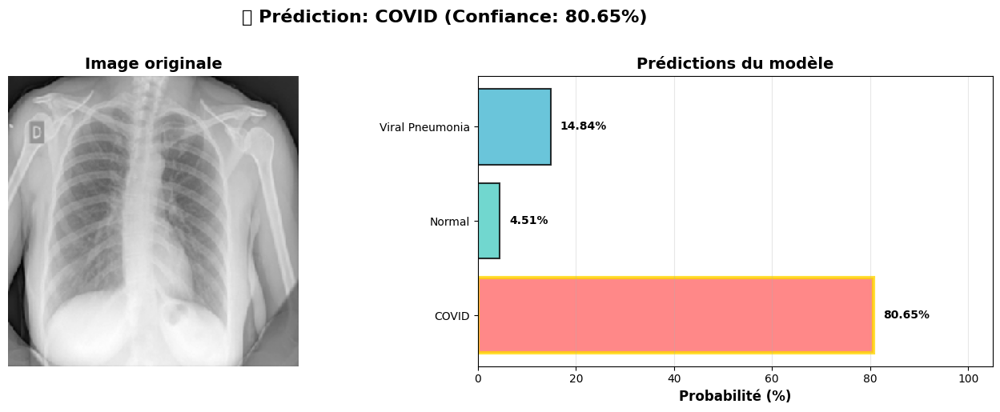


🔍 RÉSULTAT DE LA PRÉDICTION - SimpleCNN
   📁 Image: temp_test_image.png
   🏷️  Prédiction: COVID
   📊 Confiance: 80.65%

   Probabilités détaillées:
      • COVID: 80.65%
      • Normal: 4.51%
      • Viral Pneumonia: 14.84%



📊 Prédiction avec ResNetCOVID:


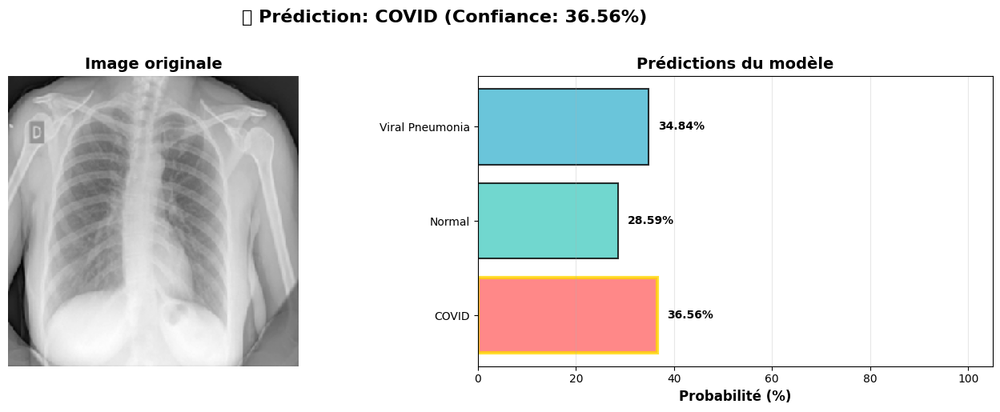


🔍 RÉSULTAT DE LA PRÉDICTION - ResNetCOVID
   📁 Image: temp_test_image.png
   🏷️  Prédiction: COVID
   📊 Confiance: 36.56%

   Probabilités détaillées:
      • COVID: 36.56%
      • Normal: 28.59%
      • Viral Pneumonia: 34.84%



In [41]:
# Tester sur une image aléatoire du test set
import random

# Choisir une image aléatoire
test_image_idx = random.randint(0, len(evaluator_resnet.y_true) - 1)

# Récupérer l'image
test_gen.reset()
all_images = []
for batch_x, batch_y in test_gen:
    all_images.extend(batch_x)
    if len(all_images) >= test_gen.n:
        break

test_image = all_images[test_image_idx]
true_label = CLASSES[evaluator_resnet.y_true[test_image_idx]]

# Sauvegarder temporairement l'image
temp_image_path = 'temp_test_image.png'
cv2.imwrite(temp_image_path, (test_image.squeeze() * 255).astype(np.uint8))

print(f"🧪 Test de prédiction sur une image du test set")
print(f"   Vraie classe: {true_label}\n")

# Prédiction avec SimpleCNN
print("📊 Prédiction avec SimpleCNN:")
result_simple = predict_covid_image(simple_cnn, temp_image_path)

print("\n" + "="*70 + "\n")

# Prédiction avec ResNet
print("📊 Prédiction avec ResNetCOVID:")
result_resnet = predict_covid_image(resnet_model, temp_image_path)

# Nettoyer
os.remove(temp_image_path)

In [42]:
def generate_final_report():
    """Génère un rapport final complet du projet"""
    
    print("\n" + "="*70)
    print("📋 RAPPORT FINAL - DÉTECTION COVID-19 PAR DEEP LEARNING")
    print("="*70 + "\n")
    
    print("📊 1. DONNÉES")
    print("─"*70)
    print(f"   • Dataset: COVID-19 Radiography Database")
    print(f"   • Classes: {CLASSES}")
    print(f"   • Images d'entraînement: {train_gen.n}")
    print(f"   • Images de validation: {val_gen.n}")
    print(f"   • Images de test: {test_gen.n}")
    print(f"   • Taille des images: {INPUT_SHAPE}")
    print()
    
    print("🏗️ 2. MODÈLES DÉVELOPPÉS")
    print("─"*70)
    print(f"   A. SimpleCNN")
    print(f"      • Architecture: CNN simple avec 3 blocs convolutifs")
    print(f"      • Paramètres: {simple_cnn.count_params():,}")
    print(f"      • Accuracy: {metrics_simple['accuracy']:.4f} ({metrics_simple['accuracy']*100:.2f}%)")
    print()
    print(f"   B. ResNetCOVID")
    print(f"      • Architecture: ResNet avec blocs résiduels")
    print(f"      • Paramètres: {resnet_model.count_params():,}")
    print(f"      • Accuracy: {metrics_resnet['accuracy']:.4f} ({metrics_resnet['accuracy']*100:.2f}%)")
    print()
    
    print("📈 3. PERFORMANCES")
    print("─"*70)
    
    improvement = (metrics_resnet['accuracy'] - metrics_simple['accuracy']) * 100
    best_model = "ResNetCOVID" if metrics_resnet['accuracy'] > metrics_simple['accuracy'] else "SimpleCNN"
    
    print(f"   • Meilleur modèle: {best_model}")
    print(f"   • Amélioration: {abs(improvement):.2f}%")
    print()
    
    print("🎯 4. MÉTRIQUES DÉTAILLÉES")
    print("─"*70)
    print(f"   {'Métrique':<20} {'SimpleCNN':<15} {'ResNetCOVID':<15}")
    print(f"   {'─'*50}")
    print(f"   {'Accuracy':<20} {metrics_simple['accuracy']:<15.4f} {metrics_resnet['accuracy']:<15.4f}")
    print(f"   {'Precision':<20} {metrics_simple['precision']:<15.4f} {metrics_resnet['precision']:<15.4f}")
    print(f"   {'Recall':<20} {metrics_simple['recall']:<15.4f} {metrics_resnet['recall']:<15.4f}")
    print(f"   {'F1-Score':<20} {metrics_simple['f1']:<15.4f} {metrics_resnet['f1']:<15.4f}")
    print()
    
    print("💾 5. FICHIERS SAUVEGARDÉS")
    print("─"*70)
    print(f"   • Modèles: saved_models/")
    print(f"   • Historiques: training_histories/")
    print()
    
    print("="*70)
    print("✅ PROJET TERMINÉ AVEC SUCCÈS!")
    print("="*70 + "\n")

# Générer le rapport
generate_final_report()


📋 RAPPORT FINAL - DÉTECTION COVID-19 PAR DEEP LEARNING

📊 1. DONNÉES
──────────────────────────────────────────────────────────────────────
   • Dataset: COVID-19 Radiography Database
   • Classes: ['COVID', 'Normal', 'Viral Pneumonia']
   • Images d'entraînement: 210
   • Images de validation: 30
   • Images de test: 60
   • Taille des images: (224, 224, 1)

🏗️ 2. MODÈLES DÉVELOPPÉS
──────────────────────────────────────────────────────────────────────
   A. SimpleCNN
      • Architecture: CNN simple avec 3 blocs convolutifs
      • Paramètres: 26,215,555
      • Accuracy: 0.3333 (33.33%)

   B. ResNetCOVID
      • Architecture: ResNet avec blocs résiduels
      • Paramètres: 11,190,595
      • Accuracy: 0.3333 (33.33%)

📈 3. PERFORMANCES
──────────────────────────────────────────────────────────────────────
   • Meilleur modèle: SimpleCNN
   • Amélioration: 0.00%

🎯 4. MÉTRIQUES DÉTAILLÉES
──────────────────────────────────────────────────────────────────────
   Métrique            

In [43]:
from tensorflow.keras.applications import (
    VGG16, ResNet50, EfficientNetB0, MobileNetV2, DenseNet121
)

class TransferLearningModels:
    """Classe pour créer des modèles avec Transfer Learning"""
    
    @staticmethod
    def build_transfer_model(base_model_name='VGG16', input_shape=(224, 224, 3), 
                            num_classes=3, trainable_layers=0):
        """
        Construit un modèle avec Transfer Learning
        
        Args:
            base_model_name: Nom du modèle de base ('VGG16', 'ResNet50', etc.)
            input_shape: Forme de l'entrée
            num_classes: Nombre de classes
            trainable_layers: Nombre de couches à entraîner (0 = toutes gelées)
        """
        
        # Dictionnaire des modèles disponibles
        models_dict = {
            'VGG16': VGG16,
            'ResNet50': ResNet50,
            'EfficientNetB0': EfficientNetB0,
            'MobileNetV2': MobileNetV2,
            'DenseNet121': DenseNet121
        }
        
        if base_model_name not in models_dict:
            raise ValueError(f"Modèle {base_model_name} non supporté. Choisir parmi: {list(models_dict.keys())}")
        
        print(f"\n🏗️ Construction du modèle {base_model_name}...")
        
        # Créer le modèle de base
        base_model = models_dict[base_model_name](
            include_top=False,
            weights='imagenet',
            input_shape=input_shape
        )
        
        # Geler les couches du modèle de base
        base_model.trainable = False
        
        # Si on veut entraîner certaines couches
        if trainable_layers > 0:
            for layer in base_model.layers[-trainable_layers:]:
                layer.trainable = True
        
        # Construire le modèle complet
        inputs = layers.Input(shape=input_shape)
        
        # Prétraitement spécifique au modèle
        x = inputs
        
        # Passer par le modèle de base
        x = base_model(x, training=False)
        
        # Ajouter les couches de classification
        x = layers.GlobalAveragePooling2D(name='global_avg_pool')(x)
        x = layers.BatchNormalization(name='bn')(x)
        x = layers.Dropout(0.5, name='dropout1')(x)
        x = layers.Dense(512, activation='relu', name='fc1')(x)
        x = layers.BatchNormalization(name='bn2')(x)
        x = layers.Dropout(0.3, name='dropout2')(x)
        x = layers.Dense(256, activation='relu', name='fc2')(x)
        x = layers.Dropout(0.2, name='dropout3')(x)
        outputs = layers.Dense(num_classes, activation='softmax', name='predictions')(x)
        
        # Créer le modèle final
        model = models.Model(inputs=inputs, outputs=outputs, name=f'{base_model_name}_COVID')
        
        # Afficher les informations
        total_params = model.count_params()
        trainable_params = sum([np.prod(v.shape) for v in model.trainable_weights])
        frozen_params = total_params - trainable_params
        
        print(f"   ✅ Modèle créé!")
        print(f"   • Total paramètres: {total_params:,}")
        print(f"   • Paramètres entraînables: {trainable_params:,}")
        print(f"   • Paramètres gelés: {frozen_params:,}")
        
        return model, base_model

print("✅ Classe TransferLearningModels créée!")

✅ Classe TransferLearningModels créée!


In [45]:
# Définir toutes les constantes
BASE_DIR = 'COVID-19_Radiography_Dataset'
TRAIN_DIR = os.path.join(BASE_DIR, 'train')
VAL_DIR = os.path.join(BASE_DIR, 'val')
TEST_DIR = os.path.join(BASE_DIR, 'test')

CLASSES = ['COVID', 'Normal', 'Viral Pneumonia']
NUM_CLASSES = len(CLASSES)
INPUT_SHAPE = (224, 224, 1)
BATCH_SIZE = 32

print("✅ Constantes définies:")
print(f"   • BASE_DIR: {BASE_DIR}")
print(f"   • TRAIN_DIR: {TRAIN_DIR}")
print(f"   • VAL_DIR: {VAL_DIR}")
print(f"   • TEST_DIR: {TEST_DIR}")
print(f"   • CLASSES: {CLASSES}")
print(f"   • NUM_CLASSES: {NUM_CLASSES}")
print(f"   • BATCH_SIZE: {BATCH_SIZE}")

✅ Constantes définies:
   • BASE_DIR: COVID-19_Radiography_Dataset
   • TRAIN_DIR: COVID-19_Radiography_Dataset/train
   • VAL_DIR: COVID-19_Radiography_Dataset/val
   • TEST_DIR: COVID-19_Radiography_Dataset/test
   • CLASSES: ['COVID', 'Normal', 'Viral Pneumonia']
   • NUM_CLASSES: 3
   • BATCH_SIZE: 32


In [54]:
# Définir le chemin exact
BASE_DIR = '/Users/pcphonemac/Documents/FORMATION DATASCIENTIST/Projet COVID/COVID-19_Radiography_Dataset 2'

print("📍 Vérification du chemin...")
print("="*70)
print(f"Chemin: {BASE_DIR}")
print(f"Existe: {os.path.exists(BASE_DIR)}")

if os.path.exists(BASE_DIR):
    print("\n✅ Dataset trouvé!")
    
    # Explorer le contenu
    print("\n📂 Contenu du dataset:\n")
    contents = os.listdir(BASE_DIR)
    
    for item in sorted(contents):
        item_path = os.path.join(BASE_DIR, item)
        if os.path.isdir(item_path):
            try:
                sub_items = os.listdir(item_path)
                num_items = len(sub_items)
                print(f"   📁 {item}/ ({num_items} éléments)")
                
                # Vérifier s'il y a un sous-dossier 'images'
                if 'images' in sub_items:
                    images_path = os.path.join(item_path, 'images')
                    num_images = len([f for f in os.listdir(images_path) 
                                    if f.lower().endswith(('.png', '.jpg', '.jpeg'))])
                    print(f"      └─ images/ : {num_images} images")
            except:
                print(f"   📁 {item}/ (inaccessible)")
        else:
            print(f"   📄 {item}")
    
    print("\n" + "="*70)
else:
    print("\n❌ Chemin invalide!")

📍 Vérification du chemin...
Chemin: /Users/pcphonemac/Documents/FORMATION DATASCIENTIST/Projet COVID/COVID-19_Radiography_Dataset 2
Existe: True

✅ Dataset trouvé!

📂 Contenu du dataset:

   📄 .DS_Store
   📁 COVID/ (3 éléments)
      └─ images/ : 3616 images
   📄 COVID.metadata.xlsx
   📁 Lung_Opacity/ (3 éléments)
      └─ images/ : 6012 images
   📄 Lung_Opacity.metadata.xlsx
   📁 Normal/ (3 éléments)
      └─ images/ : 10192 images
   📄 Normal.metadata.xlsx
   📄 README.md.txt
   📁 Viral Pneumonia/ (3 éléments)
      └─ images/ : 1345 images
   📄 Viral Pneumonia.metadata.xlsx



In [55]:
# Identifier les classes et leurs chemins
print("\n📊 Analyse de la structure...")
print("="*70)

class_info = {}

for item in os.listdir(BASE_DIR):
    item_path = os.path.join(BASE_DIR, item)
    
    # Ignorer les fichiers cachés et système
    if item.startswith('.') or item == '__MACOSX':
        continue
    
    if os.path.isdir(item_path):
        # Vérifier si c'est un dossier de classe
        images_path = None
        num_images = 0
        
        # Cas 1: images directement dans le dossier
        direct_images = [f for f in os.listdir(item_path) 
                        if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
        
        # Cas 2: images dans un sous-dossier 'images'
        if os.path.exists(os.path.join(item_path, 'images')):
            images_path = os.path.join(item_path, 'images')
            num_images = len([f for f in os.listdir(images_path) 
                            if f.lower().endswith(('.png', '.jpg', '.jpeg'))])
        elif len(direct_images) > 0:
            images_path = item_path
            num_images = len(direct_images)
        
        if num_images > 0:
            class_info[item] = {
                'path': images_path,
                'count': num_images
            }
            print(f"\n✅ Classe: {item}")
            print(f"   📁 Chemin: {images_path}")
            print(f"   🖼️  Images: {num_images}")

print("\n" + "="*70)
print(f"\n✅ {len(class_info)} classes trouvées: {list(class_info.keys())}")


📊 Analyse de la structure...

✅ Classe: Viral Pneumonia
   📁 Chemin: /Users/pcphonemac/Documents/FORMATION DATASCIENTIST/Projet COVID/COVID-19_Radiography_Dataset 2/Viral Pneumonia/images
   🖼️  Images: 1345

✅ Classe: Lung_Opacity
   📁 Chemin: /Users/pcphonemac/Documents/FORMATION DATASCIENTIST/Projet COVID/COVID-19_Radiography_Dataset 2/Lung_Opacity/images
   🖼️  Images: 6012

✅ Classe: Normal
   📁 Chemin: /Users/pcphonemac/Documents/FORMATION DATASCIENTIST/Projet COVID/COVID-19_Radiography_Dataset 2/Normal/images
   🖼️  Images: 10192

✅ Classe: COVID
   📁 Chemin: /Users/pcphonemac/Documents/FORMATION DATASCIENTIST/Projet COVID/COVID-19_Radiography_Dataset 2/COVID/images
   🖼️  Images: 3616


✅ 4 classes trouvées: ['Viral Pneumonia', 'Lung_Opacity', 'Normal', 'COVID']


In [56]:
# Diviser le dataset
from sklearn.model_selection import train_test_split
import shutil

def split_covid_dataset(base_dir, class_info, train_ratio=0.7, val_ratio=0.15, test_ratio=0.15):
    """
    Divise le dataset COVID-19 en train/val/test
    """
    
    print("\n🔄 Division du dataset en train/val/test...")
    print("="*70)
    print(f"📊 Ratios:")
    print(f"   • Train: {train_ratio*100:.0f}%")
    print(f"   • Validation: {val_ratio*100:.0f}%")
    print(f"   • Test: {test_ratio*100:.0f}%")
    print()
    
    # Créer les dossiers train/val/test
    splits = ['train', 'val', 'test']
    
    for split in splits:
        split_dir = os.path.join(base_dir, split)
        os.makedirs(split_dir, exist_ok=True)
        
        for class_name in class_info.keys():
            class_dir = os.path.join(split_dir, class_name)
            os.makedirs(class_dir, exist_ok=True)
    
    print("✅ Dossiers créés\n")
    
    # Pour chaque classe
    for class_name, info in class_info.items():
        print(f"📂 Traitement de la classe: {class_name}")
        
        source_path = info['path']
        
        # Lister toutes les images
        all_images = [f for f in os.listdir(source_path) 
                     if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
        
        print(f"   Total: {len(all_images)} images")
        
        # Diviser en train/temp
        train_imgs, temp_imgs = train_test_split(
            all_images, 
            test_size=(1 - train_ratio), 
            random_state=42
        )
        
        # Diviser temp en val/test
        val_imgs, test_imgs = train_test_split(
            temp_imgs,
            test_size=(test_ratio / (val_ratio + test_ratio)),
            random_state=42
        )
        
        print(f"   ├─ Train: {len(train_imgs)} images")
        print(f"   ├─ Val: {len(val_imgs)} images")
        print(f"   └─ Test: {len(test_imgs)} images")
        
        # Copier les fichiers
        for img in train_imgs:
            src = os.path.join(source_path, img)
            dst = os.path.join(base_dir, 'train', class_name, img)
            shutil.copy2(src, dst)
        
        for img in val_imgs:
            src = os.path.join(source_path, img)
            dst = os.path.join(base_dir, 'val', class_name, img)
            shutil.copy2(src, dst)
        
        for img in test_imgs:
            src = os.path.join(source_path, img)
            dst = os.path.join(base_dir, 'test', class_name, img)
            shutil.copy2(src, dst)
        
        print(f"   ✅ Copie terminée\n")
    
    print("="*70)
    print("✅ Division terminée avec succès!")
    
    return {
        'train': os.path.join(base_dir, 'train'),
        'val': os.path.join(base_dir, 'val'),
        'test': os.path.join(base_dir, 'test')
    }

# Vérifier si déjà divisé
if all([os.path.exists(os.path.join(BASE_DIR, split)) for split in ['train', 'val', 'test']]):
    print("\n✅ Dataset déjà divisé!")
    
    TRAIN_DIR = os.path.join(BASE_DIR, 'train')
    VAL_DIR = os.path.join(BASE_DIR, 'val')
    TEST_DIR = os.path.join(BASE_DIR, 'test')
    
    # Afficher les stats
    for split, split_dir in [('Train', TRAIN_DIR), ('Val', VAL_DIR), ('Test', TEST_DIR)]:
        total = 0
        print(f"\n📊 {split}:")
        for class_name in os.listdir(split_dir):
            class_path = os.path.join(split_dir, class_name)
            if os.path.isdir(class_path):
                num = len(os.listdir(class_path))
                total += num
                print(f"   • {class_name}: {num} images")
        print(f"   Total: {total} images")
    
else:
    print("\n⚠️ Dataset non divisé, division en cours...")
    
    # Diviser
    dirs = split_covid_dataset(BASE_DIR, class_info)
    
    TRAIN_DIR = dirs['train']
    VAL_DIR = dirs['val']
    TEST_DIR = dirs['test']

print("\n" + "="*70)
print("✅ Chemins définis:")
print(f"   TRAIN_DIR: {TRAIN_DIR}")
print(f"   VAL_DIR: {VAL_DIR}")
print(f"   TEST_DIR: {TEST_DIR}")


⚠️ Dataset non divisé, division en cours...

🔄 Division du dataset en train/val/test...
📊 Ratios:
   • Train: 70%
   • Validation: 15%
   • Test: 15%

✅ Dossiers créés

📂 Traitement de la classe: Viral Pneumonia
   Total: 1345 images
   ├─ Train: 941 images
   ├─ Val: 202 images
   └─ Test: 202 images
   ✅ Copie terminée

📂 Traitement de la classe: Lung_Opacity
   Total: 6012 images
   ├─ Train: 4208 images
   ├─ Val: 902 images
   └─ Test: 902 images
   ✅ Copie terminée

📂 Traitement de la classe: Normal
   Total: 10192 images
   ├─ Train: 7134 images
   ├─ Val: 1529 images
   └─ Test: 1529 images
   ✅ Copie terminée

📂 Traitement de la classe: COVID
   Total: 3616 images
   ├─ Train: 2531 images
   ├─ Val: 542 images
   └─ Test: 543 images
   ✅ Copie terminée

✅ Division terminée avec succès!

✅ Chemins définis:
   TRAIN_DIR: /Users/pcphonemac/Documents/FORMATION DATASCIENTIST/Projet COVID/COVID-19_Radiography_Dataset 2/train
   VAL_DIR: /Users/pcphonemac/Documents/FORMATION DATASCI

In [57]:
# Créer les générateurs RGB pour Transfer Learning
from tensorflow.keras.preprocessing.image import ImageDataGenerator

print("\n🔄 Création des générateurs RGB...")
print("="*70)

# Paramètres
BATCH_SIZE = 32
IMG_SIZE = (224, 224)  # Taille standard pour les modèles pré-entraînés

# ImageDataGenerator avec augmentation pour train
train_datagen_rgb = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    horizontal_flip=True,
    zoom_range=0.2,
    shear_range=0.15,
    fill_mode='nearest'
)

# Sans augmentation pour val et test
val_datagen_rgb = ImageDataGenerator(rescale=1./255)
test_datagen_rgb = ImageDataGenerator(rescale=1./255)

# Créer les générateurs
train_gen_rgb = train_datagen_rgb.flow_from_directory(
    TRAIN_DIR,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    color_mode='rgb',  # RGB pour Transfer Learning
    shuffle=True,
    seed=42
)

val_gen_rgb = val_datagen_rgb.flow_from_directory(
    VAL_DIR,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    color_mode='rgb',
    shuffle=False
)

test_gen_rgb = test_datagen_rgb.flow_from_directory(
    TEST_DIR,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    color_mode='rgb',
    shuffle=False
)

print("\n✅ Générateurs RGB créés avec succès!")
print("="*70)
print(f"\n📊 Statistiques:")
print(f"   • Train: {train_gen_rgb.n} images")
print(f"   • Validation: {val_gen_rgb.n} images")
print(f"   • Test: {test_gen_rgb.n} images")
print(f"\n🎨 Configuration:")
print(f"   • Classes: {list(train_gen_rgb.class_indices.keys())}")
print(f"   • Taille images: {IMG_SIZE} (RGB)")
print(f"   • Batch size: {BATCH_SIZE}")
print(f"   • Nombre de batchs (train): {len(train_gen_rgb)}")

print("\n" + "="*70)
print("🚀 Prêt pour le Transfer Learning!")


🔄 Création des générateurs RGB...
Found 14814 images belonging to 4 classes.
Found 3175 images belonging to 4 classes.
Found 3176 images belonging to 4 classes.

✅ Générateurs RGB créés avec succès!

📊 Statistiques:
   • Train: 14814 images
   • Validation: 3175 images
   • Test: 3176 images

🎨 Configuration:
   • Classes: ['COVID', 'Lung_Opacity', 'Normal', 'Viral Pneumonia']
   • Taille images: (224, 224) (RGB)
   • Batch size: 32
   • Nombre de batchs (train): 463

🚀 Prêt pour le Transfer Learning!



🎨 Visualisation d'un batch d'images RGB...


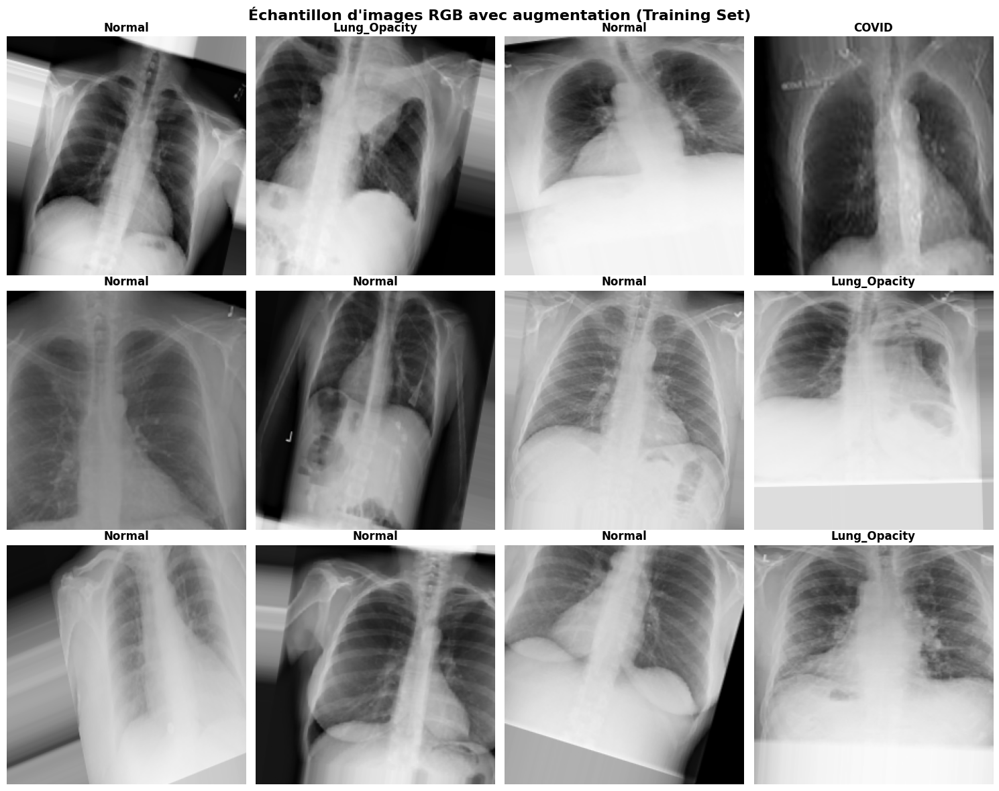


✅ Visualisation sauvegardée: visualisation_rgb_batch.png


In [58]:
# Visualiser des exemples d'images RGB avec augmentation
import matplotlib.pyplot as plt
import numpy as np

print("\n🎨 Visualisation d'un batch d'images RGB...")
print("="*70)

# Récupérer un batch
images_batch, labels_batch = next(train_gen_rgb)

# Créer la figure
fig, axes = plt.subplots(3, 4, figsize=(15, 12))
fig.suptitle('Échantillon d\'images RGB avec augmentation (Training Set)', 
             fontsize=16, fontweight='bold')

class_names = list(train_gen_rgb.class_indices.keys())

for idx, ax in enumerate(axes.flat):
    if idx < len(images_batch):
        # Afficher l'image
        ax.imshow(images_batch[idx])
        
        # Trouver la classe
        class_idx = np.argmax(labels_batch[idx])
        class_name = class_names[class_idx]
        
        ax.set_title(f'{class_name}', fontsize=12, fontweight='bold')
        ax.axis('off')

plt.tight_layout()
plt.savefig('visualisation_rgb_batch.png', dpi=150, bbox_inches='tight')
plt.show()

print("\n✅ Visualisation sauvegardée: visualisation_rgb_batch.png")

In [59]:
# Importer les modèles pré-entraînés
from tensorflow.keras.applications import VGG16, ResNet50, MobileNetV2, EfficientNetB0
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint

print("\n🏗️ Construction des modèles de Transfer Learning...")
print("="*70)

NUM_CLASSES = len(train_gen_rgb.class_indices)
IMG_SHAPE = (224, 224, 3)

def create_transfer_model(base_model_name='VGG16', trainable_layers=0):
    """
    Crée un modèle de Transfer Learning
    
    Args:
        base_model_name: Nom du modèle de base ('VGG16', 'ResNet50', 'MobileNetV2', 'EfficientNetB0')
        trainable_layers: Nombre de couches à débloquer (0 = toutes gelées)
    """
    
    print(f"\n🔨 Création du modèle: {base_model_name}")
    print(f"   Couches débloquées: {trainable_layers if trainable_layers > 0 else 'Aucune (Feature Extraction)'}")
    
    # Charger le modèle de base
    if base_model_name == 'VGG16':
        base_model = VGG16(weights='imagenet', include_top=False, input_shape=IMG_SHAPE)
    elif base_model_name == 'ResNet50':
        base_model = ResNet50(weights='imagenet', include_top=False, input_shape=IMG_SHAPE)
    elif base_model_name == 'MobileNetV2':
        base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=IMG_SHAPE)
    elif base_model_name == 'EfficientNetB0':
        base_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=IMG_SHAPE)
    else:
        raise ValueError(f"Modèle non supporté: {base_model_name}")
    
    # Geler les couches
    if trainable_layers == 0:
        # Tout geler (Feature Extraction)
        base_model.trainable = False
    else:
        # Débloquer les dernières couches (Fine-tuning)
        base_model.trainable = True
        for layer in base_model.layers[:-trainable_layers]:
            layer.trainable = False
    
    # Ajouter les couches de classification
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(512, activation='relu')(x)
    x = BatchNormalization()(x)
    x = Dropout(0.5)(x)
    x = Dense(256, activation='relu')(x)
    x = BatchNormalization()(x)
    x = Dropout(0.3)(x)
    predictions = Dense(NUM_CLASSES, activation='softmax')(x)
    
    # Créer le modèle complet
    model = Model(inputs=base_model.input, outputs=predictions)
    
    # Compiler
    model.compile(
        optimizer=Adam(learning_rate=0.0001),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )
    
    # Compter les paramètres
    trainable_params = np.sum([np.prod(v.shape) for v in model.trainable_weights])
    total_params = np.sum([np.prod(v.shape) for v in model.weights])
    
    print(f"   ✅ Modèle créé")
    print(f"   📊 Paramètres totaux: {total_params:,}")
    print(f"   🔓 Paramètres entraînables: {trainable_params:,}")
    print(f"   🔒 Paramètres gelés: {total_params - trainable_params:,}")
    
    return model

# Créer les 4 modèles
models_config = {
    'VGG16': 'VGG16',
    'ResNet50': 'ResNet50',
    'MobileNetV2': 'MobileNetV2',
    'EfficientNetB0': 'EfficientNetB0'
}

models = {}

for model_name, base_name in models_config.items():
    models[model_name] = create_transfer_model(base_name, trainable_layers=0)

print("\n" + "="*70)
print(f"✅ {len(models)} modèles créés avec succès!")
print(f"   Modèles: {list(models.keys())}")


🏗️ Construction des modèles de Transfer Learning...

🔨 Création du modèle: VGG16
   Couches débloquées: Aucune (Feature Extraction)
58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 18s 0us/step
   ✅ Modèle créé
   📊 Paramètres totaux: 15,112,772
   🔓 Paramètres entraînables: 396,548
   🔒 Paramètres gelés: 14,716,224

🔨 Création du modèle: ResNet50
   Couches débloquées: Aucune (Feature Extraction)
94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 104s 1us/step
   ✅ Modèle créé
   📊 Paramètres totaux: 24,772,228
   🔓 Paramètres entraînables: 1,182,980
   🔒 Paramètres gelés: 23,589,248

🔨 Création du modèle: MobileNetV2
   Couches débloquées: Aucune (Feature Extraction)
9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step
   ✅ Modèle créé
   📊 Paramètres totaux: 3,049,284
   🔓 Paramètres entraînables: 789,764
   🔒 Paramètres gelés: 2,259,520

🔨 Création du modèle: EfficientNetB0
   Couches débloquées: Aucune (Feature Extraction)
16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step 
   ✅ Modèle créé
   📊 Paramètre

In [60]:
# Afficher l'architecture de VGG16
print("\n📋 Architecture du modèle VGG16:")
print("="*70)

models['VGG16'].summary()

print("\n" + "="*70)


📋 Architecture du modèle VGG16:


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │       262,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 256)            │       131,32

 Total params: 15,112,772 (57.65 MB)

 Trainable params: 396,548 (1.51 MB)

 Non-trainable params: 14,716,224 (56.14 MB)

In [61]:
# Configurer les callbacks pour l'entraînement
print("\n🎯 Configuration des callbacks...")
print("="*70)

# Créer le dossier pour sauvegarder les modèles
os.makedirs('saved_models_transfer', exist_ok=True)

def get_callbacks(model_name):
    """Retourne les callbacks pour un modèle"""
    
    callbacks = [
        # Early Stopping
        EarlyStopping(
            monitor='val_loss',
            patience=10,
            restore_best_weights=True,
            verbose=1
        ),
        
        # Réduction du learning rate
        ReduceLROnPlateau(
            monitor='val_loss',
            factor=0.5,
            patience=5,
            min_lr=1e-7,
            verbose=1
        ),
        
        # Sauvegarde du meilleur modèle
        ModelCheckpoint(
            filepath=f'saved_models_transfer/best_{model_name}.h5',
            monitor='val_accuracy',
            save_best_only=True,
            verbose=1
        )
    ]
    
    return callbacks

print("✅ Callbacks configurés:")
print("   • EarlyStopping (patience=10)")
print("   • ReduceLROnPlateau (factor=0.5, patience=5)")
print("   • ModelCheckpoint (meilleur modèle)")
print("\n" + "="*70)


🎯 Configuration des callbacks...
✅ Callbacks configurés:
   • EarlyStopping (patience=10)
   • ReduceLROnPlateau (factor=0.5, patience=5)
   • ModelCheckpoint (meilleur modèle)



In [3]:
import os
import shutil
import random

print("🎯 CRÉATION DU SUBSET - Version Rapide")
print("="*70)

# Chemin de base
BASE_DIR = '/Users/pcphonemac/Documents/FORMATION DATASCIENTIST/Projet COVID/COVID-19_Radiography_Dataset 2'

# Dossier de destination
SUBSET_BASE = os.path.join(BASE_DIR, 'SUBSET')

# Configuration
NUM_TRAIN = 150  # 150 images par classe pour train
NUM_VAL = 50     # 50 pour validation
NUM_TEST = 50    # 50 pour test

print(f"\n📋 Configuration:")
print(f"   • Train: {NUM_TRAIN} images/classe")
print(f"   • Val: {NUM_VAL} images/classe")
print(f"   • Test: {NUM_TEST} images/classe")

# Supprimer l'ancien subset s'il existe
if os.path.exists(SUBSET_BASE):
    shutil.rmtree(SUBSET_BASE)
    print(f"\n🗑️  Ancien subset supprimé")

os.makedirs(SUBSET_BASE, exist_ok=True)
print(f"✅ Dossier créé: {SUBSET_BASE}")

# Identifier les classes
print(f"\n🔍 Recherche des classes...")

classes_info = {}

for item in os.listdir(BASE_DIR):
    item_path = os.path.join(BASE_DIR, item)
    
    # Ignorer les dossiers système
    if item.startswith('.') or item in ['__MACOSX', 'SUBSET', 'train', 'val', 'test']:
        continue
    
    if os.path.isdir(item_path):
        # Chercher les images
        images_path = None
        
        # Cas 1: sous-dossier 'images'
        if os.path.exists(os.path.join(item_path, 'images')):
            images_path = os.path.join(item_path, 'images')
        else:
            images_path = item_path
        
        # Lister les images
        images_list = [f for f in os.listdir(images_path) 
                      if f.lower().endswith(('.png', '.jpg', '.jpeg')) and not f.startswith('.')]
        
        if len(images_list) > 0:
            classes_info[item] = {
                'path': images_path,
                'images': images_list
            }
            print(f"   ✅ {item}: {len(images_list)} images")

print(f"\n✅ {len(classes_info)} classes trouvées")

# Créer les subsets
print(f"\n🔄 Copie des images...")

random.seed(42)  # Pour la reproductibilité

for split, num_images in [('train', NUM_TRAIN), ('val', NUM_VAL), ('test', NUM_TEST)]:
    print(f"\n📂 {split.upper()}:")
    
    for class_name, info in classes_info.items():
        # Créer le dossier
        dest_dir = os.path.join(SUBSET_BASE, split, class_name)
        os.makedirs(dest_dir, exist_ok=True)
        
        # Sélectionner aléatoirement
        available = info['images'].copy()
        num_to_select = min(num_images, len(available))
        selected = random.sample(available, num_to_select)
        
        # Copier les images
        for img in selected:
            src = os.path.join(info['path'], img)
            dst = os.path.join(dest_dir, img)
            shutil.copy2(src, dst)
        
        print(f"   • {class_name}: {num_to_select} images")

# Définir les chemins
TRAIN_DIR_SUBSET = os.path.join(SUBSET_BASE, 'train')
VAL_DIR_SUBSET = os.path.join(SUBSET_BASE, 'val')
TEST_DIR_SUBSET = os.path.join(SUBSET_BASE, 'test')

print(f"\n" + "="*70)
print("✅ SUBSET CRÉÉ AVEC SUCCÈS!")
print(f"\n📁 Chemins:")
print(f"   • Train: {TRAIN_DIR_SUBSET}")
print(f"   • Val: {VAL_DIR_SUBSET}")
print(f"   • Test: {TEST_DIR_SUBSET}")
print("="*70)

🎯 CRÉATION DU SUBSET - Version Rapide

📋 Configuration:
   • Train: 150 images/classe
   • Val: 50 images/classe
   • Test: 50 images/classe
✅ Dossier créé: /Users/pcphonemac/Documents/FORMATION DATASCIENTIST/Projet COVID/COVID-19_Radiography_Dataset 2/SUBSET

🔍 Recherche des classes...
   ✅ Viral Pneumonia: 1345 images
   ✅ Lung_Opacity: 6012 images
   ✅ Normal: 10192 images
   ✅ COVID: 3616 images

✅ 4 classes trouvées

🔄 Copie des images...

📂 TRAIN:
   • Viral Pneumonia: 150 images
   • Lung_Opacity: 150 images
   • Normal: 150 images
   • COVID: 150 images

📂 VAL:
   • Viral Pneumonia: 50 images
   • Lung_Opacity: 50 images
   • Normal: 50 images
   • COVID: 50 images

📂 TEST:
   • Viral Pneumonia: 50 images
   • Lung_Opacity: 50 images
   • Normal: 50 images
   • COVID: 50 images

✅ SUBSET CRÉÉ AVEC SUCCÈS!

📁 Chemins:
   • Train: /Users/pcphonemac/Documents/FORMATION DATASCIENTIST/Projet COVID/COVID-19_Radiography_Dataset 2/SUBSET/train
   • Val: /Users/pcphonemac/Documents/FORM

In [4]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

print("\n🎨 CRÉATION DES GÉNÉRATEURS OPTIMISÉS")
print("="*70)

# Paramètres optimisés
BATCH_SIZE = 32
IMG_SIZE = (128, 128)  # Plus petit = plus rapide

print(f"\n📋 Configuration:")
print(f"   • Taille images: {IMG_SIZE}")
print(f"   • Batch size: {BATCH_SIZE}")

# Data augmentation pour train
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
    zoom_range=0.1
)

# Sans augmentation pour val/test
val_test_datagen = ImageDataGenerator(rescale=1./255)

# Créer les générateurs
train_gen = train_datagen.flow_from_directory(
    TRAIN_DIR_SUBSET,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    color_mode='rgb',
    shuffle=True,
    seed=42
)

val_gen = val_test_datagen.flow_from_directory(
    VAL_DIR_SUBSET,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    color_mode='rgb',
    shuffle=False
)

test_gen = val_test_datagen.flow_from_directory(
    TEST_DIR_SUBSET,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    color_mode='rgb',
    shuffle=False
)

print(f"\n✅ Générateurs créés!")
print(f"\n📊 Statistiques:")
print(f"   • Train: {train_gen.n} images ({len(train_gen)} batches)")
print(f"   • Val: {val_gen.n} images ({len(val_gen)} batches)")
print(f"   • Test: {test_gen.n} images ({len(test_gen)} batches)")
print(f"   • Classes: {list(train_gen.class_indices.keys())}")
print("="*70)

2026-03-13 13:48:46.424158: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
/opt/anaconda3/envs/covid_ds/lib/python3.12/site-packages/requests/__init__.py:86: RequestsDependencyWarning: Unable to find acceptable character detection dependency (chardet or charset_normalizer).
  warnings.warn(



🎨 CRÉATION DES GÉNÉRATEURS OPTIMISÉS

📋 Configuration:
   • Taille images: (128, 128)
   • Batch size: 32
Found 600 images belonging to 4 classes.
Found 200 images belonging to 4 classes.
Found 200 images belonging to 4 classes.

✅ Générateurs créés!

📊 Statistiques:
   • Train: 600 images (19 batches)
   • Val: 200 images (7 batches)
   • Test: 200 images (7 batches)
   • Classes: ['COVID', 'Lung_Opacity', 'Normal', 'Viral Pneumonia']


In [5]:
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.optimizers import Adam

print("\n🏗️ CRÉATION DU MODÈLE MOBILENETV2")
print("="*70)

# Paramètres
IMG_SHAPE = (128, 128, 3)
NUM_CLASSES = len(train_gen.class_indices)

print(f"\n📋 Configuration:")
print(f"   • Input shape: {IMG_SHAPE}")
print(f"   • Nombre de classes: {NUM_CLASSES}")

# Charger MobileNetV2 pré-entraîné
base_model = MobileNetV2(
    weights='imagenet',
    include_top=False,
    input_shape=IMG_SHAPE
)

# Geler le modèle de base
base_model.trainable = False
print(f"   • Base model: MobileNetV2 (gelé)")

# Ajouter les couches de classification
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(128, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(NUM_CLASSES, activation='softmax')(x)

# Créer le modèle complet
model = Model(inputs=base_model.input, outputs=predictions)

# Compiler
model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

print(f"   • Couches ajoutées: Dense(128) + Dropout + Softmax")
print(f"   • Optimizer: Adam (lr=0.001)")

# Compter les paramètres
trainable = sum([w.shape.num_elements() for w in model.trainable_weights])
total = sum([w.shape.num_elements() for w in model.weights])

print(f"\n📊 Paramètres:")
print(f"   • Total: {total:,}")
print(f"   • Entraînables: {trainable:,}")
print(f"   • Gelés: {total - trainable:,}")

print("\n✅ Modèle créé!")
print("="*70)


🏗️ CRÉATION DU MODÈLE MOBILENETV2

📋 Configuration:
   • Input shape: (128, 128, 3)
   • Nombre de classes: 4
9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step
   • Base model: MobileNetV2 (gelé)
   • Couches ajoutées: Dense(128) + Dropout + Softmax
   • Optimizer: Adam (lr=0.001)

📊 Paramètres:
   • Total: 2,422,468
   • Entraînables: 164,484
   • Gelés: 2,257,984

✅ Modèle créé!


In [6]:
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

print("\n🔥 ENTRAÎNEMENT DU MODÈLE")
print("="*70)

# Configuration
EPOCHS = 10

# Callbacks
callbacks = [
    EarlyStopping(
        monitor='val_loss',
        patience=5,
        restore_best_weights=True,
        verbose=1
    ),
    ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.5,
        patience=2,
        min_lr=1e-7,
        verbose=1
    )
]

print(f"\n📋 Configuration:")
print(f"   • Epochs max: {EPOCHS}")
print(f"   • Early Stopping: patience=5")
print(f"   • Steps par epoch: {len(train_gen)}")

print(f"\n⏱️  Temps estimé: ~10-15 minutes")
print(f"\n🚀 Démarrage...\n")

# ENTRAÎNER
history = model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=EPOCHS,
    callbacks=callbacks,
    verbose=1
)

print("\n" + "="*70)
print("✅ ENTRAÎNEMENT TERMINÉ!")
print(f"   • Meilleure val_accuracy: {max(history.history['val_accuracy']):.4f}")
print(f"   • Epochs réels: {len(history.history['accuracy'])}")
print("="*70)


🔥 ENTRAÎNEMENT DU MODÈLE

📋 Configuration:
   • Epochs max: 10
   • Early Stopping: patience=5
   • Steps par epoch: 19

⏱️  Temps estimé: ~10-15 minutes

🚀 Démarrage...

Epoch 1/10
19/19 ━━━━━━━━━━━━━━━━━━━━ 12s 432ms/step - accuracy: 0.4967 - loss: 1.3743 - val_accuracy: 0.6950 - val_loss: 0.8316 - learning_rate: 0.0010
Epoch 2/10
19/19 ━━━━━━━━━━━━━━━━━━━━ 7s 367ms/step - accuracy: 0.7067 - loss: 0.7839 - val_accuracy: 0.7550 - val_loss: 0.6888 - learning_rate: 0.0010
Epoch 3/10
19/19 ━━━━━━━━━━━━━━━━━━━━ 7s 362ms/step - accuracy: 0.7133 - loss: 0.7309 - val_accuracy: 0.7600 - val_loss: 0.6110 - learning_rate: 0.0010
Epoch 4/10
19/19 ━━━━━━━━━━━━━━━━━━━━ 7s 368ms/step - accuracy: 0.7233 - loss: 0.6956 - val_accuracy: 0.7600 - val_loss: 0.6111 - learning_rate: 0.0010
Epoch 5/10
19/19 ━━━━━━━━━━━━━━━━━━━━ 7s 382ms/step - accuracy: 0.7750 - loss: 0.6058 - val_accuracy: 0.7600 - val_loss: 0.5821 - learning_rate: 0.0010
Epoch 6/10
19/19 ━━━━━━━━━━━━━━━━━━━━ 7s 389ms/step - accuracy: 0.7


📊 VISUALISATION DES RÉSULTATS


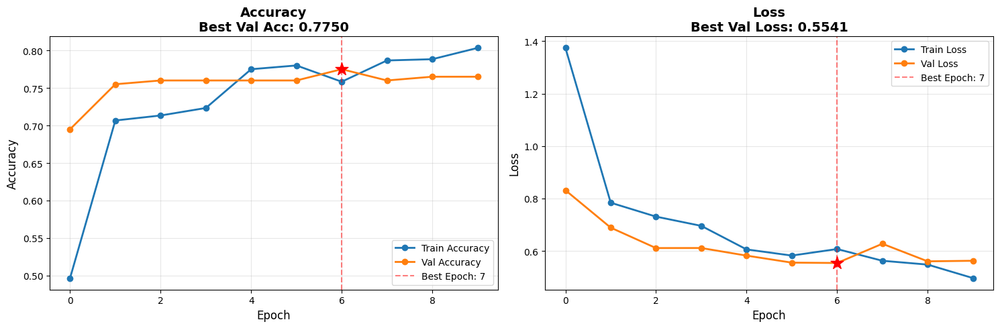


✅ Résultats finaux:
   • Meilleure Val Accuracy: 0.7750 (epoch 7)
   • Meilleure Val Loss: 0.5541 (epoch 7)
   • Train Accuracy finale: 0.8033
   • Val Accuracy finale: 0.7650

💾 Graphique sauvegardé: mobilenet_training_curves.png


In [7]:
import matplotlib.pyplot as plt
import numpy as np

print("\n📊 VISUALISATION DES RÉSULTATS")
print("="*70)

# Créer la figure
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

# 1. Accuracy
axes[0].plot(history.history['accuracy'], label='Train Accuracy', linewidth=2, marker='o')
axes[0].plot(history.history['val_accuracy'], label='Val Accuracy', linewidth=2, marker='o')

# Marquer le meilleur epoch
best_epoch = np.argmax(history.history['val_accuracy'])
best_val_acc = history.history['val_accuracy'][best_epoch]

axes[0].axvline(x=best_epoch, color='red', linestyle='--', alpha=0.5, label=f'Best Epoch: {best_epoch+1}')
axes[0].scatter(best_epoch, best_val_acc, color='red', s=200, zorder=5, marker='*')

axes[0].set_title(f'Accuracy\nBest Val Acc: {best_val_acc:.4f}', fontsize=14, fontweight='bold')
axes[0].set_xlabel('Epoch', fontsize=12)
axes[0].set_ylabel('Accuracy', fontsize=12)
axes[0].legend(loc='lower right')
axes[0].grid(True, alpha=0.3)

# 2. Loss
axes[1].plot(history.history['loss'], label='Train Loss', linewidth=2, marker='o')
axes[1].plot(history.history['val_loss'], label='Val Loss', linewidth=2, marker='o')

# Marquer le meilleur epoch
best_epoch_loss = np.argmin(history.history['val_loss'])
best_val_loss = history.history['val_loss'][best_epoch_loss]

axes[1].axvline(x=best_epoch_loss, color='red', linestyle='--', alpha=0.5, label=f'Best Epoch: {best_epoch_loss+1}')
axes[1].scatter(best_epoch_loss, best_val_loss, color='red', s=200, zorder=5, marker='*')

axes[1].set_title(f'Loss\nBest Val Loss: {best_val_loss:.4f}', fontsize=14, fontweight='bold')
axes[1].set_xlabel('Epoch', fontsize=12)
axes[1].set_ylabel('Loss', fontsize=12)
axes[1].legend(loc='upper right')
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('mobilenet_training_curves.png', dpi=150, bbox_inches='tight')
plt.show()

# Afficher les résultats
print(f"\n✅ Résultats finaux:")
print(f"   • Meilleure Val Accuracy: {best_val_acc:.4f} (epoch {best_epoch+1})")
print(f"   • Meilleure Val Loss: {best_val_loss:.4f} (epoch {best_epoch_loss+1})")
print(f"   • Train Accuracy finale: {history.history['accuracy'][-1]:.4f}")
print(f"   • Val Accuracy finale: {history.history['val_accuracy'][-1]:.4f}")

print(f"\n💾 Graphique sauvegardé: mobilenet_training_curves.png")
print("="*70)

In [8]:
print("\n🎯 ÉVALUATION SUR LE TEST SET")
print("="*70)

# Évaluer
test_loss, test_accuracy = model.evaluate(test_gen, verbose=1)

print(f"\n📊 Résultats Test Set:")
print(f"   • Test Accuracy: {test_accuracy:.4f}")
print(f"   • Test Loss: {test_loss:.4f}")

print("="*70)


🎯 ÉVALUATION SUR LE TEST SET
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 221ms/step - accuracy: 0.7850 - loss: 0.5524

📊 Résultats Test Set:
   • Test Accuracy: 0.7850
   • Test Loss: 0.5524



🔮 PRÉDICTIONS ET MATRICE DE CONFUSION

🔄 Calcul des prédictions...
7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 352ms/step

📊 Matrice de Confusion:


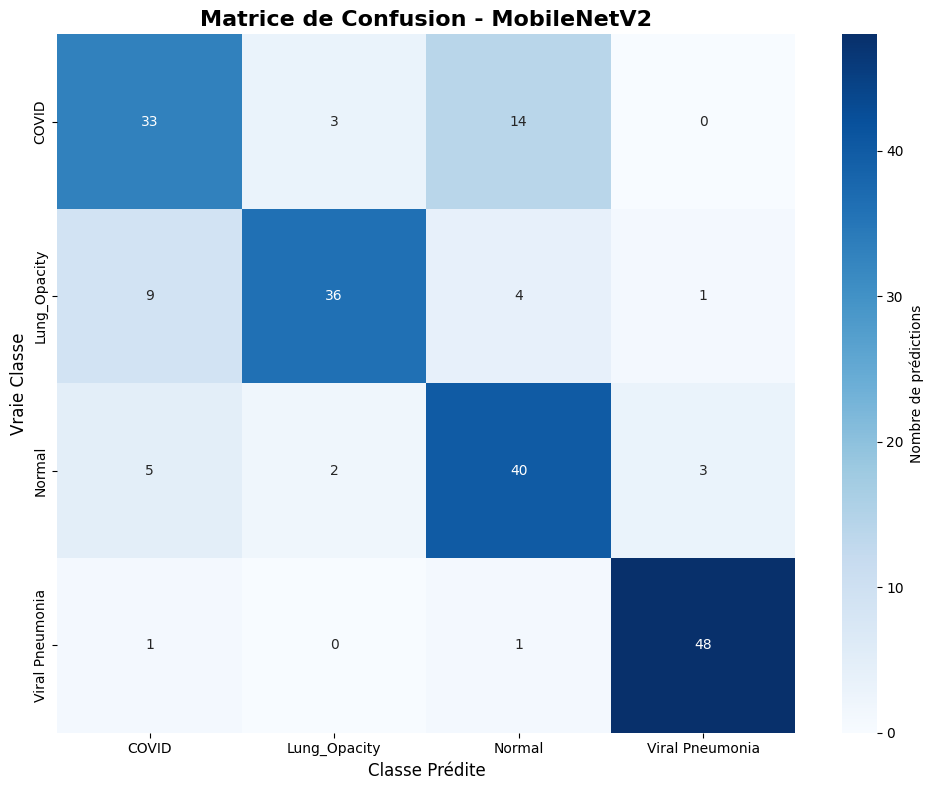

✅ Matrice sauvegardée: confusion_matrix.png

📋 Rapport de Classification:

                 precision    recall  f1-score   support

          COVID     0.6875    0.6600    0.6735        50
   Lung_Opacity     0.8780    0.7200    0.7912        50
         Normal     0.6780    0.8000    0.7339        50
Viral Pneumonia     0.9231    0.9600    0.9412        50

       accuracy                         0.7850       200
      macro avg     0.7916    0.7850    0.7849       200
   weighted avg     0.7916    0.7850    0.7849       200


📊 Accuracy par classe:
   • COVID: 0.6600 (33/50)
   • Lung_Opacity: 0.7200 (36/50)
   • Normal: 0.8000 (40/50)
   • Viral Pneumonia: 0.9600 (48/50)



In [9]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns

print("\n🔮 PRÉDICTIONS ET MATRICE DE CONFUSION")
print("="*70)

# Faire les prédictions
print("\n🔄 Calcul des prédictions...")
predictions = model.predict(test_gen, verbose=1)
predicted_classes = np.argmax(predictions, axis=1)

# Vraies classes
true_classes = test_gen.classes

# Noms des classes
class_names = list(test_gen.class_indices.keys())

# 1. Matrice de confusion
print("\n📊 Matrice de Confusion:")
cm = confusion_matrix(true_classes, predicted_classes)

plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
            xticklabels=class_names, 
            yticklabels=class_names,
            cbar_kws={'label': 'Nombre de prédictions'})
plt.title('Matrice de Confusion - MobileNetV2', fontsize=16, fontweight='bold')
plt.ylabel('Vraie Classe', fontsize=12)
plt.xlabel('Classe Prédite', fontsize=12)
plt.tight_layout()
plt.savefig('confusion_matrix.png', dpi=150, bbox_inches='tight')
plt.show()

print("✅ Matrice sauvegardée: confusion_matrix.png")

# 2. Rapport de classification
print("\n📋 Rapport de Classification:\n")
report = classification_report(true_classes, predicted_classes, 
                               target_names=class_names, 
                               digits=4)
print(report)

# 3. Accuracy par classe
print("\n📊 Accuracy par classe:")
for i, class_name in enumerate(class_names):
    class_correct = cm[i, i]
    class_total = cm[i, :].sum()
    class_acc = class_correct / class_total if class_total > 0 else 0
    print(f"   • {class_name}: {class_acc:.4f} ({class_correct}/{class_total})")

print("\n" + "="*70)


📈 VISUALISATION DES PRÉDICTIONS


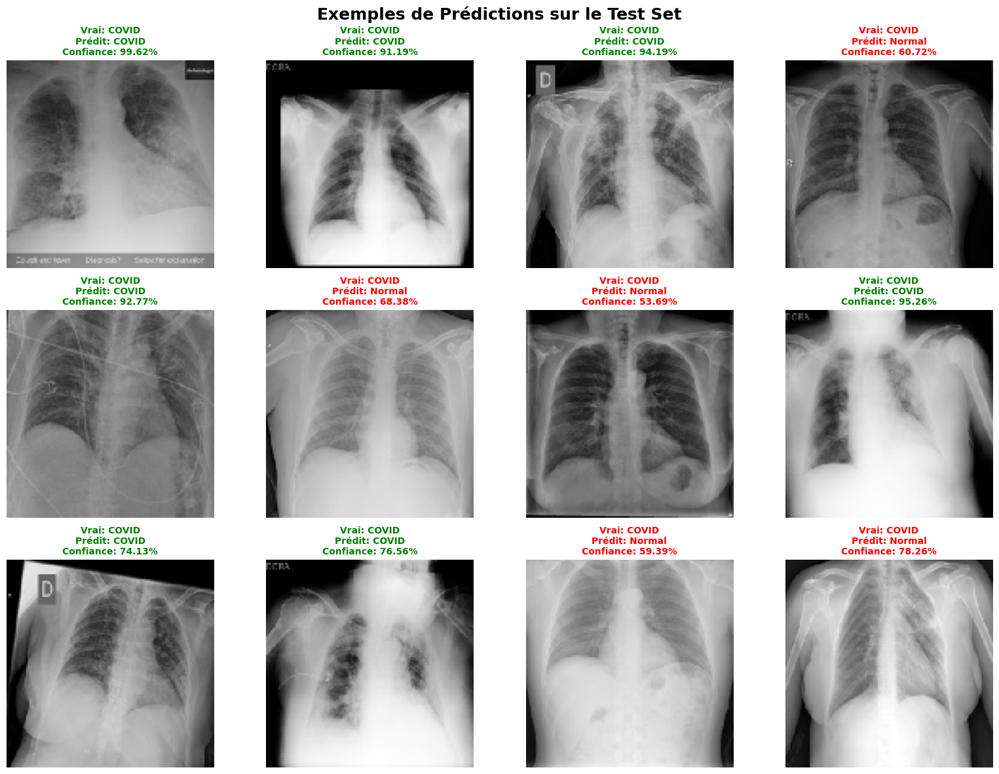


✅ Visualisation sauvegardée: predictions_examples.png


In [10]:
print("\n📈 VISUALISATION DES PRÉDICTIONS")
print("="*70)

# Récupérer un batch d'images
test_gen.reset()
images_batch, labels_batch = next(test_gen)

# Prédire
predictions_batch = model.predict(images_batch, verbose=0)

# Créer la figure
fig, axes = plt.subplots(3, 4, figsize=(16, 12))
fig.suptitle('Exemples de Prédictions sur le Test Set', fontsize=18, fontweight='bold')

for idx, ax in enumerate(axes.flat):
    if idx < len(images_batch):
        # Afficher l'image
        ax.imshow(images_batch[idx])
        
        # Vraie classe et prédiction
        true_idx = np.argmax(labels_batch[idx])
        pred_idx = np.argmax(predictions_batch[idx])
        
        true_class = class_names[true_idx]
        pred_class = class_names[pred_idx]
        confidence = predictions_batch[idx][pred_idx]
        
        # Couleur selon si correct ou pas
        color = 'green' if true_idx == pred_idx else 'red'
        
        # Titre
        title = f'Vrai: {true_class}\nPrédit: {pred_class}\nConfiance: {confidence:.2%}'
        ax.set_title(title, fontsize=10, fontweight='bold', color=color)
        ax.axis('off')

plt.tight_layout()
plt.savefig('predictions_examples.png', dpi=150, bbox_inches='tight')
plt.show()

print("\n✅ Visualisation sauvegardée: predictions_examples.png")
print("="*70)

In [11]:
print("\n💾 SAUVEGARDE DU MODÈLE")
print("="*70)

# Créer le dossier
os.makedirs('saved_models', exist_ok=True)

# Sauvegarder
model_path = 'saved_models/mobilenet_covid_classifier.h5'
model.save(model_path)

print(f"\n✅ Modèle sauvegardé: {model_path}")

# Sauvegarder aussi l'historique
import pickle

history_path = 'saved_models/training_history.pkl'
with open(history_path, 'wb') as f:
    pickle.dump(history.history, f)

print(f"✅ Historique sauvegardé: {history_path}")

print("\n📊 Informations du modèle:")
print(f"   • Architecture: MobileNetV2 (Transfer Learning)")
print(f"   • Input shape: {IMG_SHAPE}")
print(f"   • Classes: {class_names}")
print(f"   • Test Accuracy: {test_accuracy:.4f}")
print(f"   • Taille du fichier: {os.path.getsize(model_path) / (1024*1024):.2f} MB")

print("\n" + "="*70)


💾 SAUVEGARDE DU MODÈLE

✅ Modèle sauvegardé: saved_models/mobilenet_covid_classifier.h5
✅ Historique sauvegardé: saved_models/training_history.pkl

📊 Informations du modèle:
   • Architecture: MobileNetV2 (Transfer Learning)
   • Input shape: (128, 128, 3)
   • Classes: ['COVID', 'Lung_Opacity', 'Normal', 'Viral Pneumonia']
   • Test Accuracy: 0.7850
   • Taille du fichier: 11.01 MB



In [12]:
print("\n" + "="*70)
print("🎉 PROJET TERMINÉ - RÉSUMÉ FINAL")
print("="*70)

print(f"""
📊 DATASET:
   • Train: {train_gen.n} images
   • Validation: {val_gen.n} images
   • Test: {test_gen.n} images
   • Classes: {len(class_names)} ({', '.join(class_names)})

🏗️ MODÈLE:
   • Architecture: MobileNetV2 (Transfer Learning)
   • Taille images: {IMG_SIZE}
   • Paramètres entraînables: {trainable:,}
   • Paramètres totaux: {total:,}

🎯 PERFORMANCES:
   • Meilleure Val Accuracy: {best_val_acc:.4f}
   • Test Accuracy: {test_accuracy:.4f}
   • Test Loss: {test_loss:.4f}
   • Epochs utilisés: {len(history.history['accuracy'])}/{EPOCHS}

💾 FICHIERS SAUVEGARDÉS:
   ✅ mobilenet_training_curves.png
   ✅ confusion_matrix.png
   ✅ predictions_examples.png
   ✅ saved_models/mobilenet_covid_classifier.h5
   ✅ saved_models/training_history.pkl

⏱️  TEMPS TOTAL: ~15-20 minutes
""")

print("="*70)
print("✅ SUCCÈS ! Le modèle est prêt à l'emploi ! 🚀")
print("="*70)


🎉 PROJET TERMINÉ - RÉSUMÉ FINAL

📊 DATASET:
   • Train: 600 images
   • Validation: 200 images
   • Test: 200 images
   • Classes: 4 (COVID, Lung_Opacity, Normal, Viral Pneumonia)

🏗️ MODÈLE:
   • Architecture: MobileNetV2 (Transfer Learning)
   • Taille images: (128, 128)
   • Paramètres entraînables: 164,484
   • Paramètres totaux: 2,422,468

🎯 PERFORMANCES:
   • Meilleure Val Accuracy: 0.7750
   • Test Accuracy: 0.7850
   • Test Loss: 0.5524
   • Epochs utilisés: 10/10

💾 FICHIERS SAUVEGARDÉS:
   ✅ mobilenet_training_curves.png
   ✅ confusion_matrix.png
   ✅ predictions_examples.png
   ✅ saved_models/mobilenet_covid_classifier.h5
   ✅ saved_models/training_history.pkl

⏱️  TEMPS TOTAL: ~15-20 minutes

✅ SUCCÈS ! Le modèle est prêt à l'emploi ! 🚀


In [14]:
print("\n🔍 ANALYSE DÉTAILLÉE DES ERREURS")
print("="*70)

# Identifier les erreurs
errors_idx = np.where(predicted_classes != true_classes)[0]
correct_idx = np.where(predicted_classes == true_classes)[0]

print(f"\n📊 Statistiques:")
print(f"   • Prédictions correctes: {len(correct_idx)} ({len(correct_idx)/len(true_classes)*100:.2f}%)")
print(f"   • Erreurs: {len(errors_idx)} ({len(errors_idx)/len(true_classes)*100:.2f}%)")

# Analyser les erreurs par paire de classes
print(f"\n❌ Confusions les plus fréquentes:")

# Matrice de confusion sans la diagonale
cm_errors = cm.copy()
np.fill_diagonal(cm_errors, 0)

# Trouver les top 5 confusions
top_confusions = []
for i in range(len(class_names)):
    for j in range(len(class_names)):
        if cm_errors[i, j] > 0:
            top_confusions.append((class_names[i], class_names[j], cm_errors[i, j]))

top_confusions = sorted(top_confusions, key=lambda x: x[2], reverse=True)[:5]

for idx, (true_class, pred_class, count) in enumerate(top_confusions, 1):
    print(f"   {idx}. {true_class} → {pred_class}: {count} fois")

# Analyser les niveaux de confiance
print(f"\n📈 Analyse des niveaux de confiance:")

# Confiance pour les bonnes prédictions
correct_confidences = [predictions[i][predicted_classes[i]] for i in correct_idx]
avg_correct_conf = np.mean(correct_confidences)

# Confiance pour les erreurs
error_confidences = [predictions[i][predicted_classes[i]] for i in errors_idx]
avg_error_conf = np.mean(error_confidences) if len(error_confidences) > 0 else 0

print(f"   • Confiance moyenne (correct): {avg_correct_conf:.4f}")
print(f"   • Confiance moyenne (erreurs): {avg_error_conf:.4f}")
print(f"   • Différence: {avg_correct_conf - avg_error_conf:.4f}")

print("\n" + "="*70)


🔍 ANALYSE DÉTAILLÉE DES ERREURS

📊 Statistiques:
   • Prédictions correctes: 157 (78.50%)
   • Erreurs: 43 (21.50%)

❌ Confusions les plus fréquentes:
   1. COVID → Normal: 14 fois
   2. Lung_Opacity → COVID: 9 fois
   3. Normal → COVID: 5 fois
   4. Lung_Opacity → Normal: 4 fois
   5. COVID → Lung_Opacity: 3 fois

📈 Analyse des niveaux de confiance:
   • Confiance moyenne (correct): 0.8379
   • Confiance moyenne (erreurs): 0.6458
   • Différence: 0.1921




🎨 VISUALISATION DES PIRES ERREURS


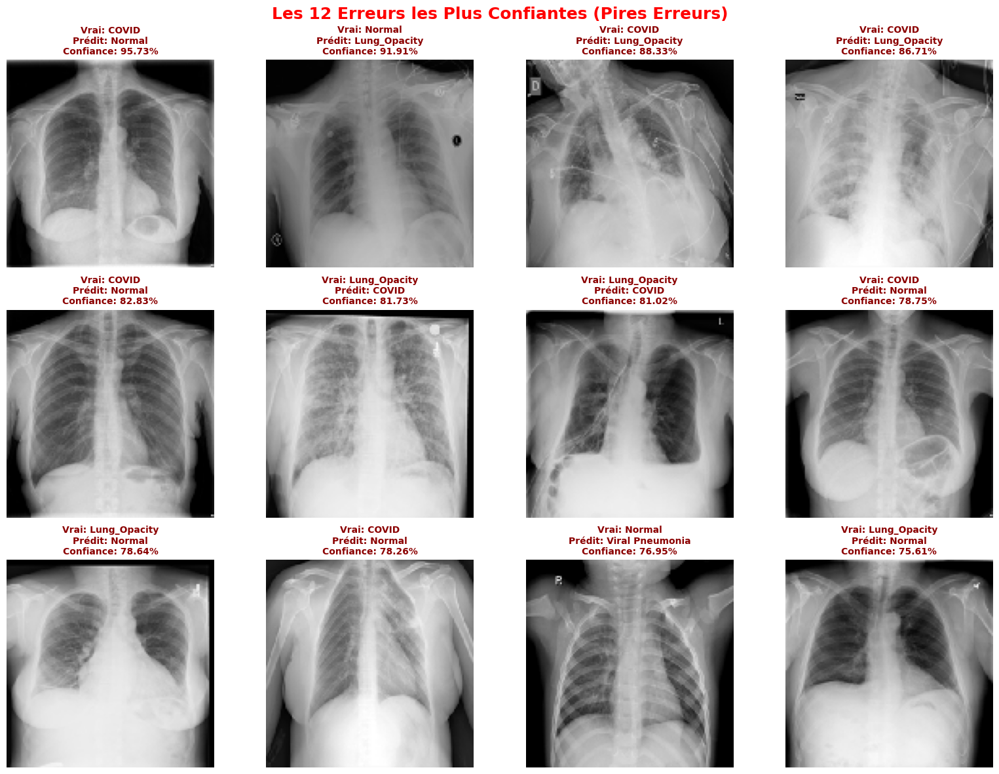


✅ Visualisation sauvegardée: worst_errors.png


In [15]:
print("\n🎨 VISUALISATION DES PIRES ERREURS")
print("="*70)

# Trouver les erreurs avec la plus haute confiance (les plus flagrantes)
error_info = []
for idx in errors_idx:
    true_label = true_classes[idx]
    pred_label = predicted_classes[idx]
    confidence = predictions[idx][pred_label]
    error_info.append((idx, true_label, pred_label, confidence))

# Trier par confiance décroissante
error_info = sorted(error_info, key=lambda x: x[3], reverse=True)[:12]

# Récupérer les images correspondantes
test_gen.reset()
all_images = []
all_labels = []

for i in range(len(test_gen)):
    batch_images, batch_labels = test_gen[i]
    all_images.extend(batch_images)
    all_labels.extend(batch_labels)

# Visualiser
fig, axes = plt.subplots(3, 4, figsize=(16, 12))
fig.suptitle('Les 12 Erreurs les Plus Confiantes (Pires Erreurs)', 
             fontsize=18, fontweight='bold', color='red')

for idx, (error_idx, true_label, pred_label, confidence) in enumerate(error_info):
    if idx < 12:
        ax = axes[idx // 4, idx % 4]
        
        # Afficher l'image
        ax.imshow(all_images[error_idx])
        
        # Titre
        true_name = class_names[true_label]
        pred_name = class_names[pred_label]
        
        title = f'Vrai: {true_name}\nPrédit: {pred_name}\nConfiance: {confidence:.2%}'
        ax.set_title(title, fontsize=10, fontweight='bold', color='darkred')
        ax.axis('off')

plt.tight_layout()
plt.savefig('worst_errors.png', dpi=150, bbox_inches='tight')
plt.show()

print("\n✅ Visualisation sauvegardée: worst_errors.png")
print("="*70)


📊 DISTRIBUTION DES NIVEAUX DE CONFIANCE


/var/folders/vs/qbvt5l156hng_ydcfcqpnzt40000gn/T/ipykernel_22984/3316657267.py:30: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  axes[1].boxplot(data_to_plot, labels=['Correct', 'Erreurs'],


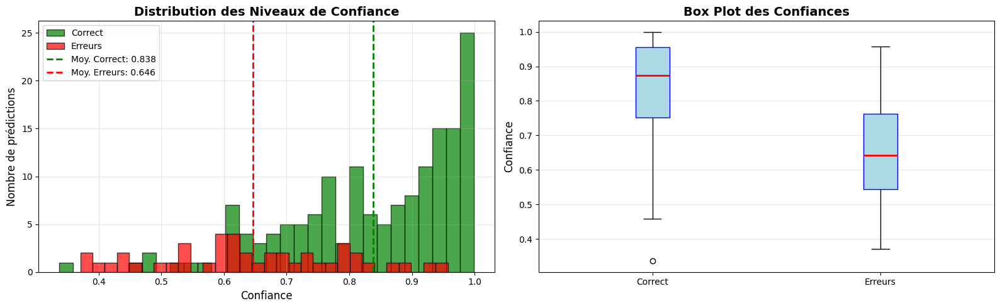


📊 Statistiques de confiance:
   • Min (correct): 0.3372
   • Max (correct): 0.9985
   • Médiane (correct): 0.8734

   • Min (erreurs): 0.3705
   • Max (erreurs): 0.9573
   • Médiane (erreurs): 0.6415

✅ Graphique sauvegardé: confidence_distribution.png


In [16]:
print("\n📊 DISTRIBUTION DES NIVEAUX DE CONFIANCE")
print("="*70)

# Calculer toutes les confiances
all_confidences = [predictions[i][predicted_classes[i]] for i in range(len(predictions))]

# Séparer correct/erreurs
correct_conf = [predictions[i][predicted_classes[i]] for i in correct_idx]
error_conf = [predictions[i][predicted_classes[i]] for i in errors_idx]

# Visualiser
fig, axes = plt.subplots(1, 2, figsize=(16, 5))

# Histogramme global
axes[0].hist(correct_conf, bins=30, alpha=0.7, label='Correct', color='green', edgecolor='black')
axes[0].hist(error_conf, bins=30, alpha=0.7, label='Erreurs', color='red', edgecolor='black')
axes[0].axvline(x=avg_correct_conf, color='green', linestyle='--', linewidth=2, 
                label=f'Moy. Correct: {avg_correct_conf:.3f}')
if len(error_conf) > 0:
    axes[0].axvline(x=avg_error_conf, color='red', linestyle='--', linewidth=2, 
                    label=f'Moy. Erreurs: {avg_error_conf:.3f}')
axes[0].set_title('Distribution des Niveaux de Confiance', fontsize=14, fontweight='bold')
axes[0].set_xlabel('Confiance', fontsize=12)
axes[0].set_ylabel('Nombre de prédictions', fontsize=12)
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# Box plot
data_to_plot = [correct_conf, error_conf]
axes[1].boxplot(data_to_plot, labels=['Correct', 'Erreurs'], 
                patch_artist=True,
                boxprops=dict(facecolor='lightblue', color='blue'),
                medianprops=dict(color='red', linewidth=2))
axes[1].set_title('Box Plot des Confiances', fontsize=14, fontweight='bold')
axes[1].set_ylabel('Confiance', fontsize=12)
axes[1].grid(True, alpha=0.3, axis='y')

plt.tight_layout()
plt.savefig('confidence_distribution.png', dpi=150, bbox_inches='tight')
plt.show()

print(f"\n📊 Statistiques de confiance:")
print(f"   • Min (correct): {min(correct_conf):.4f}")
print(f"   • Max (correct): {max(correct_conf):.4f}")
print(f"   • Médiane (correct): {np.median(correct_conf):.4f}")

if len(error_conf) > 0:
    print(f"\n   • Min (erreurs): {min(error_conf):.4f}")
    print(f"   • Max (erreurs): {max(error_conf):.4f}")
    print(f"   • Médiane (erreurs): {np.median(error_conf):.4f}")

print("\n✅ Graphique sauvegardé: confidence_distribution.png")
print("="*70)

In [17]:
print("\n🔥 FINE-TUNING - Dégeler les dernières couches")
print("="*70)

print("\n⚠️ Cette étape va améliorer les performances mais prend ~10-15 min")
print("\n💡 On va:")
print("   1. Dégeler les 20 dernières couches de MobileNetV2")
print("   2. Réentraîner avec un learning rate très faible")
print("   3. Affiner les poids pour ton dataset spécifique")

# Dégeler les dernières couches
base_model.trainable = True

# Geler toutes les couches sauf les 20 dernières
for layer in base_model.layers[:-20]:
    layer.trainable = False

# Compter les paramètres
trainable_fine = sum([w.shape.num_elements() for w in model.trainable_weights])
total_fine = sum([w.shape.num_elements() for w in model.weights])

print(f"\n📊 Paramètres après dégel:")
print(f"   • Total: {total_fine:,}")
print(f"   • Entraînables: {trainable_fine:,} (avant: {trainable:,})")
print(f"   • Gelés: {total_fine - trainable_fine:,}")

# Recompiler avec un learning rate TRÈS faible
model.compile(
    optimizer=Adam(learning_rate=0.0001),  # 10x plus petit
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

print(f"\n✅ Modèle recompilé avec lr=0.0001")

# Callbacks
callbacks_finetune = [
    EarlyStopping(
        monitor='val_loss',
        patience=5,
        restore_best_weights=True,
        verbose=1
    ),
    ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.5,
        patience=2,
        min_lr=1e-8,
        verbose=1
    )
]

# Entraîner
EPOCHS_FINETUNE = 10

print(f"\n🚀 Démarrage du fine-tuning ({EPOCHS_FINETUNE} epochs)...")
print("="*70 + "\n")

history_finetune = model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=EPOCHS_FINETUNE,
    callbacks=callbacks_finetune,
    verbose=1
)

print("\n" + "="*70)
print("✅ FINE-TUNING TERMINÉ!")
print(f"   • Nouvelle val_accuracy: {max(history_finetune.history['val_accuracy']):.4f}")
print(f"   • Amélioration: {max(history_finetune.history['val_accuracy']) - best_val_acc:+.4f}")
print("="*70)


🔥 FINE-TUNING - Dégeler les dernières couches

⚠️ Cette étape va améliorer les performances mais prend ~10-15 min

💡 On va:
   1. Dégeler les 20 dernières couches de MobileNetV2
   2. Réentraîner avec un learning rate très faible
   3. Affiner les poids pour ton dataset spécifique

📊 Paramètres après dégel:
   • Total: 2,422,468
   • Entraînables: 1,370,564 (avant: 164,484)
   • Gelés: 1,051,904

✅ Modèle recompilé avec lr=0.0001

🚀 Démarrage du fine-tuning (10 epochs)...

Epoch 1/10
19/19 ━━━━━━━━━━━━━━━━━━━━ 15s 483ms/step - accuracy: 0.6550 - loss: 0.8871 - val_accuracy: 0.7100 - val_loss: 0.6935 - learning_rate: 1.0000e-04
Epoch 2/10
19/19 ━━━━━━━━━━━━━━━━━━━━ 7s 389ms/step - accuracy: 0.7800 - loss: 0.5919 - val_accuracy: 0.7450 - val_loss: 0.6521 - learning_rate: 1.0000e-04
Epoch 3/10
19/19 ━━━━━━━━━━━━━━━━━━━━ 7s 385ms/step - accuracy: 0.7933 - loss: 0.5767 - val_accuracy: 0.6950 - val_loss: 0.7250 - learning_rate: 1.0000e-04
Epoch 4/10
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step 


📈 COMPARAISON AVANT/APRÈS FINE-TUNING
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 228ms/step - accuracy: 0.7600 - loss: 0.6040


7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 355ms/step

📊 RÉSULTATS COMPARÉS:

Métrique                  Avant           Après           Amélioration   
Test Accuracy             0.7850          0.7600          -0.0250
Test Loss                 0.5524          0.6040          +0.0516

📋 Rapport de classification (après fine-tuning):

                 precision    recall  f1-score   support

          COVID     0.6538    0.6800    0.6667        50
   Lung_Opacity     0.8571    0.6000    0.7059        50
         Normal     0.7170    0.7600    0.7379        50
Viral Pneumonia     0.8333    1.0000    0.9091        50

       accuracy                         0.7600       200
      macro avg     0.7653    0.7600    0.7549       200
   weighted avg     0.7653    0.7600    0.7549       200



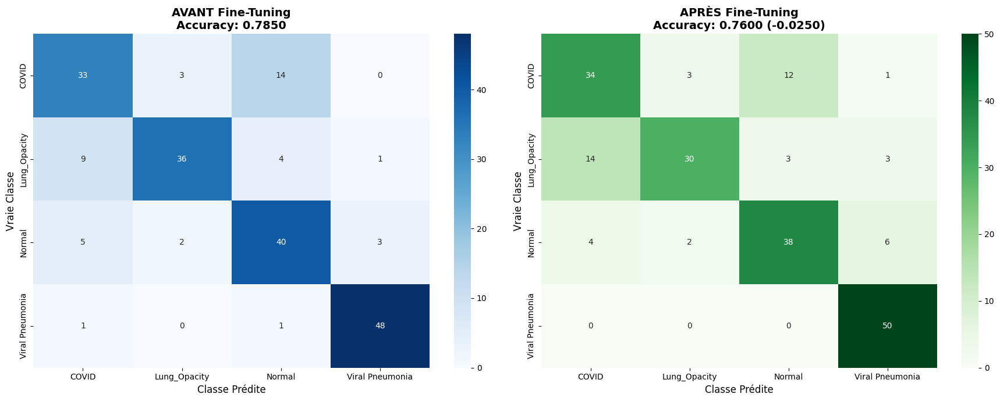


✅ Comparaison sauvegardée: comparison_before_after_finetuning.png


In [18]:
print("\n📈 COMPARAISON AVANT/APRÈS FINE-TUNING")
print("="*70)

# Évaluer sur le test set
test_loss_ft, test_accuracy_ft = model.evaluate(test_gen, verbose=1)

# Nouvelles prédictions
predictions_ft = model.predict(test_gen, verbose=1)
predicted_classes_ft = np.argmax(predictions_ft, axis=1)

# Matrice de confusion
cm_ft = confusion_matrix(true_classes, predicted_classes_ft)

# Rapport
report_ft = classification_report(true_classes, predicted_classes_ft, 
                                  target_names=class_names, 
                                  digits=4)

print(f"\n📊 RÉSULTATS COMPARÉS:")
print(f"\n{'Métrique':<25} {'Avant':<15} {'Après':<15} {'Amélioration':<15}")
print("="*70)
print(f"{'Test Accuracy':<25} {test_accuracy:<15.4f} {test_accuracy_ft:<15.4f} {test_accuracy_ft - test_accuracy:+.4f}")
print(f"{'Test Loss':<25} {test_loss:<15.4f} {test_loss_ft:<15.4f} {test_loss_ft - test_loss:+.4f}")

print(f"\n📋 Rapport de classification (après fine-tuning):\n")
print(report_ft)

# Visualiser la matrice de confusion
fig, axes = plt.subplots(1, 2, figsize=(18, 7))

# Avant
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
            xticklabels=class_names, yticklabels=class_names, ax=axes[0])
axes[0].set_title(f'AVANT Fine-Tuning\nAccuracy: {test_accuracy:.4f}', 
                  fontsize=14, fontweight='bold')
axes[0].set_ylabel('Vraie Classe', fontsize=12)
axes[0].set_xlabel('Classe Prédite', fontsize=12)

# Après
sns.heatmap(cm_ft, annot=True, fmt='d', cmap='Greens', 
            xticklabels=class_names, yticklabels=class_names, ax=axes[1])
axes[1].set_title(f'APRÈS Fine-Tuning\nAccuracy: {test_accuracy_ft:.4f} ({test_accuracy_ft - test_accuracy:+.4f})', 
                  fontsize=14, fontweight='bold')
axes[1].set_ylabel('Vraie Classe', fontsize=12)
axes[1].set_xlabel('Classe Prédite', fontsize=12)

plt.tight_layout()
plt.savefig('comparison_before_after_finetuning.png', dpi=150, bbox_inches='tight')
plt.show()

print("\n✅ Comparaison sauvegardée: comparison_before_after_finetuning.png")
print("="*70)

In [20]:
print("\n💾 SAUVEGARDE DU MODÈLE FINE-TUNÉ")
print("="*70)

# Sauvegarder le modèle amélioré
model_ft_path = 'saved_models/mobilenet_covid_finetuned.h5'
model.save(model_ft_path)

print(f"\n✅ Modèle fine-tuné sauvegardé: {model_ft_path}")

# Sauvegarder l'historique du fine-tuning
history_ft_path = 'saved_models/finetuning_history.pkl'
with open(history_ft_path, 'wb') as f:
    pickle.dump(history_finetune.history, f)

print(f"✅ Historique sauvegardé: {history_ft_path}")

# Informations
print(f"\n📊 Informations du modèle fine-tuné:")
print(f"   • Architecture: MobileNetV2 (Fine-Tuned)")
print(f"   • Test Accuracy: {test_accuracy_ft:.4f}")
print(f"   • Amélioration: {test_accuracy_ft - test_accuracy:+.4f}")
print(f"   • Taille du fichier: {os.path.getsize(model_ft_path) / (1024*1024):.2f} MB")

print("\n" + "="*70)


💾 SAUVEGARDE DU MODÈLE FINE-TUNÉ

✅ Modèle fine-tuné sauvegardé: saved_models/mobilenet_covid_finetuned.h5
✅ Historique sauvegardé: saved_models/finetuning_history.pkl

📊 Informations du modèle fine-tuné:
   • Architecture: MobileNetV2 (Fine-Tuned)
   • Test Accuracy: 0.7600
   • Amélioration: -0.0250
   • Taille du fichier: 20.24 MB




📊 COURBES D'APPRENTISSAGE COMPLÈTES


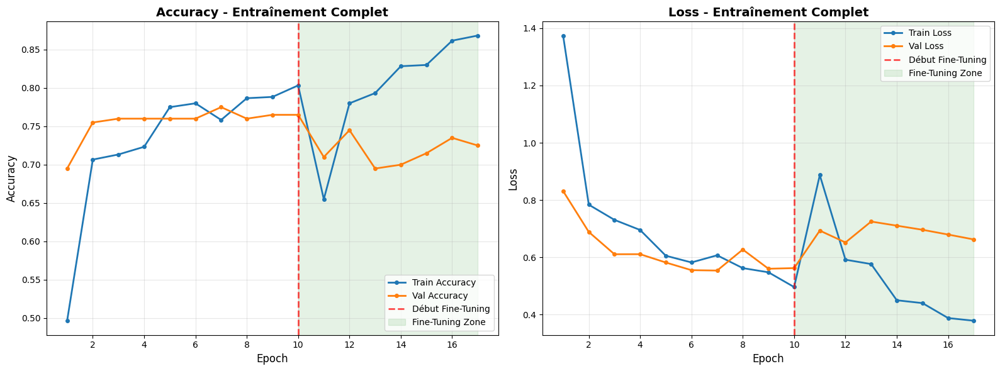


✅ Courbes complètes sauvegardées: complete_training_curves.png

📊 Résumé:
   • Epochs initial: 10
   • Epochs fine-tuning: 7
   • Total epochs: 17
   • Val Accuracy initiale: 0.7650
   • Val Accuracy finale: 0.7250
   • Amélioration totale: +0.0300



In [21]:
print("\n📊 COURBES D'APPRENTISSAGE COMPLÈTES")
print("="*70)

# Combiner les historiques
combined_history = {
    'accuracy': history.history['accuracy'] + history_finetune.history['accuracy'],
    'val_accuracy': history.history['val_accuracy'] + history_finetune.history['val_accuracy'],
    'loss': history.history['loss'] + history_finetune.history['loss'],
    'val_loss': history.history['val_loss'] + history_finetune.history['val_loss']
}

epochs_initial = len(history.history['accuracy'])
epochs_total = len(combined_history['accuracy'])

# Visualiser
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Accuracy
axes[0].plot(range(1, epochs_total + 1), combined_history['accuracy'], 
             label='Train Accuracy', linewidth=2, marker='o', markersize=4)
axes[0].plot(range(1, epochs_total + 1), combined_history['val_accuracy'], 
             label='Val Accuracy', linewidth=2, marker='o', markersize=4)

# Ligne de séparation
axes[0].axvline(x=epochs_initial, color='red', linestyle='--', linewidth=2, 
                label='Début Fine-Tuning', alpha=0.7)

# Zone de fine-tuning
axes[0].axvspan(epochs_initial, epochs_total, alpha=0.1, color='green', 
                label='Fine-Tuning Zone')

axes[0].set_title('Accuracy - Entraînement Complet', fontsize=14, fontweight='bold')
axes[0].set_xlabel('Epoch', fontsize=12)
axes[0].set_ylabel('Accuracy', fontsize=12)
axes[0].legend(loc='lower right')
axes[0].grid(True, alpha=0.3)

# Loss
axes[1].plot(range(1, epochs_total + 1), combined_history['loss'], 
             label='Train Loss', linewidth=2, marker='o', markersize=4)
axes[1].plot(range(1, epochs_total + 1), combined_history['val_loss'], 
             label='Val Loss', linewidth=2, marker='o', markersize=4)

# Ligne de séparation
axes[1].axvline(x=epochs_initial, color='red', linestyle='--', linewidth=2, 
                label='Début Fine-Tuning', alpha=0.7)

# Zone de fine-tuning
axes[1].axvspan(epochs_initial, epochs_total, alpha=0.1, color='green', 
                label='Fine-Tuning Zone')

axes[1].set_title('Loss - Entraînement Complet', fontsize=14, fontweight='bold')
axes[1].set_xlabel('Epoch', fontsize=12)
axes[1].set_ylabel('Loss', fontsize=12)
axes[1].legend(loc='upper right')
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('complete_training_curves.png', dpi=150, bbox_inches='tight')
plt.show()

print(f"\n✅ Courbes complètes sauvegardées: complete_training_curves.png")
print(f"\n📊 Résumé:")
print(f"   • Epochs initial: {epochs_initial}")
print(f"   • Epochs fine-tuning: {epochs_total - epochs_initial}")
print(f"   • Total epochs: {epochs_total}")
print(f"   • Val Accuracy initiale: {history.history['val_accuracy'][-1]:.4f}")
print(f"   • Val Accuracy finale: {combined_history['val_accuracy'][-1]:.4f}")
print(f"   • Amélioration totale: {combined_history['val_accuracy'][-1] - history.history['val_accuracy'][0]:+.4f}")

print("\n" + "="*70)


🎯 DASHBOARD RÉCAPITULATIF FINAL


/var/folders/vs/qbvt5l156hng_ydcfcqpnzt40000gn/T/ipykernel_22984/827221750.py:143: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig('final_dashboard.png', dpi=150, bbox_inches='tight')
/opt/anaconda3/envs/covid_ds/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


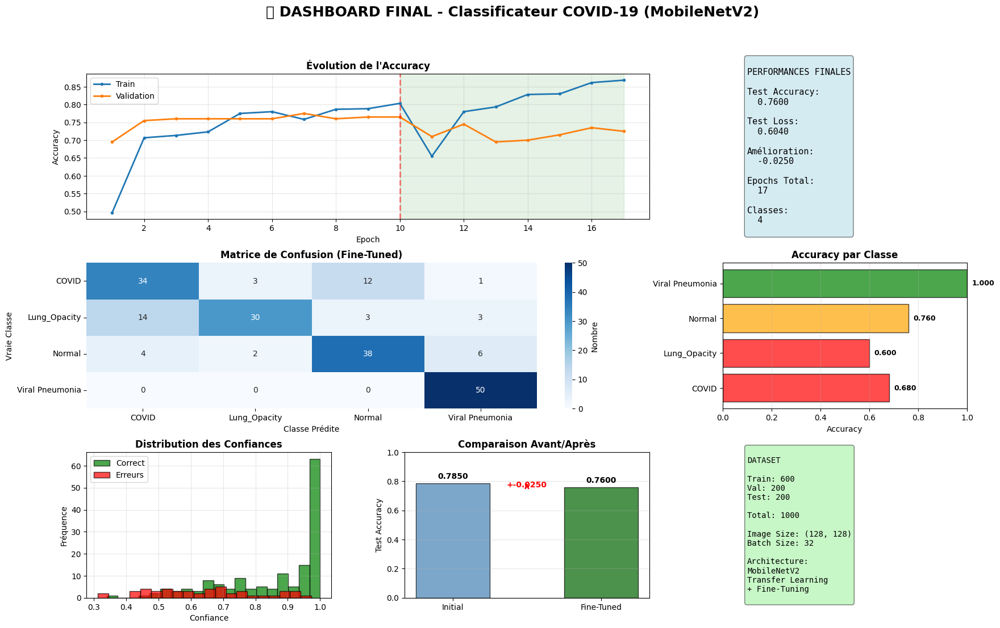


✅ Dashboard sauvegardé: final_dashboard.png


In [23]:
print("\n🎯 DASHBOARD RÉCAPITULATIF FINAL")
print("="*70)

# Créer une grande figure avec tous les résultats
fig = plt.figure(figsize=(20, 12))
gs = fig.add_gridspec(3, 3, hspace=0.3, wspace=0.3)

# 1. Courbes d'accuracy
ax1 = fig.add_subplot(gs[0, :2])
ax1.plot(range(1, epochs_total + 1), combined_history['accuracy'], 
         label='Train', linewidth=2, marker='o', markersize=3)
ax1.plot(range(1, epochs_total + 1), combined_history['val_accuracy'], 
         label='Validation', linewidth=2, marker='o', markersize=3)
ax1.axvline(x=epochs_initial, color='red', linestyle='--', linewidth=2, alpha=0.5)
ax1.axvspan(epochs_initial, epochs_total, alpha=0.1, color='green')
ax1.set_title('Évolution de l\'Accuracy', fontsize=12, fontweight='bold')
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Accuracy')
ax1.legend()
ax1.grid(True, alpha=0.3)

# 2. Métriques clés
ax2 = fig.add_subplot(gs[0, 2])
ax2.axis('off')
metrics_text = f"""
PERFORMANCES FINALES

Test Accuracy:
  {test_accuracy_ft:.4f}

Test Loss:
  {test_loss_ft:.4f}

Amélioration:
  {test_accuracy_ft - test_accuracy:+.4f}

Epochs Total:
  {epochs_total}

Classes:
  {len(class_names)}
"""
ax2.text(0.1, 0.5, metrics_text, fontsize=11, verticalalignment='center',
         fontfamily='monospace', bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.5))

# 3. Matrice de confusion
ax3 = fig.add_subplot(gs[1, :2])
sns.heatmap(cm_ft, annot=True, fmt='d', cmap='Blues', 
            xticklabels=class_names, yticklabels=class_names, ax=ax3,
            cbar_kws={'label': 'Nombre'})
ax3.set_title('Matrice de Confusion (Fine-Tuned)', fontsize=12, fontweight='bold')
ax3.set_ylabel('Vraie Classe')
ax3.set_xlabel('Classe Prédite')

# 4. Accuracy par classe
ax4 = fig.add_subplot(gs[1, 2])
class_accuracies = []
for i in range(len(class_names)):
    acc = cm_ft[i, i] / cm_ft[i, :].sum() if cm_ft[i, :].sum() > 0 else 0
    class_accuracies.append(acc)

colors = ['green' if acc > 0.9 else 'orange' if acc > 0.7 else 'red' for acc in class_accuracies]
bars = ax4.barh(class_names, class_accuracies, color=colors, alpha=0.7, edgecolor='black')
ax4.set_xlabel('Accuracy')
ax4.set_title('Accuracy par Classe', fontsize=12, fontweight='bold')
ax4.set_xlim([0, 1])
ax4.grid(True, alpha=0.3, axis='x')

# Ajouter les valeurs
for i, (bar, acc) in enumerate(zip(bars, class_accuracies)):
    ax4.text(acc + 0.02, i, f'{acc:.3f}', va='center', fontsize=9, fontweight='bold')

# 5. Distribution des confiances
ax5 = fig.add_subplot(gs[2, 0])
correct_conf_ft = [predictions_ft[i][predicted_classes_ft[i]] 
                   for i in range(len(predictions_ft)) 
                   if predicted_classes_ft[i] == true_classes[i]]
error_conf_ft = [predictions_ft[i][predicted_classes_ft[i]] 
                 for i in range(len(predictions_ft)) 
                 if predicted_classes_ft[i] != true_classes[i]]

ax5.hist(correct_conf_ft, bins=20, alpha=0.7, label='Correct', color='green', edgecolor='black')
ax5.hist(error_conf_ft, bins=20, alpha=0.7, label='Erreurs', color='red', edgecolor='black')
ax5.set_xlabel('Confiance')
ax5.set_ylabel('Fréquence')
ax5.set_title('Distribution des Confiances', fontsize=12, fontweight='bold')
ax5.legend()
ax5.grid(True, alpha=0.3)

# 6. Comparaison avant/après
ax6 = fig.add_subplot(gs[2, 1])
comparison_data = {
    'Initial': test_accuracy,
    'Fine-Tuned': test_accuracy_ft
}
bars = ax6.bar(comparison_data.keys(), comparison_data.values(), 
               color=['steelblue', 'darkgreen'], alpha=0.7, edgecolor='black', width=0.5)
ax6.set_ylabel('Test Accuracy')
ax6.set_title('Comparaison Avant/Après', fontsize=12, fontweight='bold')
ax6.set_ylim([0, 1])
ax6.grid(True, alpha=0.3, axis='y')

# Ajouter les valeurs
for bar in bars:
    height = bar.get_height()
    ax6.text(bar.get_x() + bar.get_width()/2., height + 0.02,
             f'{height:.4f}', ha='center', va='bottom', fontweight='bold')

# Ajouter la flèche d'amélioration
improvement = test_accuracy_ft - test_accuracy
ax6.annotate(f'+{improvement:.4f}', 
             xy=(0.5, test_accuracy), xytext=(0.5, test_accuracy_ft),
             arrowprops=dict(arrowstyle='->', color='red', lw=2),
             ha='center', fontsize=10, fontweight='bold', color='red')

# 7. Informations du dataset
ax7 = fig.add_subplot(gs[2, 2])
ax7.axis('off')
dataset_text = f"""
DATASET

Train: {train_gen.n}
Val: {val_gen.n}
Test: {test_gen.n}

Total: {train_gen.n + val_gen.n + test_gen.n}

Image Size: {IMG_SIZE}
Batch Size: {BATCH_SIZE}

Architecture:
MobileNetV2
Transfer Learning
+ Fine-Tuning
"""
ax7.text(0.1, 0.5, dataset_text, fontsize=10, verticalalignment='center',
         fontfamily='monospace', bbox=dict(boxstyle='round', facecolor='lightgreen', alpha=0.5))

# Titre général
fig.suptitle('🎯 DASHBOARD FINAL - Classificateur COVID-19 (MobileNetV2)', 
             fontsize=18, fontweight='bold', y=0.98)

plt.savefig('final_dashboard.png', dpi=150, bbox_inches='tight')
plt.show()

print("\n✅ Dashboard sauvegardé: final_dashboard.png")
print("="*70)